# Introduction
This is the main file for presenting my work, there are other notebooks beside this one (such as the notebook "x" for GANs) that I created other generative models to see which one works better. The methods are based on François Chollet - Deep Learning with Python, David Foster - Generative Deep Learning: Teaching Machines to Paint, Write, Compose, and Play and videos and codes provided in Mr Jeremie Wenger's notebooks. I made GANs with and without batch normalization, trained the generator twice, trained the discriminator twice, and tried different learning rates for the discriminator and generator plus some other techniques mentioned in "NIPS 2016 Workshop on Adversarial Training - Soumith Chintala - How to train a GAN" video. I also tried VAE models on this database.

# GAN
## First Attempt
Technically this is my first attempt in this notebook and there are other GANs defined in notebook "x" and "z". This is the GAN that I somehow was sure that everything that I wanted is included and I can present it as the main notebook.

In [13]:
# importing essentials
import os
import sys
import pathlib

import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf

I obtained the Sokoto Coventry Fingerprint Dataset (SOCOFing) from Kaggle, it is accessible at [this link](https://www.kaggle.com/datasets/ruizgara/socofing). The dataset includes two versions: altered and real. For this project, I exclusively employed the real versions. The dataset is stored in the directory specified as `img_dir`, and the resulting images will be saved in the directory denoted as `out_dir`. The image size has been reduced to 64 for faster computation. The dataset comprises 6000 fingerprint images. The authors of the research paper explicitly state, "This dataset is provided AS IS for noncommercial not-for-profit research purposes only," defining that this GAN is based on experiments conducted in other separate notebooks, which are provided alongside this main notebook. I wrote the codes in an online Jupyter notebook available to goldsmiths students. Therefore, I do not need to write the whole address when referring to a directory, the base directory is where the notebook is located by default.

In [14]:
img_dir = "Fingerprints/Fingerprints"
out_dir = "generated-grayscale-final"

if not os.path.isdir(out_dir):
    os.mkdir(out_dir)

batch_size = 32 # 128
img_size = 64

dataset = tf.keras.utils.image_dataset_from_directory(
    img_dir,
    label_mode=None,
    image_size=(img_size, img_size),
    batch_size=batch_size,
    smart_resize=True
)

Found 6000 files belonging to 1 classes.


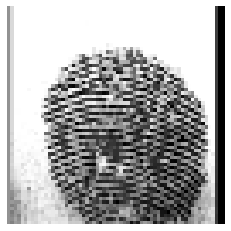

(32, 64, 64, 3)


In [19]:
for batch in dataset.take(1):
    images = batch

# Choose a random index from the batch
random_index = np.random.randint(0, batch_size)

# Select the image at the random index
random_image = images[random_index]

# Display the random image
plt.imshow(random_image.numpy().astype("uint8"))
plt.axis('off')
plt.show()

for x in dataset:
  print(x.numpy().shape)
  break

Upon observation, it becomes apparent that despite the apparent black and white appearance of our images, they are actually composed of 3 color channels. As a result, we intend to transform them into a single-channel format. Furthermore, we will normalize our data within the range of -1 to 1. Although there are alternative methods, such as normalization between 0 and 1, the choice to normalize between -1 and 1 is guided by the techniques illustrated in the notebook videos provided.

In [15]:
dataset = dataset.map(lambda x: (tf.image.rgb_to_grayscale(x),))
dataset = dataset.map(lambda x: (x / 127.5) - 1.0) #normalize input between -1 and 1 (instead of 0 and 1)

In notebook "z", we can see the effect of not changing our data set into grayscale (I kept all the 3 colour channels on that notebook), which causes colourful pixels in the outcome of our model.

In [5]:
for x in dataset:
    print(x[0].numpy().shape)
    break
    
dataset_numpy = np.concatenate(list(dataset.as_numpy_iterator()), axis=0)

min_value = np.min(dataset_numpy)
max_value = np.max(dataset_numpy)

print("Minimum pixel value:", min_value)
print("Maximum pixel value:", max_value)


(64, 64, 1)
Minimum pixel value: -1.0
Maximum pixel value: 0.9998001


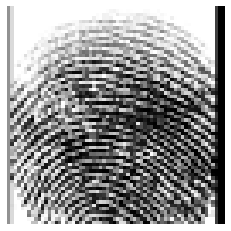

In [6]:

for x in dataset:
    plt.axis("off")
    plt.imshow(((x[0].numpy() + 1) / 2).squeeze(), cmap='gray', vmin=0, vmax=1)
    break


Our data has been successfully normalized and transformed into a single channel. In constructing our model, I will inject artificial noise into the discriminator. This noise will be introduced solely after the input layer. The code closely follows the examples provided in the notebooks and the book, with some additional elements seamlessly integrated. Notably, the 2D convolutional layers employ a 4-kernel size and a stride of 2. "Same" padding is utilized to ensure the output image size is maintained after each Conv2D layer, achieved by inserting zeros between elements.

In [16]:
class AddNoise(tf.keras.layers.Layer):
    def __init__(self, stddev, mean=0.0, **kwargs):
        super(AddNoise, self).__init__(**kwargs)
        self.stddev = stddev
        self.mean = mean

    def call(self, inputs, training=None):
        if training:
            # Generate noise with the specified standard deviation and mean
            noise = tf.random.normal(shape=tf.shape(inputs), mean=self.mean, stddev=self.stddev)
            return inputs + noise
        return inputs


Within the generator, we will incorporate Gaussian Noise following each Conv2D transpose layer. I couldn't locate a precise distinction between artificial noise and Gaussian Noise (as explained in one of the GAN notebook's videos). Referring to a [Quora post](https://www.quora.com/What-is-the-difference-between-Gaussian-noise-and-random-valued-noise-What-are-their-applications-in-signal-processing-or-communication-engineering), I defined Gaussian noise as having a zero mean, while artificial noise is described with a mean of 0.1.

In [17]:
def build_discriminator():
    return tf.keras.Sequential(
        [
            tf.keras.Input(shape=(64, 64, 1)),
            AddNoise(stddev=0.2, mean=0.2),  # Add noise to the output of the first layer
            tf.keras.layers.Conv2D(64, kernel_size=3, strides=2, padding="same"),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.LeakyReLU(alpha=0.2),
            tf.keras.layers.Dropout(0.1),
            tf.keras.layers.Conv2D(128, kernel_size=3, strides=2, padding="same"),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.LeakyReLU(alpha=0.2),
            tf.keras.layers.Dropout(0.1),
            tf.keras.layers.Conv2D(128, kernel_size=3, strides=2, padding="same"),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.LeakyReLU(alpha=0.2),
            tf.keras.layers.Dropout(0.1),
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(1, activation="sigmoid"),
        ],
        name="discriminator",
    )
discriminator = build_discriminator()

In [6]:
discriminator.summary()

Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 add_noise (AddNoise)        (None, 64, 64, 1)         0         
                                                                 
 conv2d (Conv2D)             (None, 32, 32, 64)        640       
                                                                 
 batch_normalization (Batch  (None, 32, 32, 64)        256       
 Normalization)                                                  
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 64)        0         
                                                                 
 dropout (Dropout)           (None, 32, 32, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 128)       73856     
                                                     

In [18]:
def build_generator(latent_dim = 128):
    return tf.keras.Sequential(
        [
            tf.keras.Input(shape=(latent_dim,)),
            tf.keras.layers.Dense(8 * 8 * 128),
            tf.keras.layers.Reshape((8, 8, 128)),
            tf.keras.layers.Conv2DTranspose(128, kernel_size=3, strides=2, padding="same"),
            AddNoise(stddev=0.1, mean=0.0),  # Add Gaussian noise 
            tf.keras.layers.LeakyReLU(alpha=0.2),
            AddNoise(stddev=0.1, mean=0.0),  # Add Gaussian noise 
            tf.keras.layers.Conv2DTranspose(256, kernel_size=3, strides=2, padding="same"),
            AddNoise(stddev=0.1, mean=0.0),  # Add Gaussian noise 
            tf.keras.layers.LeakyReLU(alpha=0.2),
            AddNoise(stddev=0.1, mean=0.0),  # Add Gaussian noise 
            tf.keras.layers.Conv2DTranspose(512, kernel_size=3, strides=2, padding="same"),
            AddNoise(stddev=0.1, mean=0.0),  # Add Gaussian noise 
            tf.keras.layers.LeakyReLU(alpha=0.2),
            AddNoise(stddev=0.1, mean=0.0),  # Add Gaussian noise 
            tf.keras.layers.Conv2D(1, kernel_size=5, padding="same", activation="tanh"),
        ],
        name="generator",
    )

generator = build_generator()

In [8]:
generator.summary()

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1 (Dense)             (None, 8192)              1056768   
                                                                 
 reshape (Reshape)           (None, 8, 8, 128)         0         
                                                                 
 conv2d_transpose (Conv2DTr  (None, 16, 16, 128)       147584    
 anspose)                                                        
                                                                 
 add_noise_1 (AddNoise)      (None, 16, 16, 128)       0         
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 16, 16, 128)       0         
                                                                 
 add_noise_2 (AddNoise)      (None, 16, 16, 128)       0         
                                                         

Following both the generator and discriminator, a model summary is presented to verify that the generator's output aligns with the discriminator's input. This step aids in understanding the sequential progression within our model.

When attempting to define a spherical z-axis in latent space, it typically involves constraining the coordinates to form a sphere. This can be achieved by normalizing the coordinates, ensuring a constant magnitude and effectively placing them on the surface of a sphere.

Normalization can be done by dividing each component by the Euclidean norm:

$$
\mathbf{z}_{\text{normalized}} = \frac{\mathbf{z}}{\|\mathbf{z}\|}
$$
This normalization ensures that the magnitude of z<sub>normalized</sub> is always 1, creating a spherical distribution in the latent space.

In the discriminator, real images are labelled as 1, and fake ones as -1, while maintaining the same label in the generator.


In [19]:
class GAN(tf.keras.Model):                                                  
    def __init__(self, discriminator, generator, latent_dim):
        super().__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        self.d_loss_metric = tf.keras.metrics.Mean(name="d_loss")           # defining custom metrics
        self.g_loss_metric = tf.keras.metrics.Mean(name="g_loss")

    def compile(self, d_optimizer, g_optimizer, loss_fn):                   # `compile` required for `tf.keras.Model`
        super(GAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):                                       
        batch_size = tf.shape(real_images)[0]

        # DISCRIMINATOR
        for _ in range(2):
            random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
            generated_images = self.generator(random_latent_vectors)

        # Resize generated images to match the size of real images
            generated_images_resized = tf.image.resize(generated_images, (64, 64), method='nearest')

            combined_images = tf.concat([generated_images_resized, real_images], axis=0)
            labels = tf.concat([-tf.ones((batch_size, 1)), tf.ones((batch_size, 1))], axis=0)
            labels += 0.05 * tf.random.uniform(tf.shape(labels)) #label smoothing

            with tf.GradientTape() as tape:
                predictions = self.discriminator(combined_images)
                d_loss = self.loss_fn(labels, predictions)
            grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
            self.d_optimizer.apply_gradients(zip(grads, self.discriminator.trainable_weights))
            self.d_loss_metric.update_state(d_loss)

        #  GENERATOR 

        random_latent_vectors = tf.random.normal(
            shape=(batch_size, self.latent_dim)
        )
        # Normalize the latent points to lie on the surface of a sphere
        normalized_latent_points = tf.math.l2_normalize(random_latent_vectors, axis=1)
        
        misleading_labels = -tf.ones((batch_size, 1)) # -1: real

        with tf.GradientTape() as tape:                                 # gradient logic:
            predictions = self.discriminator(                           # get predictions from Discriminator
                self.generator(normalized_latent_points)                   # from generated fake images
            )
            g_loss = self.loss_fn(misleading_labels, predictions)       # loss labels vs preds
        grads = tape.gradient(g_loss, self.generator.trainable_weights) # gradients to update
        self.g_optimizer.apply_gradients(                               # our Generator
            zip(grads, self.generator.trainable_weights)
        )
        self.g_loss_metric.update_state(g_loss) # update loss

        return {
            "d_loss": self.d_loss_metric.result(),
            "g_loss": self.g_loss_metric.result()
        }

The discriminator is going to train twice, label smoothing is also applied ( real and fake or not direct -1 and 1, but a range around these limits)

In [20]:
class GANMonitor(tf.keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=128, show_every=1, save=True):
        self.num_img = num_img
        self.latent_dim = latent_dim
        self.save = save
        self.show_every = show_every

    def on_epoch_end(self, epoch, logs=None):

        random_latent_vectors = tf.random.normal(shape=(self.num_img, self.latent_dim))
        generated_images = self.model.generator(random_latent_vectors)
        generated_images = (generated_images + 1) * 127.5  # Adjust scaling for image format
        generated_images.numpy()

        if self.save:
            for i in range(self.num_img):
                img = tf.keras.utils.array_to_img(generated_images[i])
                img.save(f'generated-grayscale-new-final-1/generated_img_{epoch:03d}_{i}.png')

        if epoch % self.show_every != 0:
            return
        
        _, axs = plt.subplots(2,2, figsize=(12,12)) # https://stackoverflow.com/a/54681765
        axs = axs.flatten()
        for i, (img, ax) in enumerate(zip(generated_images, axs)):
            img = tf.keras.utils.array_to_img(img)
            ax.axis('off')
            ax.imshow(img, cmap='gray')
        plt.show()
        


In [21]:
epochs = 10
latent_dim = 128

gan = GAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)

gan.compile(
    d_optimizer=tf.keras.optimizers.SGD(learning_rate=0.0002), 
    g_optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002),
    loss_fn=tf.keras.losses.BinaryCrossentropy(),
)

In [12]:
reload = False # True to reload
generator_path = "generator_fingerptint_gan_final_1.h5"
discriminator_path = "discriminator_fingerptint_final_1.h5"
if os.path.isfile(discriminator_path) and os.path.isfile(generator_path) and reload:
    gan.generator.load_weights(generator_path)
    gan.discriminator.load_weights(discriminator_path)

Epoch 1/10
188/188 [==============================] - ETA: 0s - d_loss: -0.6767 - g_loss: -2.6574

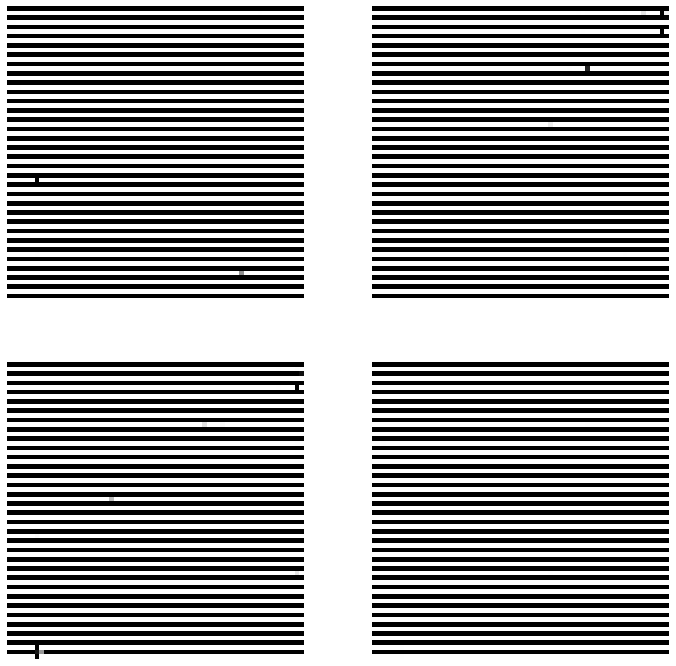

188/188 [==============================] - 156s 817ms/step - d_loss: -0.6767 - g_loss: -2.6574
Epoch 2/10
188/188 [==============================] - ETA: 0s - d_loss: nan - g_loss: nan

/home/students/arazz002/.local/lib/python3.8/site-packages/keras/src/utils/image_utils.py:277: RuntimeWarning: invalid value encountered in cast
  return pil_image.fromarray(x[:, :, 0].astype("uint8"), "L")


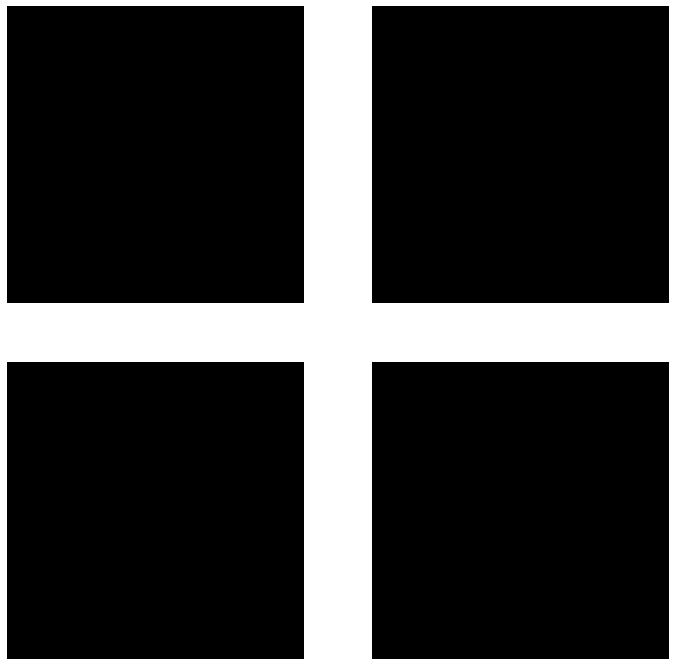

188/188 [==============================] - 152s 809ms/step - d_loss: nan - g_loss: nan
Epoch 3/10
 75/188 [==========>...................] - ETA: 1:31 - d_loss: nan - g_loss: nan

KeyboardInterrupt: 

In [13]:
gan.fit(
    dataset, epochs=epochs, callbacks=[
        GANMonitor(num_img=4, latent_dim=latent_dim, show_every=1, save=True),
    ],
)

The model above stopped manually because the discriminator and generator loss become nan which is a sign of gradient explosion. I was not sure if it was for the batch normalization added to the model (I tried other GANs without batch normalization in other notebooks that worked fine) or defining a misleading label. I first remove the batch normalization in the upcoming model to check if it will resolve the problem.
## Second Attempt

In [22]:
del generator, gan, discriminator

In [23]:
def build_discriminator():
    return tf.keras.Sequential(
        [
            tf.keras.Input(shape=(64, 64, 1)),
            AddNoise(stddev=0.2, mean=0.2),  # Add  noise to the output of the first layer
            tf.keras.layers.Conv2D(64, kernel_size=3, strides=2, padding="same"),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.LeakyReLU(alpha=0.2),
            tf.keras.layers.Conv2D(128, kernel_size=3, strides=2, padding="same"),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.LeakyReLU(alpha=0.2),
            tf.keras.layers.Conv2D(128, kernel_size=3, strides=2, padding="same"),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.LeakyReLU(alpha=0.2),
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(1, activation="sigmoid"),
        ],
        name="discriminator",
    )
discriminator = build_discriminator()

In [24]:
def build_generator(latent_dim = 128):
    return tf.keras.Sequential(
        [
            tf.keras.Input(shape=(latent_dim,)),
            tf.keras.layers.Dense(8 * 8 * 128),
            tf.keras.layers.Reshape((8, 8, 128)),
            tf.keras.layers.Conv2DTranspose(128, kernel_size=3, strides=2, padding="same"),
            AddNoise(stddev=0.1, mean=0.0),  # Add Gaussian noise 
            tf.keras.layers.LeakyReLU(alpha=0.2),
            AddNoise(stddev=0.1, mean=0.0),  # Add Gaussian noise 
            tf.keras.layers.Conv2DTranspose(256, kernel_size=3, strides=2, padding="same"),
            AddNoise(stddev=0.1, mean=0.0),  # Add Gaussian noise 
            tf.keras.layers.LeakyReLU(alpha=0.2),
            AddNoise(stddev=0.1, mean=0.0),  # Add Gaussian noise 
            tf.keras.layers.Conv2DTranspose(512, kernel_size=3, strides=2, padding="same"),
            AddNoise(stddev=0.1, mean=0.0),  # Add Gaussian noise 
            tf.keras.layers.LeakyReLU(alpha=0.2),
            AddNoise(stddev=0.1, mean=0.0),  # Add Gaussian noise 
            tf.keras.layers.Conv2D(1, kernel_size=5, padding="same", activation="tanh"),
        ],
        name="generator",
    )

generator = build_generator()

In [25]:
class GAN(tf.keras.Model):                                                  # subclassing `tf.keras.Model`
    def __init__(self, discriminator, generator, latent_dim):
        super().__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        self.d_loss_metric = tf.keras.metrics.Mean(name="d_loss")           # custom metrics
        self.g_loss_metric = tf.keras.metrics.Mean(name="g_loss")

    def compile(self, d_optimizer, g_optimizer, loss_fn):                   # `compile` required for `tf.keras.Model`
        super(GAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):                                       # `train_step` required for `tf.keras.Model`
        batch_size = tf.shape(real_images)[0]

        # DISCRIMINATOR 
        for _ in range(2):
            random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
            generated_images = self.generator(random_latent_vectors)

        # Resize generated images to match the size of real images
            generated_images_resized = tf.image.resize(generated_images, (64, 64), method='nearest')

            combined_images = tf.concat([generated_images_resized, real_images], axis=0)
            labels = tf.concat([-tf.ones((batch_size, 1)), tf.ones((batch_size, 1))], axis=0)
            labels += 0.05 * tf.random.uniform(tf.shape(labels))

            with tf.GradientTape() as tape:
                predictions = self.discriminator(combined_images)
                d_loss = self.loss_fn(labels, predictions)
            grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
            self.d_optimizer.apply_gradients(zip(grads, self.discriminator.trainable_weights))
            self.d_loss_metric.update_state(d_loss)

        # GENERATOR 

        random_latent_vectors = tf.random.normal(
            shape=(batch_size, self.latent_dim)
        )
        # Normalize the latent points to lie on the surface of a sphere
        normalized_latent_points = tf.math.l2_normalize(random_latent_vectors, axis=1)
        
        misleading_labels = -tf.ones((batch_size, 1)) # -1: real

        with tf.GradientTape() as tape:                                 # gradient logic:
            predictions = self.discriminator(                           # get predictions from Discriminator
                self.generator(normalized_latent_points)                   # from generated fake images
            )
            g_loss = self.loss_fn(misleading_labels, predictions)       # loss labels vs preds
        grads = tape.gradient(g_loss, self.generator.trainable_weights) # gradients to update
        self.g_optimizer.apply_gradients(                               # our Generator
            zip(grads, self.generator.trainable_weights)
        )
        self.g_loss_metric.update_state(g_loss) # update loss

        return {
            "d_loss": self.d_loss_metric.result(),
            "g_loss": self.g_loss_metric.result()
        }

In [26]:
class GANMonitor(tf.keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=128, show_every=1, save=True):
        self.num_img = num_img
        self.latent_dim = latent_dim
        self.save = save
        self.show_every = show_every

    def on_epoch_end(self, epoch, logs=None):

        random_latent_vectors = tf.random.normal(shape=(self.num_img, self.latent_dim))
        generated_images = self.model.generator(random_latent_vectors)
        generated_images = (generated_images + 1) * 127.5  # Adjust scaling for image format
        generated_images.numpy()

        if self.save:
            for i in range(self.num_img):
                img = tf.keras.utils.array_to_img(generated_images[i])
                img.save(f'generated-grayscale-new-final-2/generated_img_{epoch:03d}_{i}.png')

        if epoch % self.show_every != 0:
            return
        
        _, axs = plt.subplots(2,2, figsize=(12,12)) # https://stackoverflow.com/a/54681765
        axs = axs.flatten()
        for i, (img, ax) in enumerate(zip(generated_images, axs)):
            img = tf.keras.utils.array_to_img(img)
            ax.axis('off')
            ax.imshow(img, cmap='gray')
        plt.show()
        


In [27]:
epochs = 10
latent_dim = 128

gan = GAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)

gan.compile(
    d_optimizer=tf.keras.optimizers.SGD(learning_rate=0.0002), 
    g_optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002),
    loss_fn=tf.keras.losses.BinaryCrossentropy(),
)

In [29]:
reload = False # True to reload
generator_path = "generator_fingerptint_gan_final_2.h5"
discriminator_path = "discriminator_fingerptint_final_2.h5"
if os.path.isfile(discriminator_path) and os.path.isfile(generator_path) and reload:
    gan.generator.load_weights(generator_path)
    gan.discriminator.load_weights(discriminator_path)

Epoch 1/10
188/188 [==============================] - ETA: 0s - d_loss: -0.1621 - g_loss: -1.4494

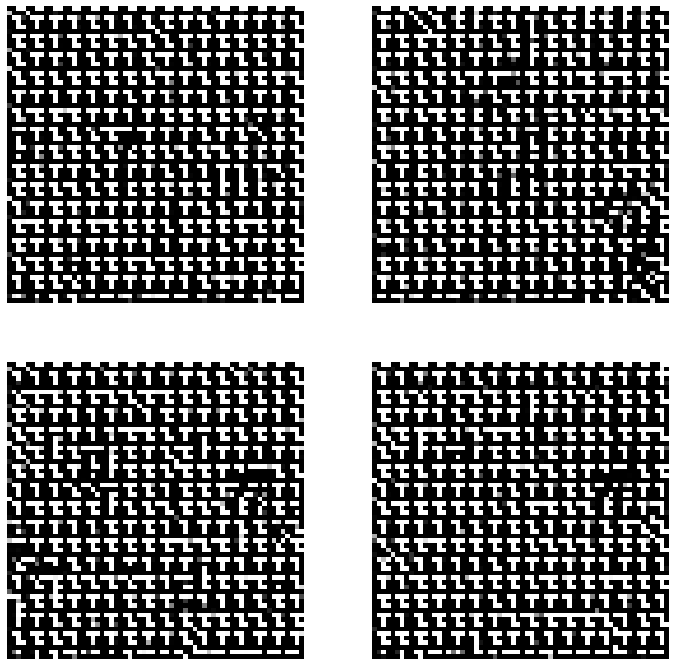

188/188 [==============================] - 156s 816ms/step - d_loss: -0.1621 - g_loss: -1.4494
Epoch 2/10
188/188 [==============================] - ETA: 0s - d_loss: nan - g_loss: nan

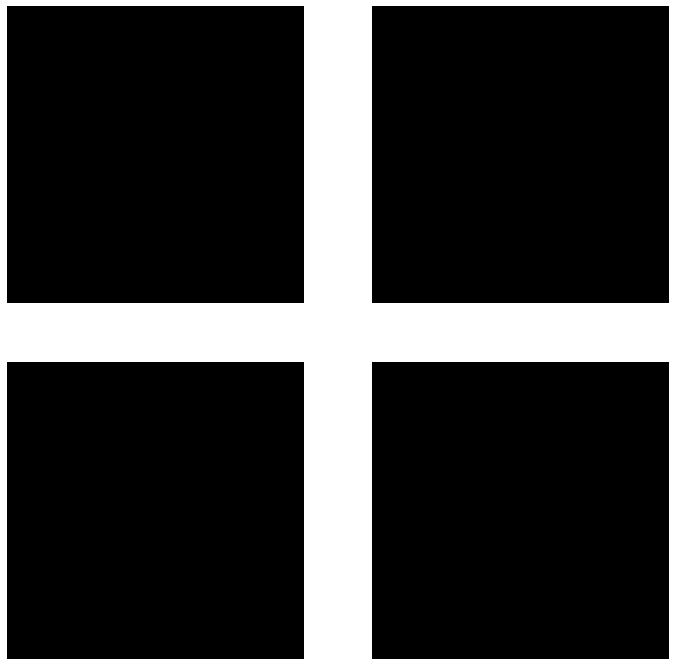

188/188 [==============================] - 153s 812ms/step - d_loss: nan - g_loss: nan
Epoch 3/10
  8/188 [>.............................] - ETA: 2:25 - d_loss: nan - g_loss: nan

KeyboardInterrupt: 

In [30]:
gan.fit(
    dataset, epochs=epochs, callbacks=[
        GANMonitor(num_img=4, latent_dim=latent_dim, show_every=1, save=True),
    ],
)

Based on the upper models, I found out that defining a misleading label in generator training is causing gradient explosion. Therefore, I will redefine a model with batch normalization, noises and other properties mentioned before again, but keep the label as it is for training the generator phase. What I mean by the misleading label is that for the discriminator real images are defined as 1 and fake images as -1, while for the generator real images are defined as 1. In the next attempt, I am going to keep the fake and real image definitions the same for the generator and discriminator. 
## GAN Model

In [28]:
del generator, gan, discriminator
tf.keras.backend.clear_session()

In [29]:
def build_discriminator():
    return tf.keras.Sequential(
        [
            tf.keras.Input(shape=(64, 64, 1)),
            AddNoise(stddev=0.2, mean=0.2),  # Add noise to the output of the first layer
            tf.keras.layers.Conv2D(64, kernel_size=3, strides=2, padding="same"),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.LeakyReLU(alpha=0.2),
            tf.keras.layers.Dropout(0.1),
            tf.keras.layers.Conv2D(128, kernel_size=3, strides=2, padding="same"),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.LeakyReLU(alpha=0.2),
            tf.keras.layers.Dropout(0.1),
            tf.keras.layers.Conv2D(128, kernel_size=3, strides=2, padding="same"),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.LeakyReLU(alpha=0.2),
            tf.keras.layers.Dropout(0.1),
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(1, activation="sigmoid"),
        ],
        name="discriminator",
    )
discriminator = build_discriminator()

In [30]:
def build_generator(latent_dim = 128):
    return tf.keras.Sequential(
        [
            tf.keras.Input(shape=(latent_dim,)),
            tf.keras.layers.Dense(8 * 8 * 128),
            tf.keras.layers.Reshape((8, 8, 128)),
            tf.keras.layers.Conv2DTranspose(128, kernel_size=3, strides=2, padding="same"),
            AddNoise(stddev=0.1, mean=0.0),  # Add Gaussian noise 
            tf.keras.layers.LeakyReLU(alpha=0.2),
            AddNoise(stddev=0.1, mean=0.0),  # Add Gaussian noise 
            tf.keras.layers.Conv2DTranspose(256, kernel_size=3, strides=2, padding="same"),
            AddNoise(stddev=0.1, mean=0.0),  # Add Gaussian noise 
            tf.keras.layers.LeakyReLU(alpha=0.2),
            AddNoise(stddev=0.1, mean=0.0),  # Add Gaussian noise 
            tf.keras.layers.Conv2DTranspose(512, kernel_size=3, strides=2, padding="same"),
            AddNoise(stddev=0.1, mean=0.0),  # Add Gaussian noise 
            tf.keras.layers.LeakyReLU(alpha=0.2),
            AddNoise(stddev=0.1, mean=0.0),  # Add Gaussian noise 
            tf.keras.layers.Conv2D(1, kernel_size=5, padding="same", activation="tanh"),
        ],
        name="generator",
    )

generator = build_generator()

In [40]:
class GAN(tf.keras.Model):                                                  # subclassing `tf.keras.Model`
    def __init__(self, discriminator, generator, latent_dim):
        super().__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        self.d_loss_metric = tf.keras.metrics.Mean(name="d_loss")           # custom metrics
        self.g_loss_metric = tf.keras.metrics.Mean(name="g_loss")

    def compile(self, d_optimizer, g_optimizer, loss_fn):                   # `compile` required for `tf.keras.Model`
        super(GAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):                                       # `train_step` required for `tf.keras.Model`
        batch_size = tf.shape(real_images)[0]

        # DISCRIMINATOR
        for _ in range(2):
            random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
            generated_images = self.generator(random_latent_vectors)

        # Resize generated images to match the size of real images
            generated_images_resized = tf.image.resize(generated_images, (64, 64), method='nearest')

            combined_images = tf.concat([generated_images_resized, real_images], axis=0)
            labels = tf.concat([-tf.ones((batch_size, 1)), tf.ones((batch_size, 1))], axis=0)
            labels += 0.05 * tf.random.uniform(tf.shape(labels))

            with tf.GradientTape() as tape:
                predictions = self.discriminator(combined_images)
                d_loss = self.loss_fn(labels, predictions)
            grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
            self.d_optimizer.apply_gradients(zip(grads, self.discriminator.trainable_weights))
            self.d_loss_metric.update_state(d_loss)

        # GENERATOR 

        random_latent_vectors = tf.random.normal(
            shape=(batch_size, self.latent_dim)
        )
        # Normalize the latent points to lie on the surface of a sphere
        normalized_latent_points = tf.math.l2_normalize(random_latent_vectors, axis=1)
        
        misleading_labels = tf.ones((batch_size, 1)) # 1: real

        with tf.GradientTape() as tape:                                 # gradient logic:
            predictions = self.discriminator(                           # get predictions from Discriminator
                self.generator(normalized_latent_points)                   # from generated fake images
            )
            g_loss = self.loss_fn(misleading_labels, predictions)       # loss labels vs preds
        grads = tape.gradient(g_loss, self.generator.trainable_weights) # gradients to update
        self.g_optimizer.apply_gradients(                               # our Generator
            zip(grads, self.generator.trainable_weights)
        )
        self.g_loss_metric.update_state(g_loss) # update loss

        return {
            "d_loss": self.d_loss_metric.result(),
            "g_loss": self.g_loss_metric.result()
        }

In notebook "z" labels are flipped for the discriminator and smoothing is defined 0.3 from each side. Therefore real images are between 0 and 0.3 and fake between 0.7 and 1.

In [32]:
class GANMonitor(tf.keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=128, show_every=1, save=True):
        self.num_img = num_img
        self.latent_dim = latent_dim
        self.save = save
        self.show_every = show_every

    def on_epoch_end(self, epoch, logs=None):

        random_latent_vectors = tf.random.normal(shape=(self.num_img, self.latent_dim))
        generated_images = self.model.generator(random_latent_vectors)
        generated_images = (generated_images + 1) * 127.5  # Adjust scaling for image format
        generated_images.numpy()

        if self.save:
            for i in range(self.num_img):
                img = tf.keras.utils.array_to_img(generated_images[i])
                img.save(f'generated-grayscale-new-final-3/generated_img_{epoch:03d}_{i}.png')

        if epoch % self.show_every != 0:
            return
        
        _, axs = plt.subplots(2,2, figsize=(12,12)) # https://stackoverflow.com/a/54681765
        axs = axs.flatten()
        for i, (img, ax) in enumerate(zip(generated_images, axs)):
            img = tf.keras.utils.array_to_img(img)
            ax.axis('off')
            ax.imshow(img, cmap='gray')
        plt.show()
        


In [10]:
epochs = 10
latent_dim = 128

gan = GAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)

gan.compile(
    d_optimizer=tf.keras.optimizers.SGD(learning_rate=0.0002), 
    g_optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002),
    loss_fn=tf.keras.losses.BinaryCrossentropy(),
)

In [11]:
reload = False # True to reload
generator_path = "generator_fingerptint_gan_final_3.h5"
discriminator_path = "discriminator_fingerptint_final_3.h5"
if os.path.isfile(discriminator_path) and os.path.isfile(generator_path) and reload:
    gan.generator.load_weights(generator_path)
    gan.discriminator.load_weights(discriminator_path)

Epoch 1/10
188/188 [==============================] - ETA: 0s - d_loss: 0.7688 - g_loss: 0.4985

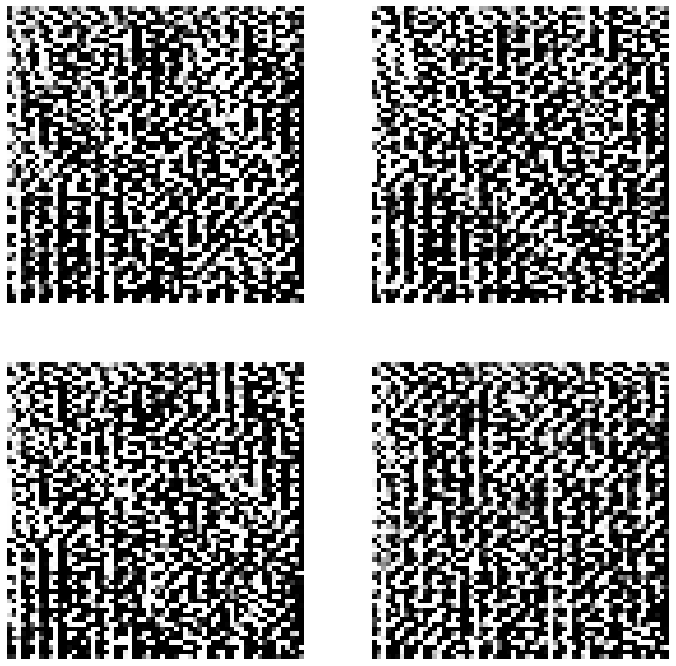

188/188 [==============================] - 156s 814ms/step - d_loss: 0.7688 - g_loss: 0.4985
Epoch 2/10
188/188 [==============================] - ETA: 0s - d_loss: 0.4672 - g_loss: 0.5683

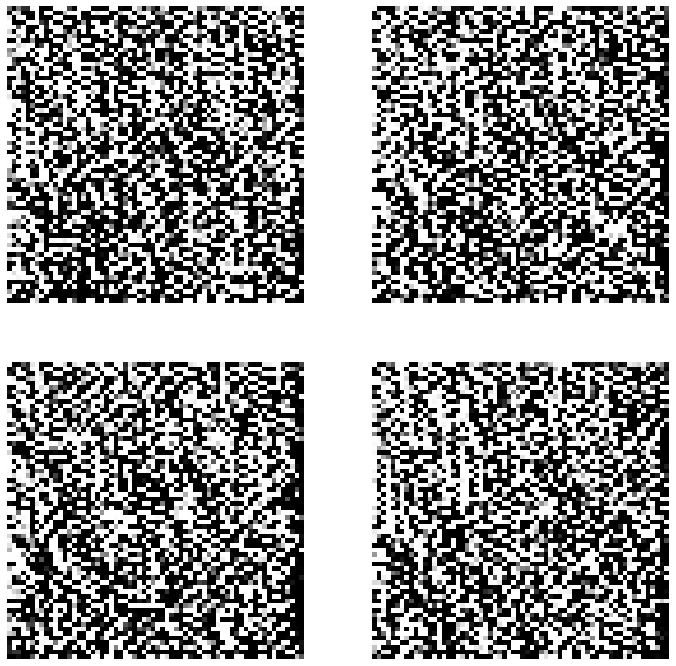

188/188 [==============================] - 152s 809ms/step - d_loss: 0.4672 - g_loss: 0.5683
Epoch 3/10
188/188 [==============================] - ETA: 0s - d_loss: 0.1976 - g_loss: 1.1788

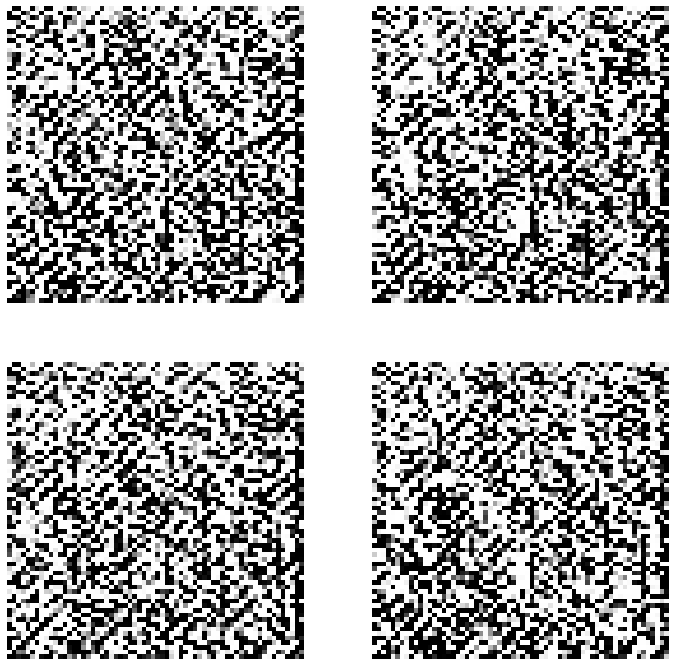

188/188 [==============================] - 152s 808ms/step - d_loss: 0.1976 - g_loss: 1.1788
Epoch 4/10
188/188 [==============================] - ETA: 0s - d_loss: -0.1811 - g_loss: 2.3311

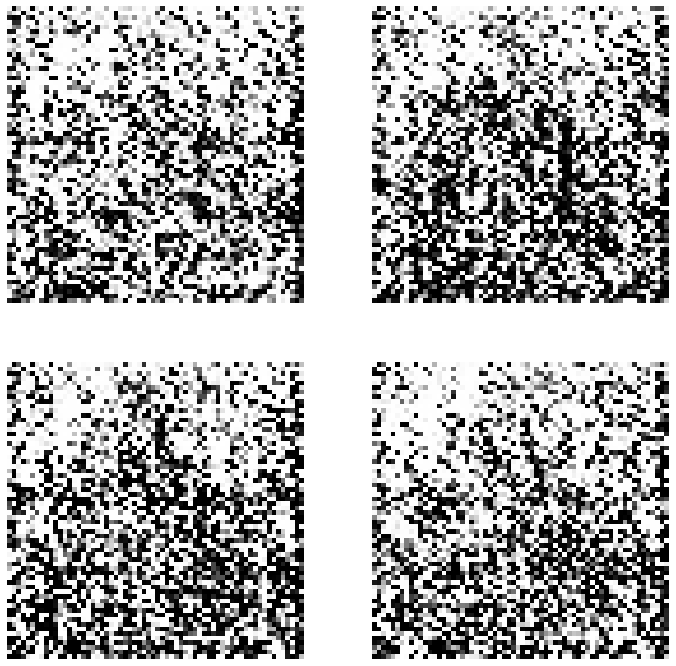

188/188 [==============================] - 153s 812ms/step - d_loss: -0.1811 - g_loss: 2.3311
Epoch 5/10
188/188 [==============================] - ETA: 0s - d_loss: 0.1291 - g_loss: 2.3801

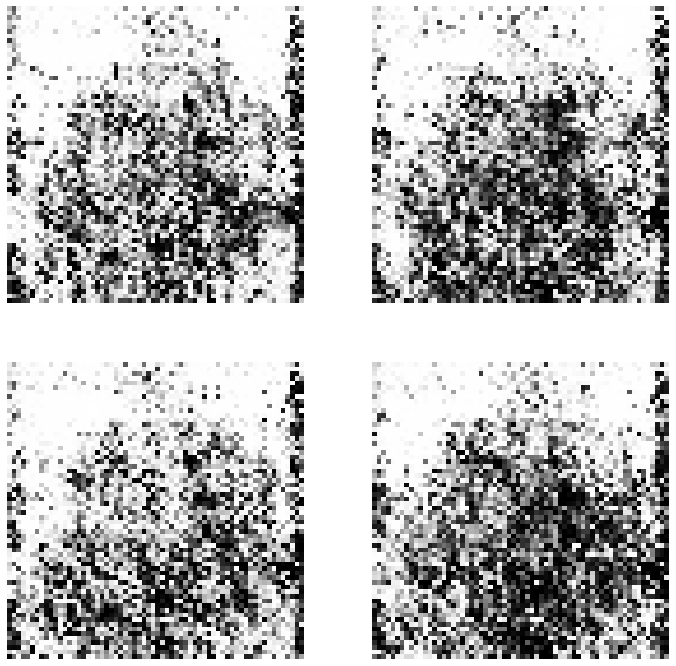

188/188 [==============================] - 153s 814ms/step - d_loss: 0.1291 - g_loss: 2.3801
Epoch 6/10
188/188 [==============================] - ETA: 0s - d_loss: 0.4066 - g_loss: 2.2134

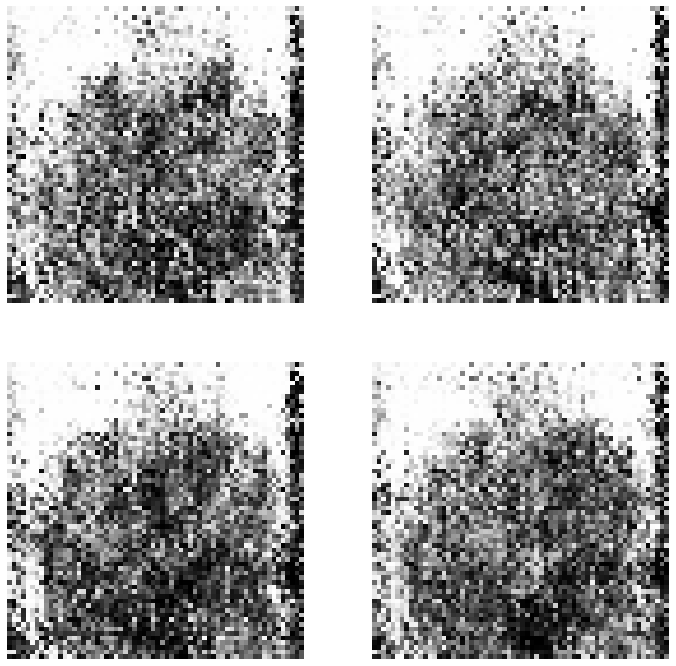

188/188 [==============================] - 152s 807ms/step - d_loss: 0.4066 - g_loss: 2.2134
Epoch 7/10
188/188 [==============================] - ETA: 0s - d_loss: 0.4548 - g_loss: 2.2475

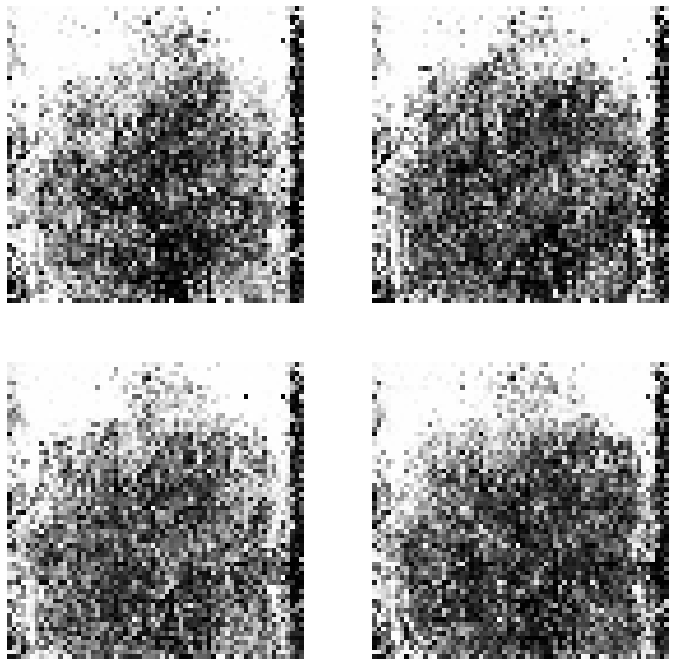

188/188 [==============================] - 152s 809ms/step - d_loss: 0.4548 - g_loss: 2.2475
Epoch 8/10
188/188 [==============================] - ETA: 0s - d_loss: 0.4342 - g_loss: 2.3505

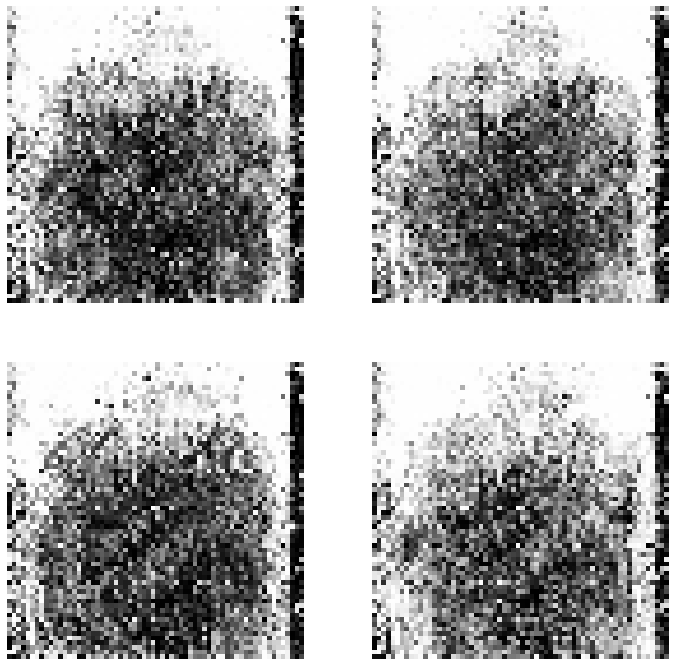

188/188 [==============================] - 152s 809ms/step - d_loss: 0.4342 - g_loss: 2.3505
Epoch 9/10
188/188 [==============================] - ETA: 0s - d_loss: 0.4043 - g_loss: 2.5044

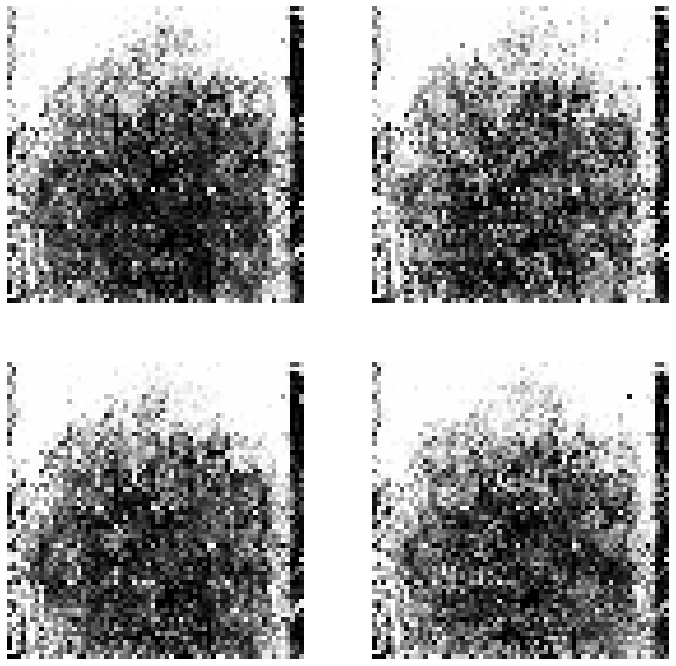

188/188 [==============================] - 152s 810ms/step - d_loss: 0.4043 - g_loss: 2.5044
Epoch 10/10
188/188 [==============================] - ETA: 0s - d_loss: 0.3701 - g_loss: 2.6241

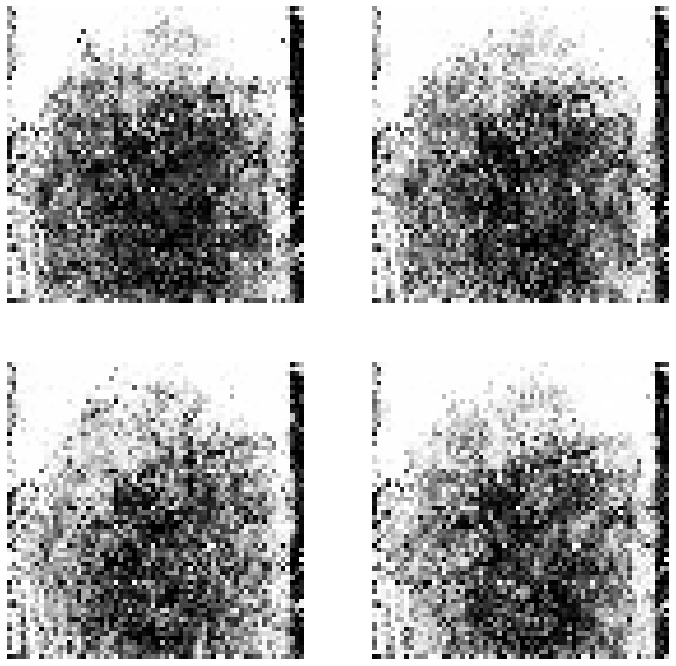

188/188 [==============================] - 152s 810ms/step - d_loss: 0.3701 - g_loss: 2.6241


In [12]:
gan.fit(
    dataset, epochs=epochs, callbacks=[
        GANMonitor(num_img=4, latent_dim=latent_dim, show_every=1, save=True),
    ],
)

Epoch 1/30
188/188 [==============================] - ETA: 0s - d_loss: 0.2367 - g_loss: 3.1333

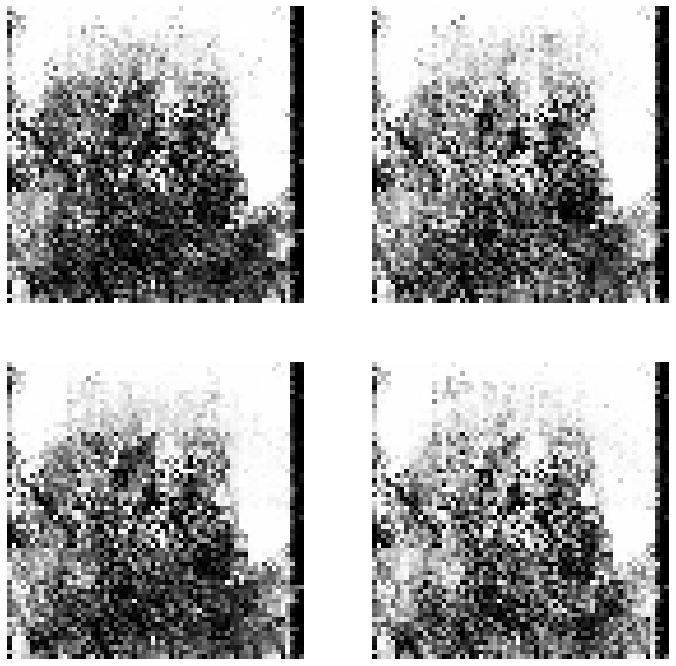

188/188 [==============================] - 152s 810ms/step - d_loss: 0.2367 - g_loss: 3.1333
Epoch 2/30
188/188 [==============================] - ETA: 0s - d_loss: 0.2261 - g_loss: 3.1877

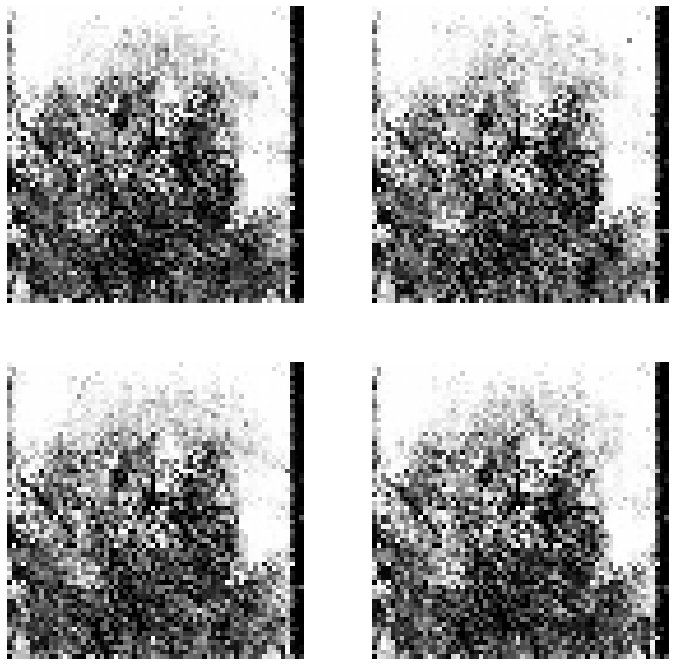

188/188 [==============================] - 152s 806ms/step - d_loss: 0.2261 - g_loss: 3.1877
Epoch 3/30
188/188 [==============================] - ETA: 0s - d_loss: 0.2183 - g_loss: 3.1974

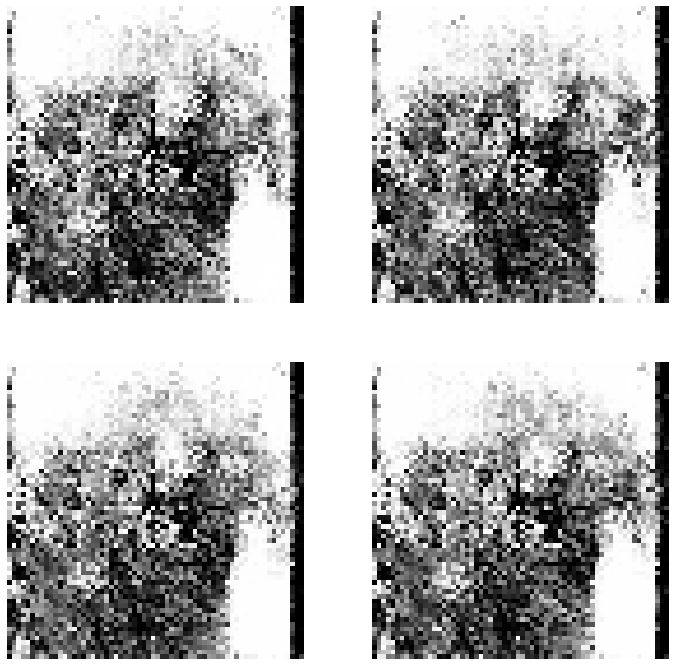

188/188 [==============================] - 151s 805ms/step - d_loss: 0.2183 - g_loss: 3.1974
Epoch 4/30
188/188 [==============================] - ETA: 0s - d_loss: 0.2533 - g_loss: 3.1691

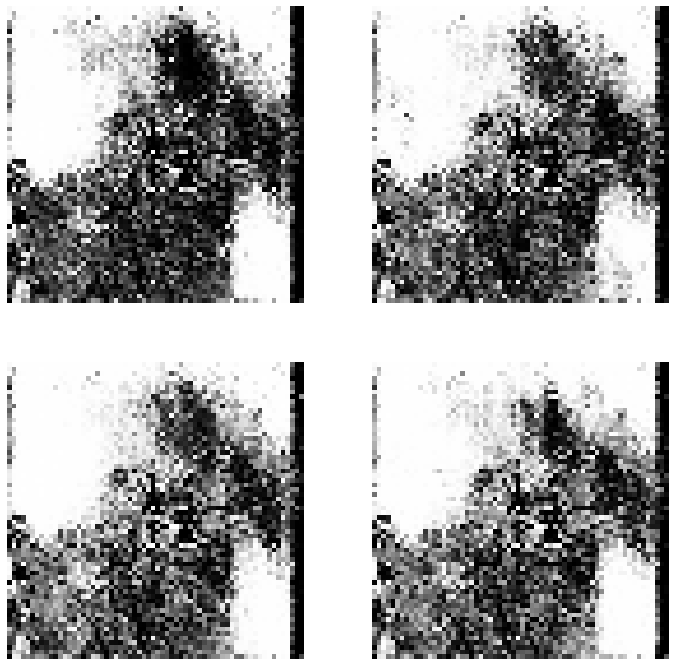

188/188 [==============================] - 152s 808ms/step - d_loss: 0.2533 - g_loss: 3.1691
Epoch 5/30
188/188 [==============================] - ETA: 0s - d_loss: 0.2433 - g_loss: 3.2004

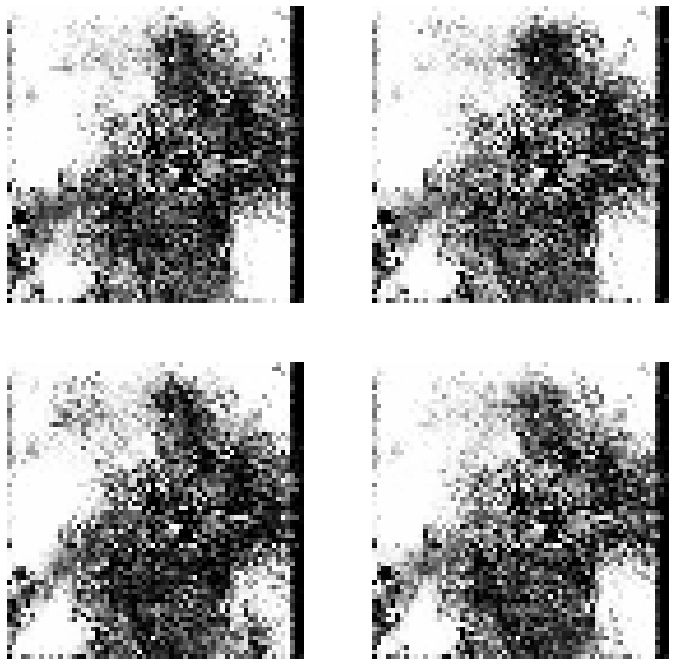

188/188 [==============================] - 152s 809ms/step - d_loss: 0.2433 - g_loss: 3.2004
Epoch 6/30
188/188 [==============================] - ETA: 0s - d_loss: 0.2409 - g_loss: 3.2051

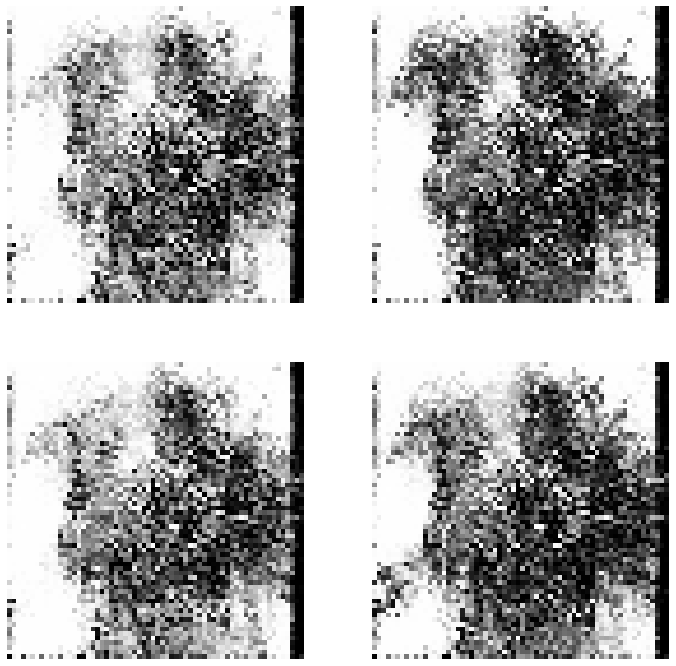

188/188 [==============================] - 153s 812ms/step - d_loss: 0.2409 - g_loss: 3.2051
Epoch 7/30
188/188 [==============================] - ETA: 0s - d_loss: 0.2259 - g_loss: 3.2043

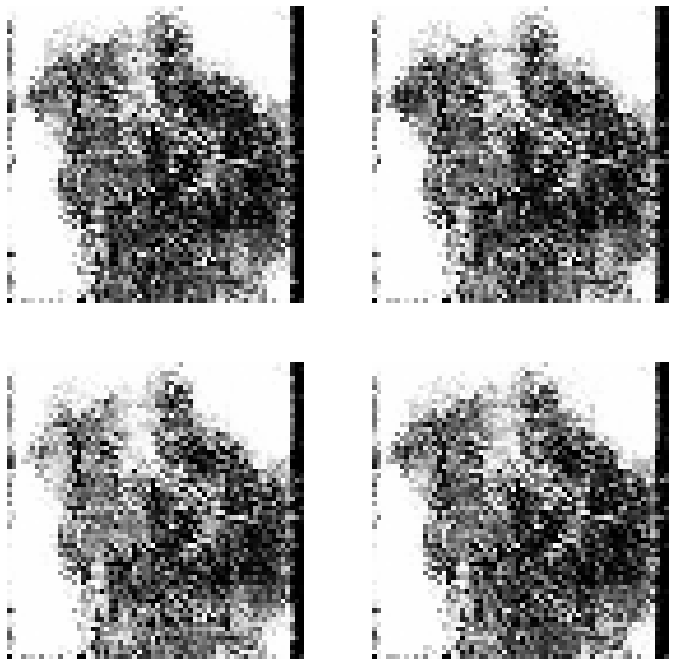

188/188 [==============================] - 152s 810ms/step - d_loss: 0.2259 - g_loss: 3.2043
Epoch 8/30
188/188 [==============================] - ETA: 0s - d_loss: 0.2214 - g_loss: 3.2617

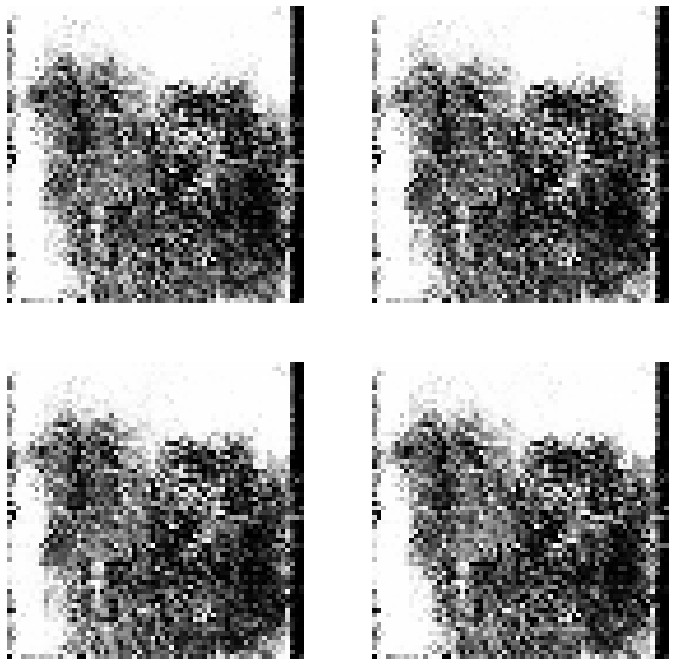

188/188 [==============================] - 152s 806ms/step - d_loss: 0.2214 - g_loss: 3.2617
Epoch 9/30
188/188 [==============================] - ETA: 0s - d_loss: 0.2220 - g_loss: 3.2589

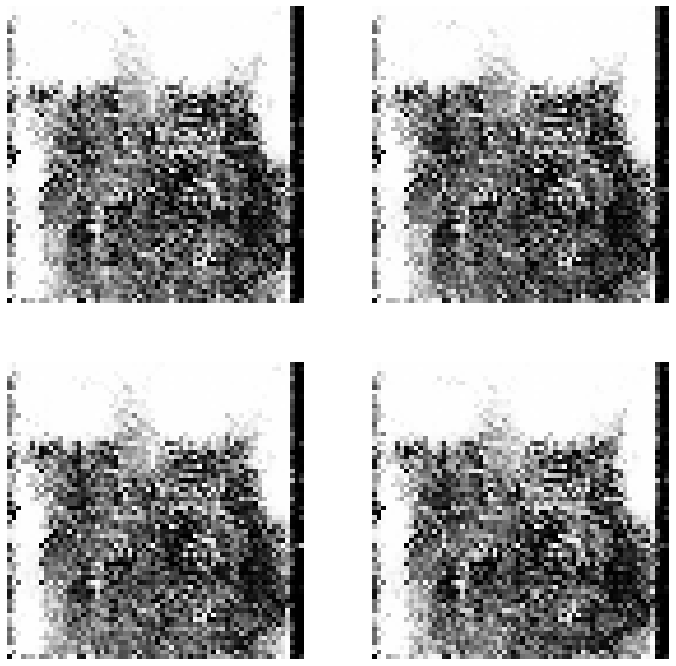

188/188 [==============================] - 151s 805ms/step - d_loss: 0.2220 - g_loss: 3.2589
Epoch 10/30
188/188 [==============================] - ETA: 0s - d_loss: 0.2204 - g_loss: 3.3001

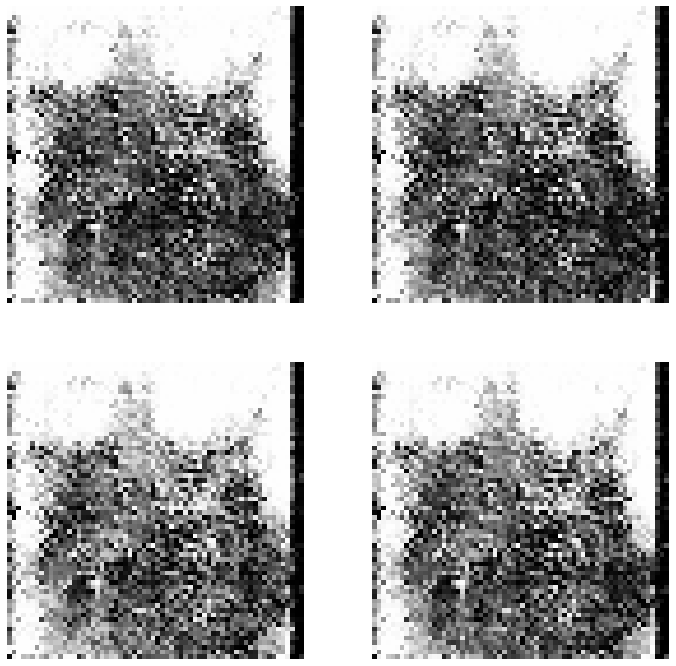

188/188 [==============================] - 151s 804ms/step - d_loss: 0.2204 - g_loss: 3.3001
Epoch 11/30
188/188 [==============================] - ETA: 0s - d_loss: 0.2258 - g_loss: 3.2818

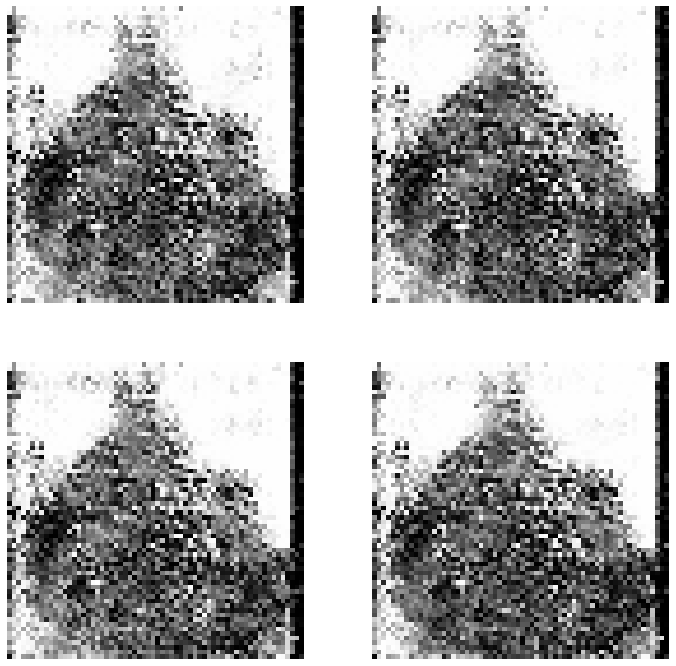

188/188 [==============================] - 152s 807ms/step - d_loss: 0.2258 - g_loss: 3.2818
Epoch 12/30
188/188 [==============================] - ETA: 0s - d_loss: 0.2194 - g_loss: 3.2801

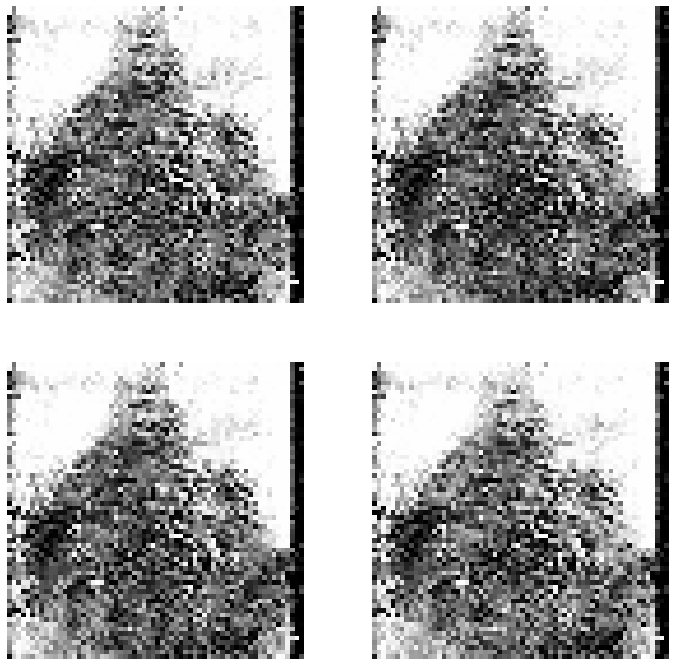

188/188 [==============================] - 153s 811ms/step - d_loss: 0.2194 - g_loss: 3.2801
Epoch 13/30
188/188 [==============================] - ETA: 0s - d_loss: 0.2073 - g_loss: 3.2832

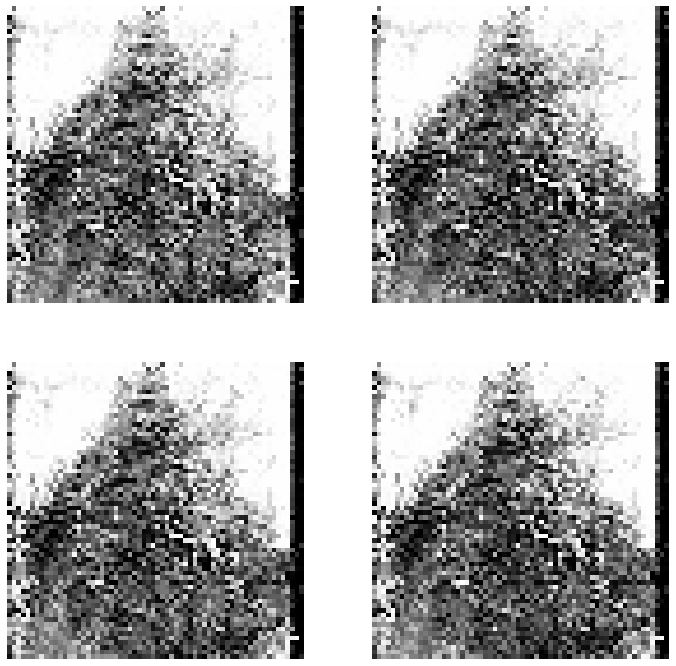

188/188 [==============================] - 155s 822ms/step - d_loss: 0.2073 - g_loss: 3.2832
Epoch 14/30
188/188 [==============================] - ETA: 0s - d_loss: 0.1966 - g_loss: 3.2852

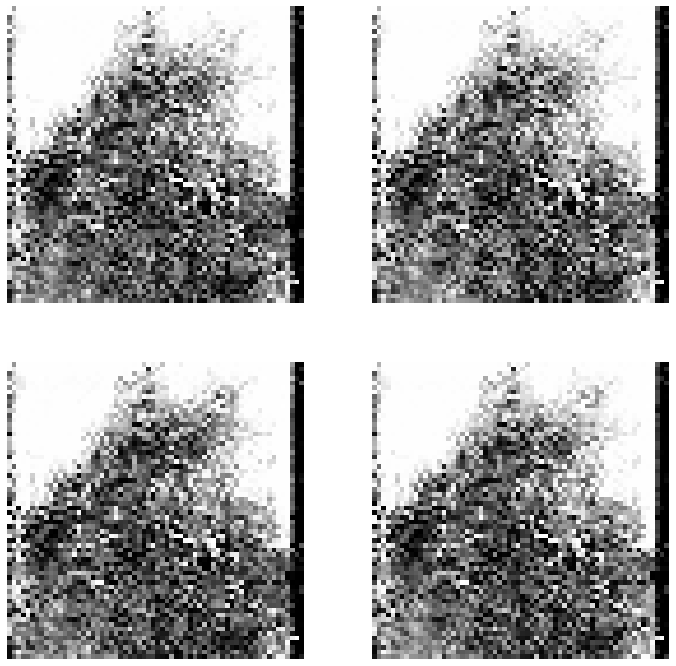

188/188 [==============================] - 154s 816ms/step - d_loss: 0.1966 - g_loss: 3.2852
Epoch 15/30
188/188 [==============================] - ETA: 0s - d_loss: 0.1891 - g_loss: 3.3088

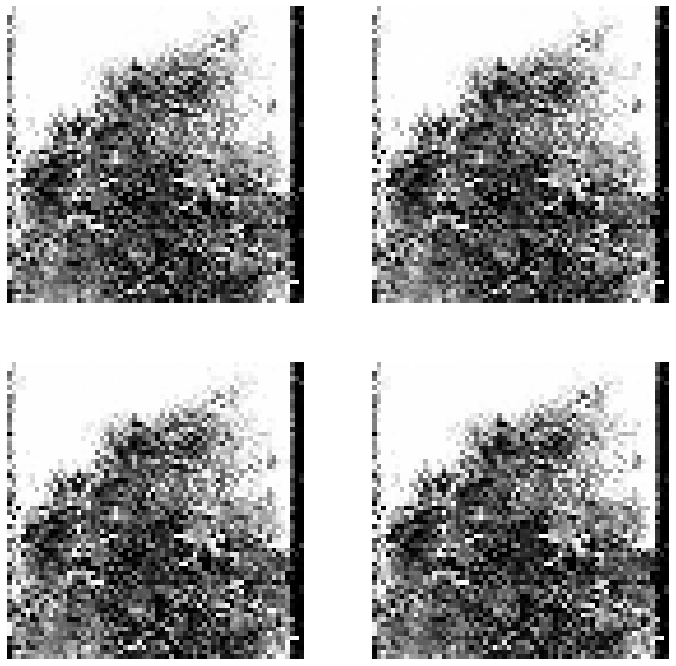

188/188 [==============================] - 154s 816ms/step - d_loss: 0.1891 - g_loss: 3.3088
Epoch 16/30
188/188 [==============================] - ETA: 0s - d_loss: 0.1846 - g_loss: 3.3304

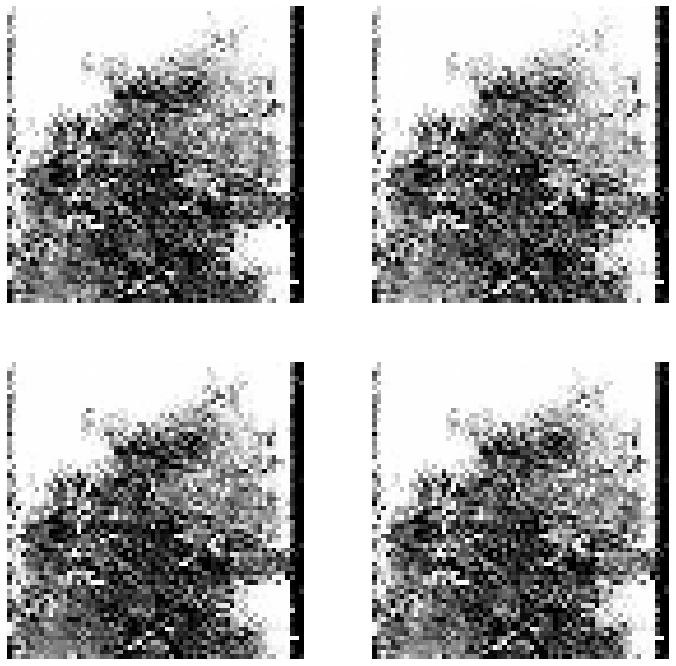

188/188 [==============================] - 153s 812ms/step - d_loss: 0.1846 - g_loss: 3.3304
Epoch 17/30
188/188 [==============================] - ETA: 0s - d_loss: 0.1924 - g_loss: 3.3494

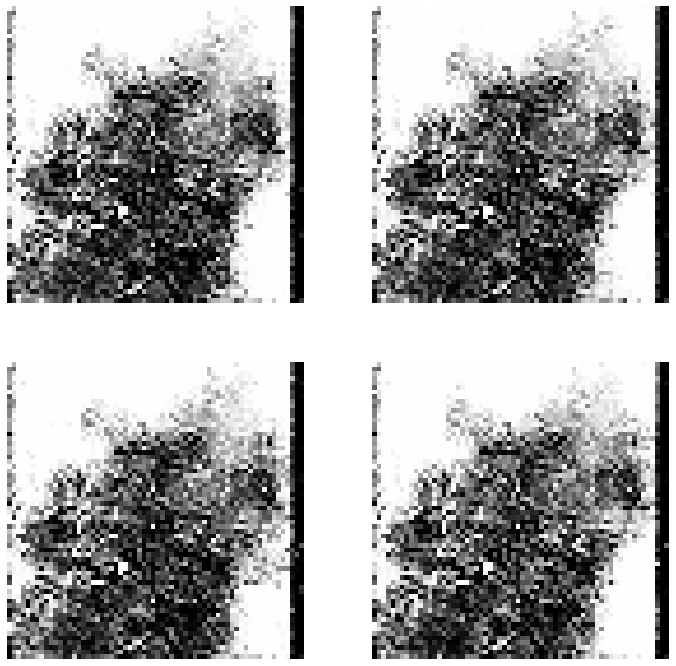

188/188 [==============================] - 153s 811ms/step - d_loss: 0.1924 - g_loss: 3.3494
Epoch 18/30
188/188 [==============================] - ETA: 0s - d_loss: 0.1983 - g_loss: 3.3627

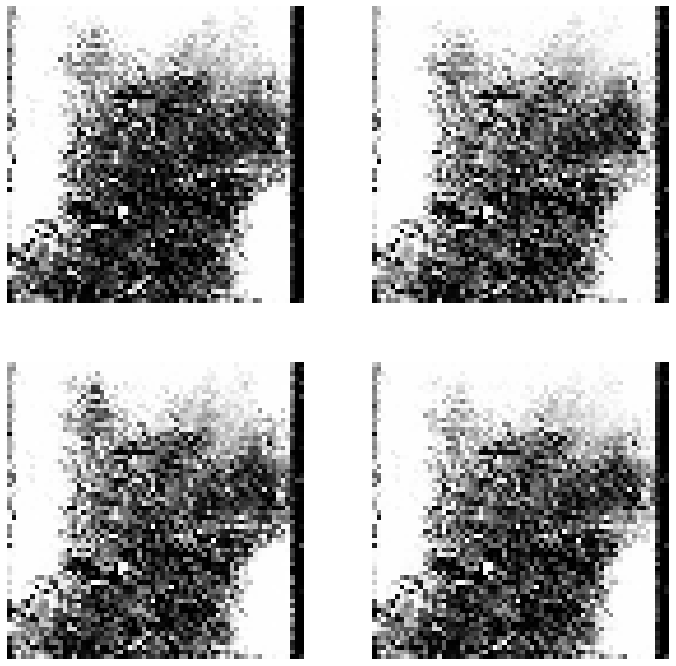

188/188 [==============================] - 152s 810ms/step - d_loss: 0.1983 - g_loss: 3.3627
Epoch 19/30
188/188 [==============================] - ETA: 0s - d_loss: 0.1933 - g_loss: 3.3959

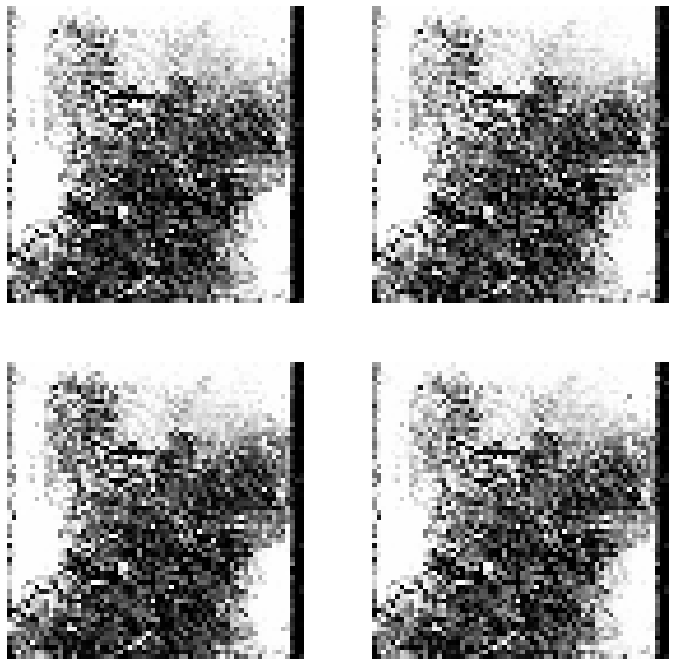

188/188 [==============================] - 151s 802ms/step - d_loss: 0.1933 - g_loss: 3.3959
Epoch 20/30
188/188 [==============================] - ETA: 0s - d_loss: 0.1860 - g_loss: 3.4050

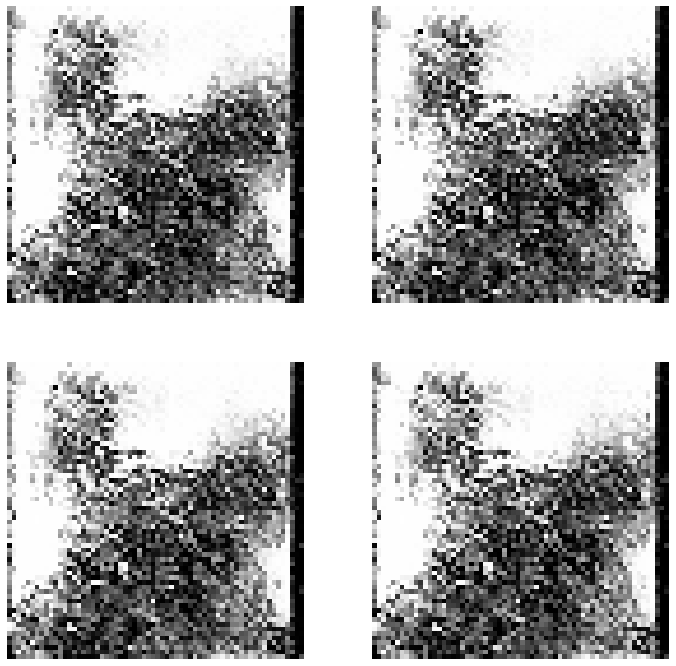

188/188 [==============================] - 152s 806ms/step - d_loss: 0.1860 - g_loss: 3.4050
Epoch 21/30
188/188 [==============================] - ETA: 0s - d_loss: 0.1835 - g_loss: 3.4145

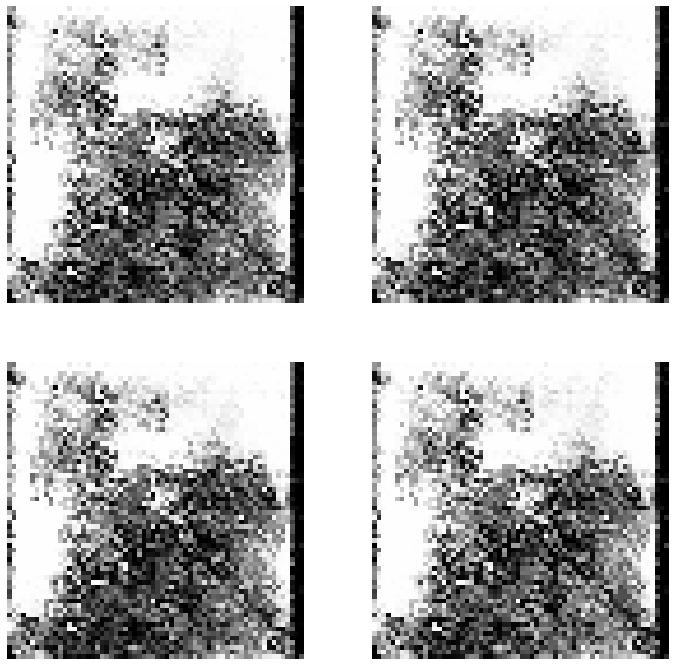

188/188 [==============================] - 151s 805ms/step - d_loss: 0.1835 - g_loss: 3.4145
Epoch 22/30
188/188 [==============================] - ETA: 0s - d_loss: 0.1796 - g_loss: 3.4264

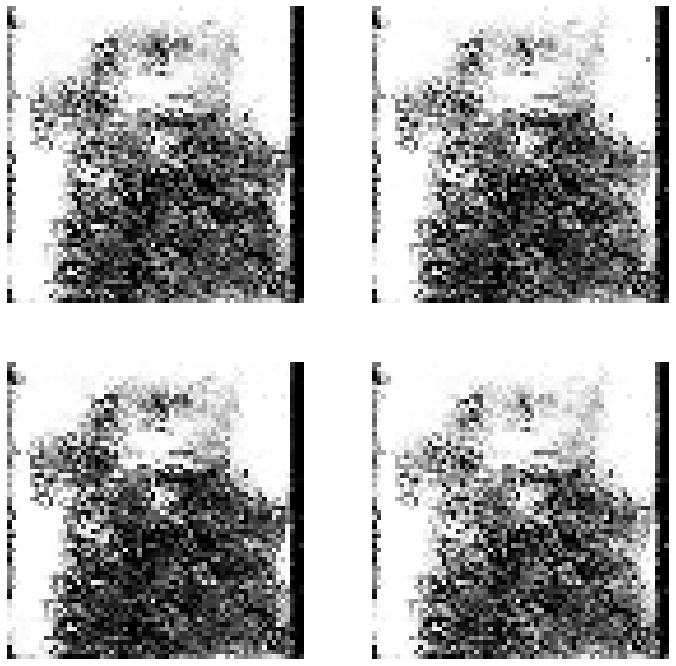

188/188 [==============================] - 152s 807ms/step - d_loss: 0.1796 - g_loss: 3.4264
Epoch 23/30
188/188 [==============================] - ETA: 0s - d_loss: 0.1871 - g_loss: 3.4178

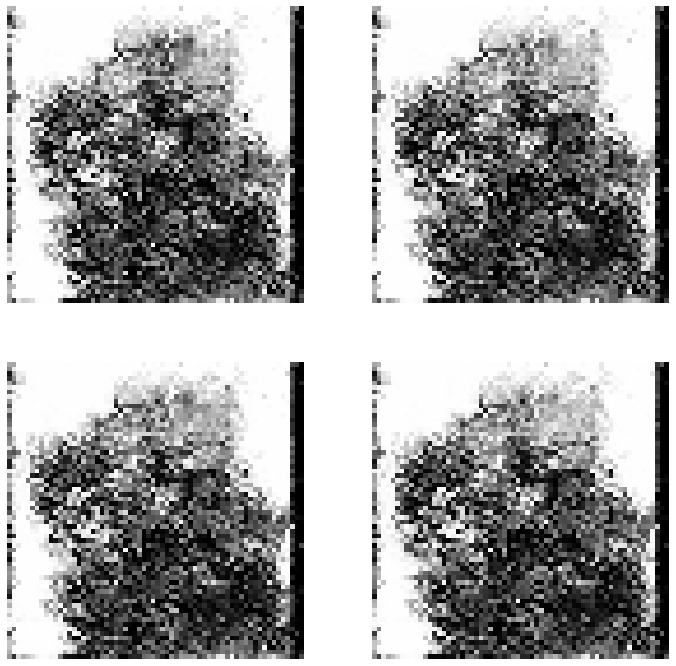

188/188 [==============================] - 152s 808ms/step - d_loss: 0.1871 - g_loss: 3.4178
Epoch 24/30
188/188 [==============================] - ETA: 0s - d_loss: 0.1901 - g_loss: 3.4150

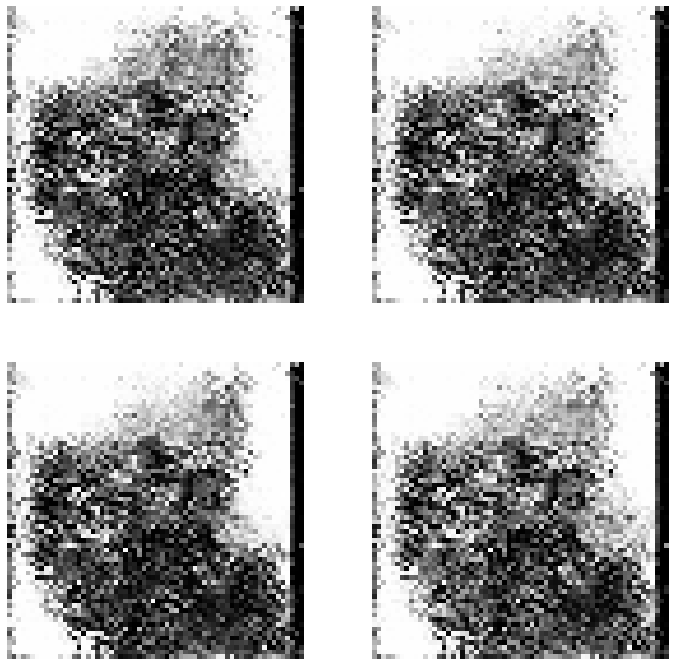

188/188 [==============================] - 152s 807ms/step - d_loss: 0.1901 - g_loss: 3.4150
Epoch 25/30
188/188 [==============================] - ETA: 0s - d_loss: 0.1857 - g_loss: 3.4176

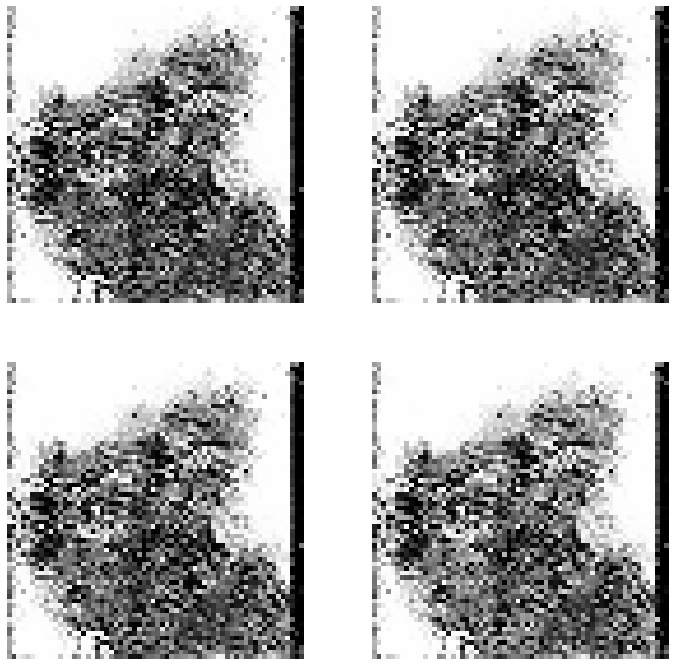

188/188 [==============================] - 153s 813ms/step - d_loss: 0.1857 - g_loss: 3.4176
Epoch 26/30
188/188 [==============================] - ETA: 0s - d_loss: 0.1718 - g_loss: 3.4383

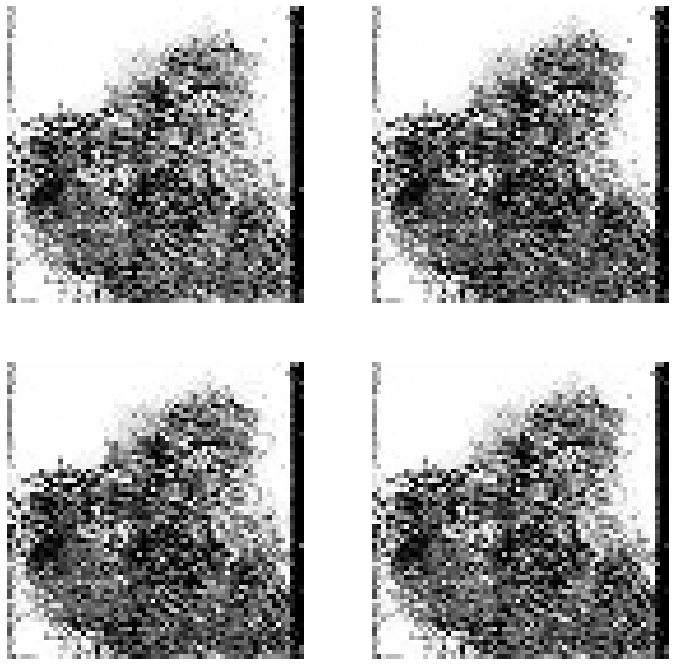

188/188 [==============================] - 153s 816ms/step - d_loss: 0.1718 - g_loss: 3.4383
Epoch 27/30
188/188 [==============================] - ETA: 0s - d_loss: 0.1719 - g_loss: 3.4331

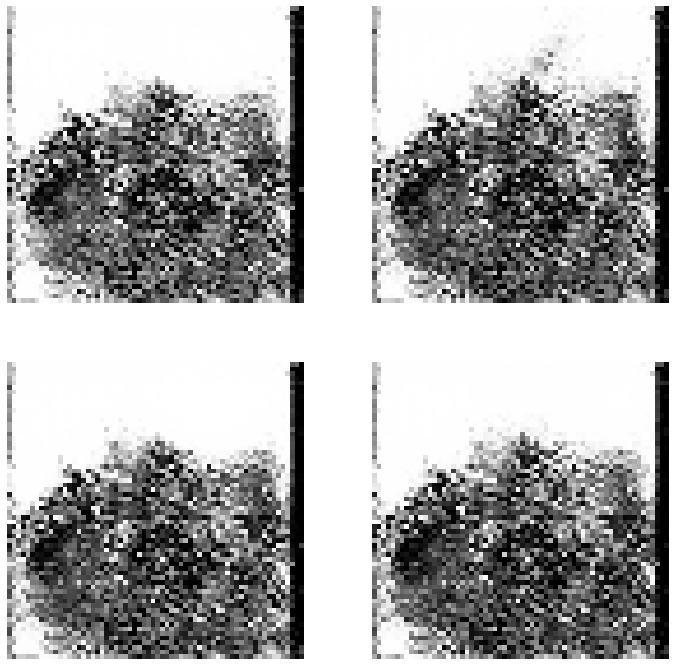

188/188 [==============================] - 153s 811ms/step - d_loss: 0.1719 - g_loss: 3.4331
Epoch 28/30
188/188 [==============================] - ETA: 0s - d_loss: 0.1802 - g_loss: 3.4546

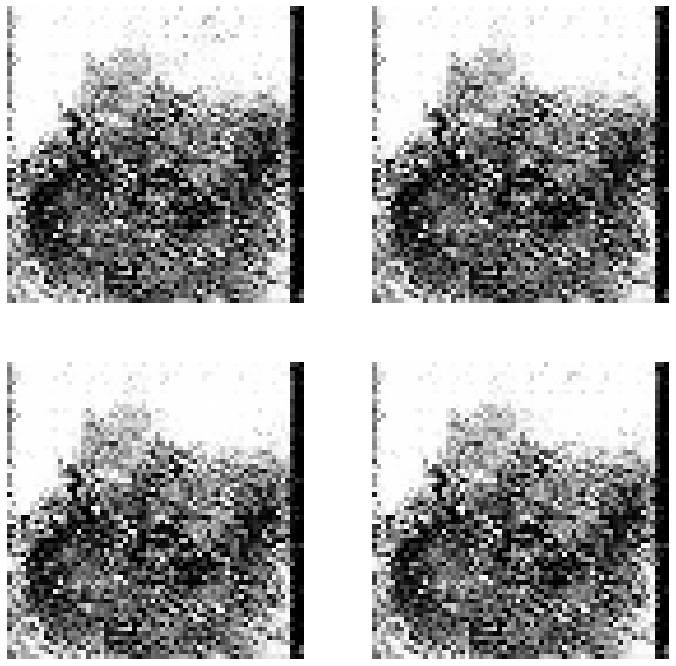

188/188 [==============================] - 152s 809ms/step - d_loss: 0.1802 - g_loss: 3.4546
Epoch 29/30
188/188 [==============================] - ETA: 0s - d_loss: 0.1829 - g_loss: 3.4317

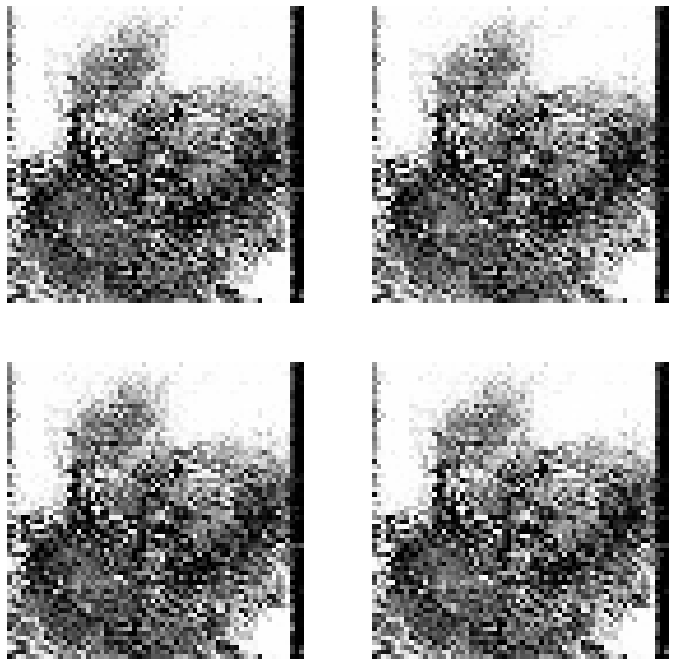

188/188 [==============================] - 153s 812ms/step - d_loss: 0.1829 - g_loss: 3.4317
Epoch 30/30
188/188 [==============================] - ETA: 0s - d_loss: 0.1745 - g_loss: 3.4254

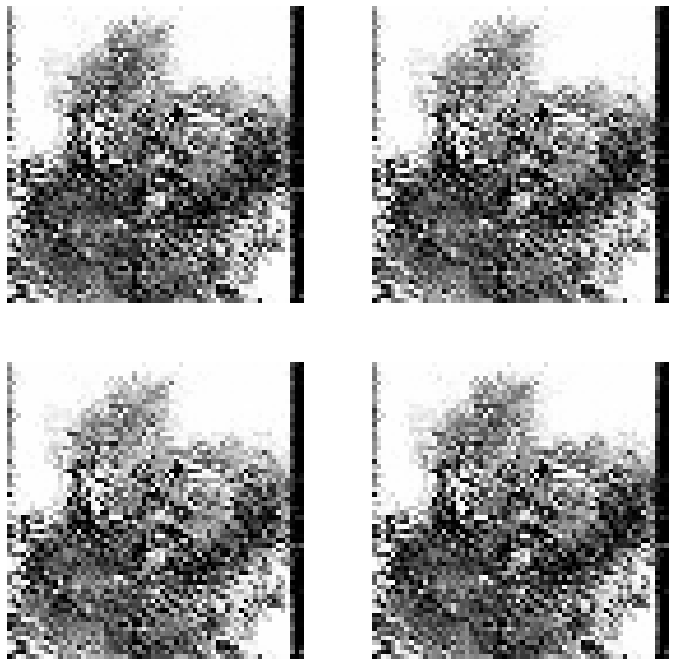

188/188 [==============================] - 153s 811ms/step - d_loss: 0.1745 - g_loss: 3.4254


In [14]:
gan.fit(
    dataset, epochs=30, callbacks=[
        GANMonitor(num_img=4, latent_dim=latent_dim, show_every=1, save=True),
    ],
)

In [15]:
discriminator.save_weights(discriminator_path)          # SAVE
generator.save_weights(generator_path)

In [41]:
discriminator_reloaded = build_discriminator()          # REBUILD D & G
generator_reloaded = build_generator()

discriminator_reloaded.load_weights("discriminator_fingerptint_final_3.h5") # LOAD WEIGHTS
generator_reloaded.load_weights("generator_fingerptint_gan_final_3.h5")

gan_reloaded = GAN(                                     # REBUILD GAN
    discriminator=discriminator_reloaded,
    generator=generator_reloaded, 
    latent_dim=latent_dim
)

Epoch 1/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1657 - g_loss: 3.4473

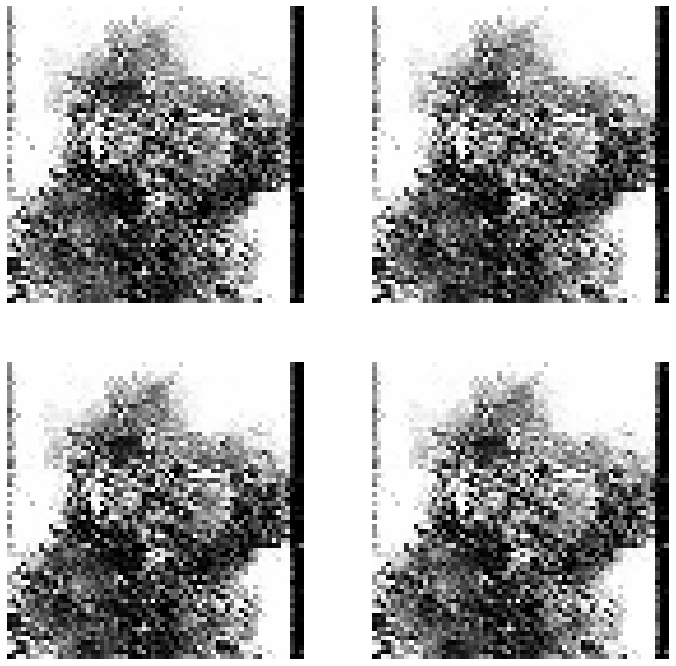

188/188 [==============================] - 156s 816ms/step - d_loss: 0.1657 - g_loss: 3.4473
Epoch 2/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1604 - g_loss: 3.4548

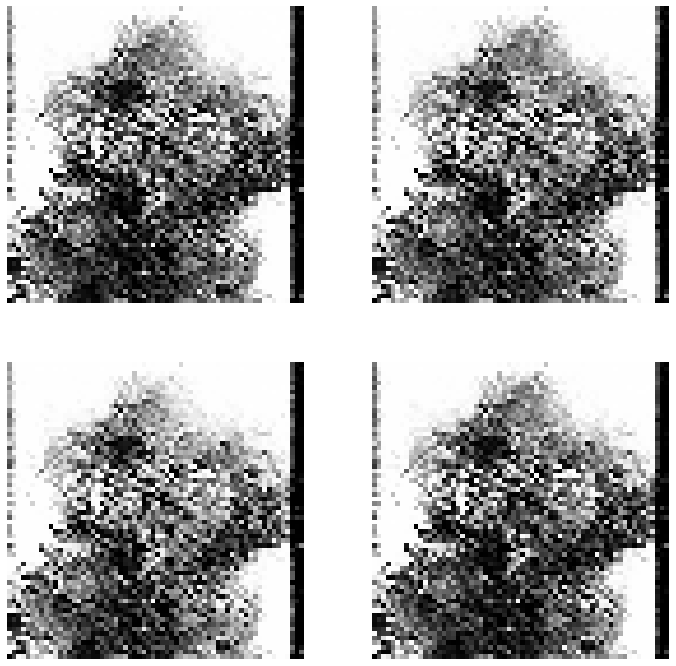

188/188 [==============================] - 153s 813ms/step - d_loss: 0.1604 - g_loss: 3.4548
Epoch 3/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1541 - g_loss: 3.4881

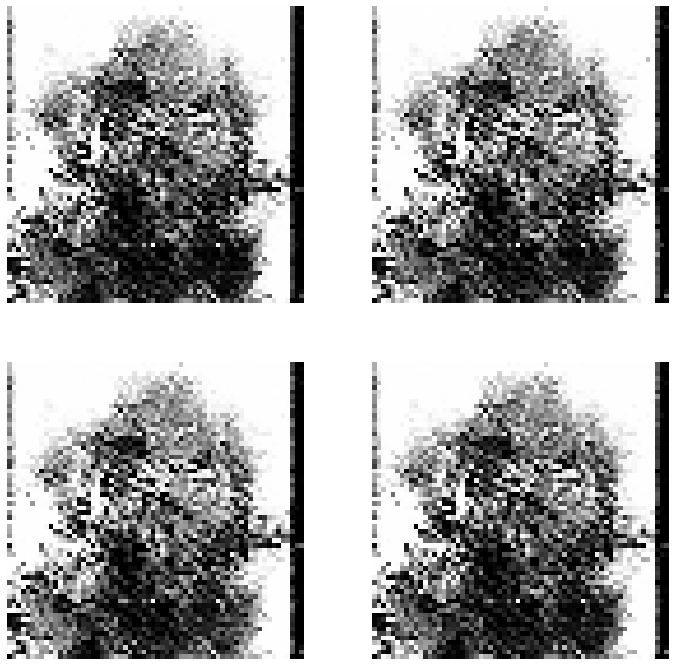

188/188 [==============================] - 154s 816ms/step - d_loss: 0.1541 - g_loss: 3.4881
Epoch 4/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1555 - g_loss: 3.4951

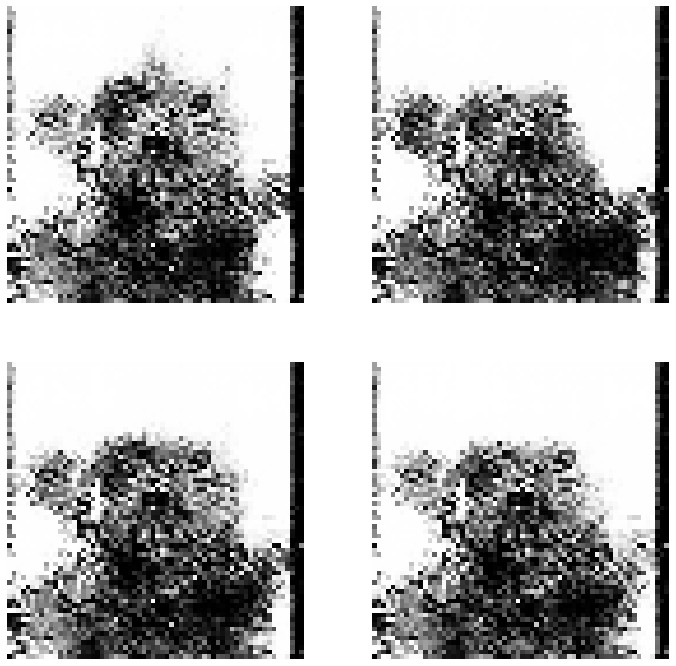

188/188 [==============================] - 156s 826ms/step - d_loss: 0.1555 - g_loss: 3.4951
Epoch 5/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1739 - g_loss: 3.5437

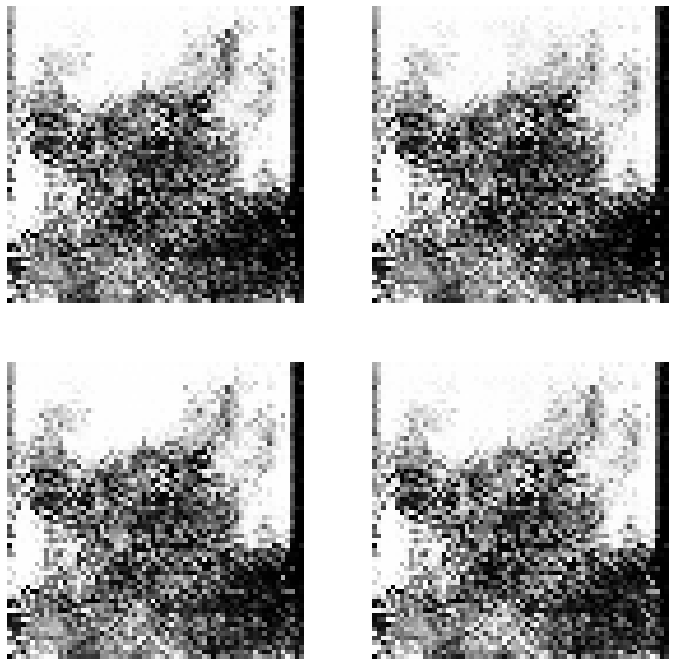

188/188 [==============================] - 154s 817ms/step - d_loss: 0.1739 - g_loss: 3.5437
Epoch 6/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1821 - g_loss: 3.4980

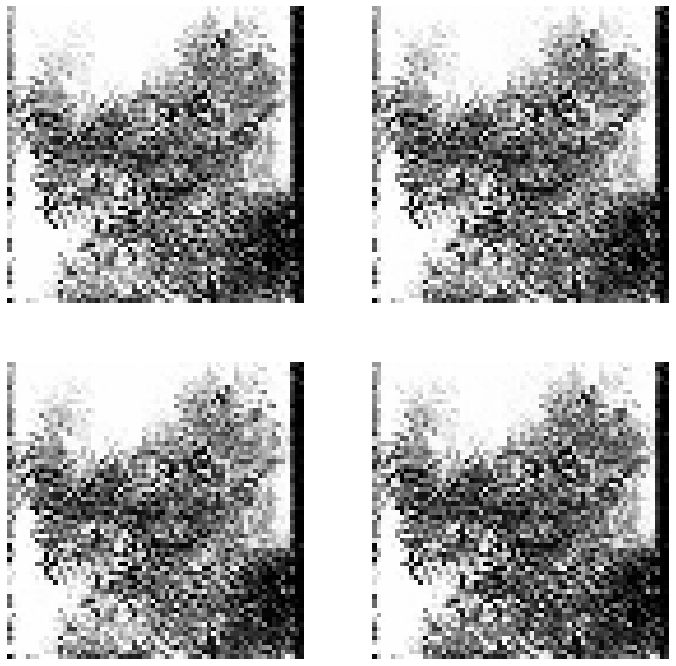

188/188 [==============================] - 154s 820ms/step - d_loss: 0.1821 - g_loss: 3.4980
Epoch 7/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1739 - g_loss: 3.4690

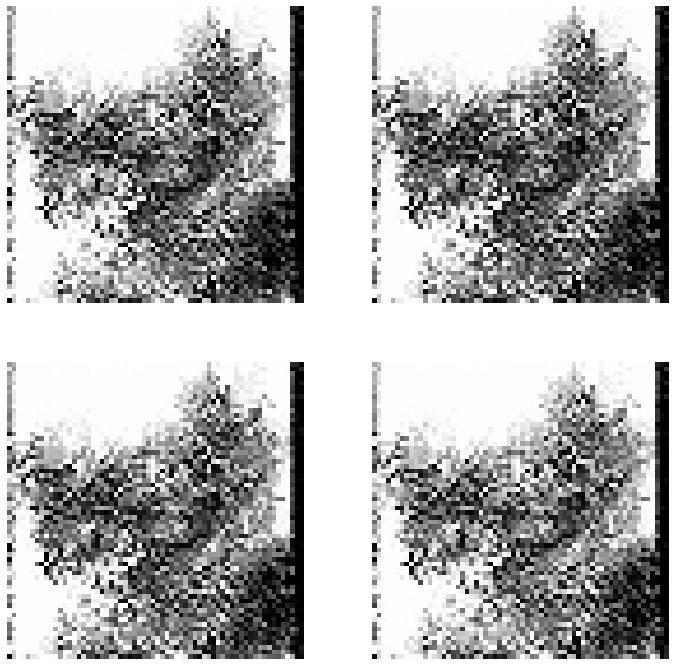

188/188 [==============================] - 156s 827ms/step - d_loss: 0.1739 - g_loss: 3.4690
Epoch 8/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1530 - g_loss: 3.5003

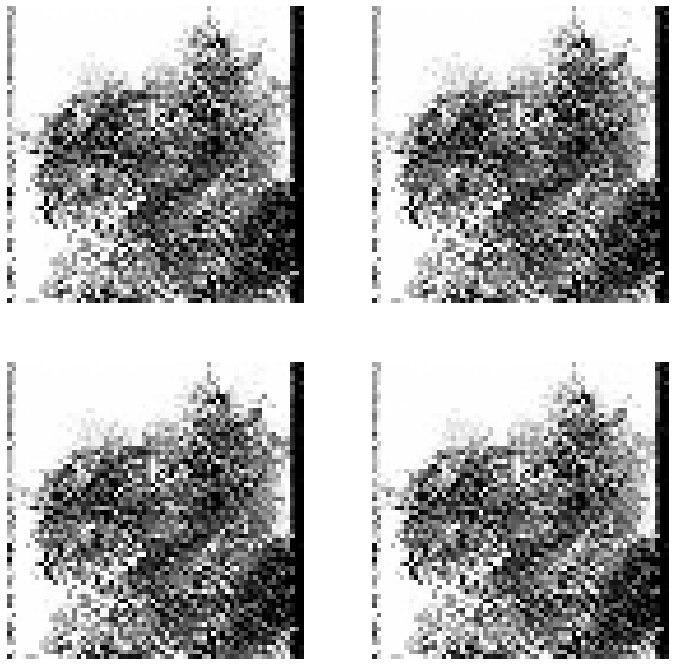

188/188 [==============================] - 155s 823ms/step - d_loss: 0.1530 - g_loss: 3.5003
Epoch 9/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1525 - g_loss: 3.5053

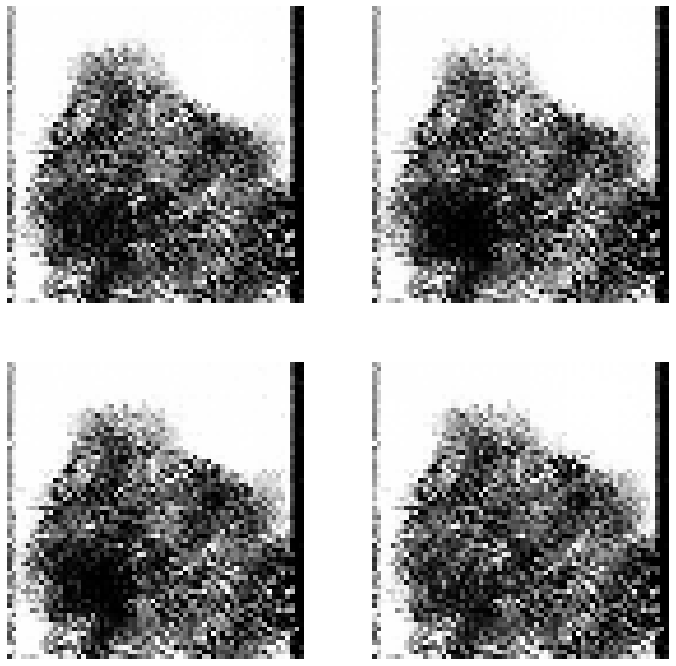

188/188 [==============================] - 152s 809ms/step - d_loss: 0.1525 - g_loss: 3.5053
Epoch 10/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1690 - g_loss: 3.4673

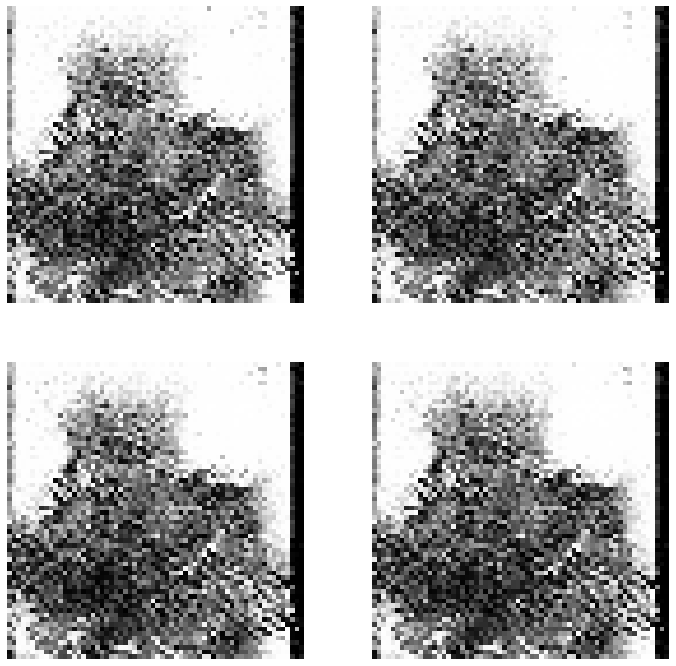

188/188 [==============================] - 152s 809ms/step - d_loss: 0.1690 - g_loss: 3.4673
Epoch 11/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1749 - g_loss: 3.4799

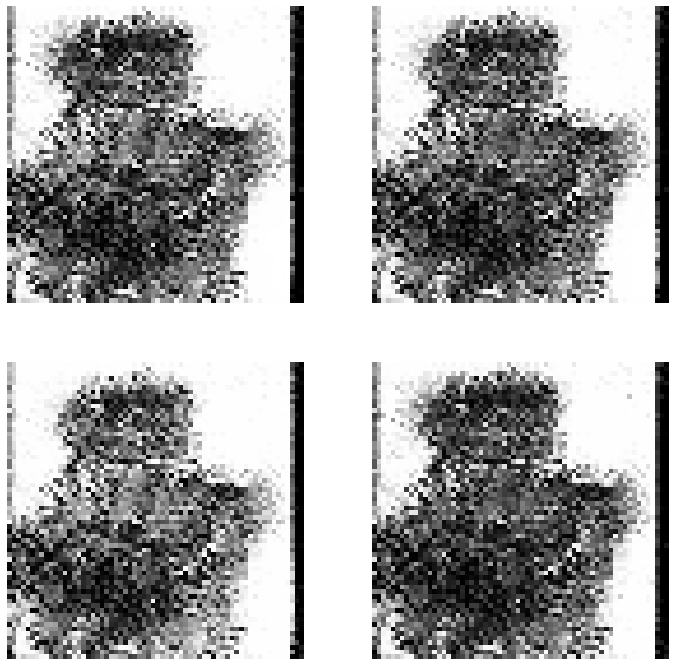

188/188 [==============================] - 152s 808ms/step - d_loss: 0.1749 - g_loss: 3.4799
Epoch 12/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1562 - g_loss: 3.4804

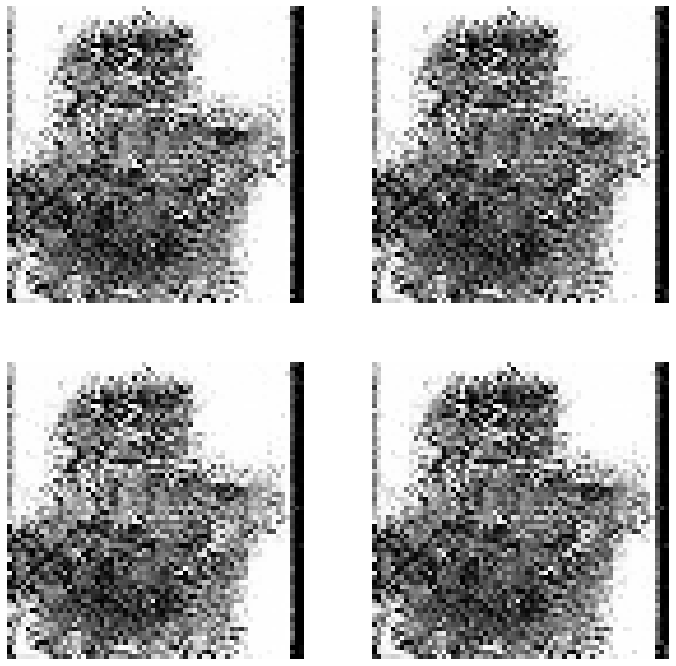

188/188 [==============================] - 153s 811ms/step - d_loss: 0.1562 - g_loss: 3.4804
Epoch 13/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1426 - g_loss: 3.4778

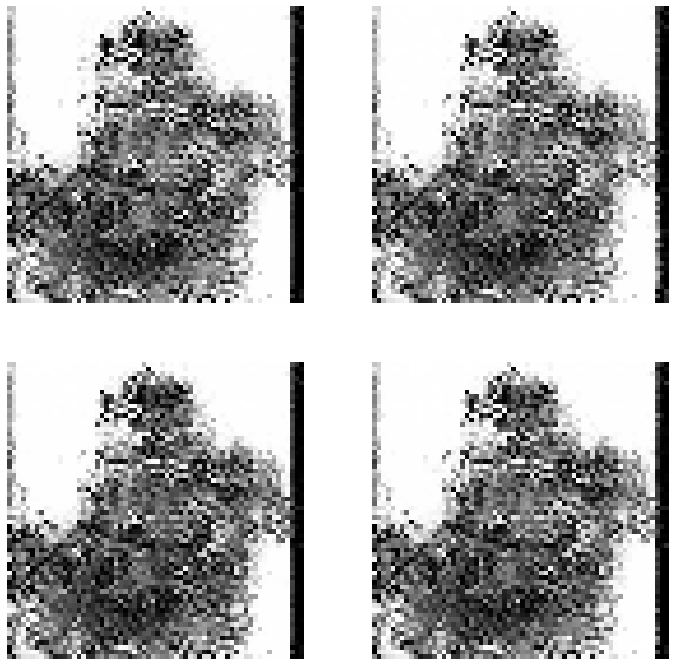

188/188 [==============================] - 153s 812ms/step - d_loss: 0.1426 - g_loss: 3.4778
Epoch 14/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1657 - g_loss: 3.4819

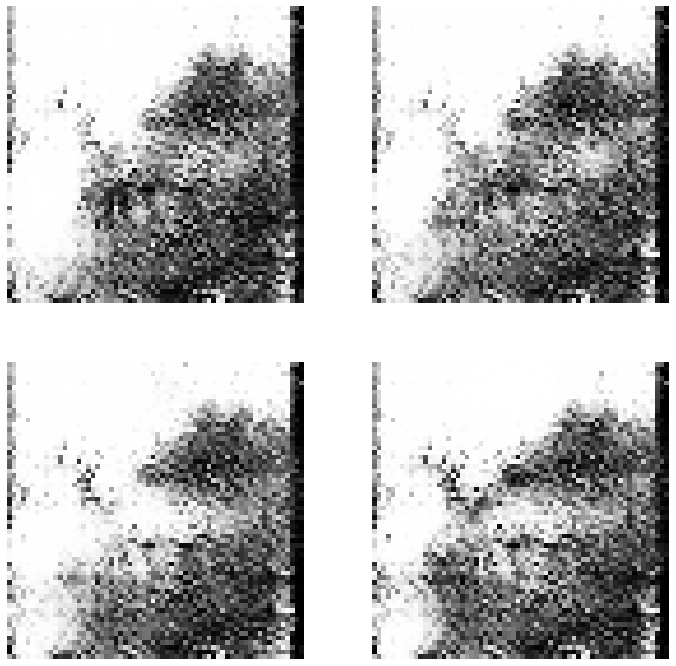

188/188 [==============================] - 152s 808ms/step - d_loss: 0.1657 - g_loss: 3.4819
Epoch 15/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1698 - g_loss: 3.4913

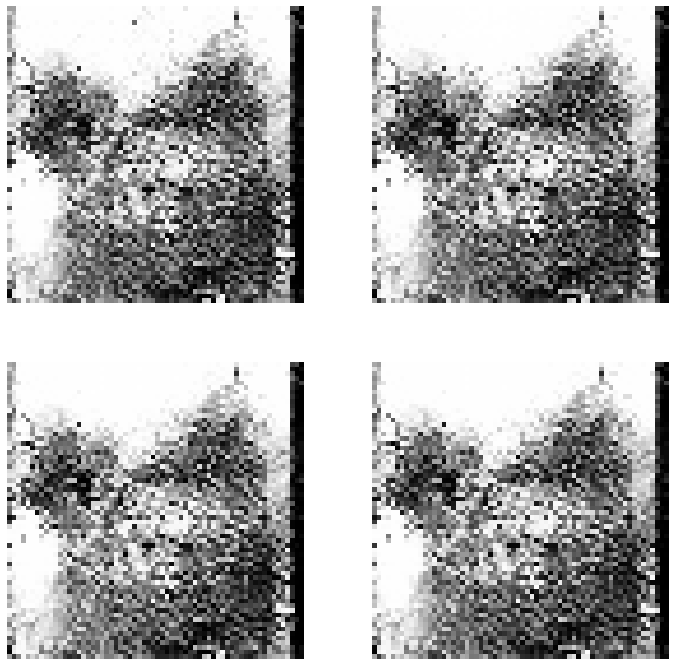

188/188 [==============================] - 152s 810ms/step - d_loss: 0.1698 - g_loss: 3.4913
Epoch 16/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1616 - g_loss: 3.4674

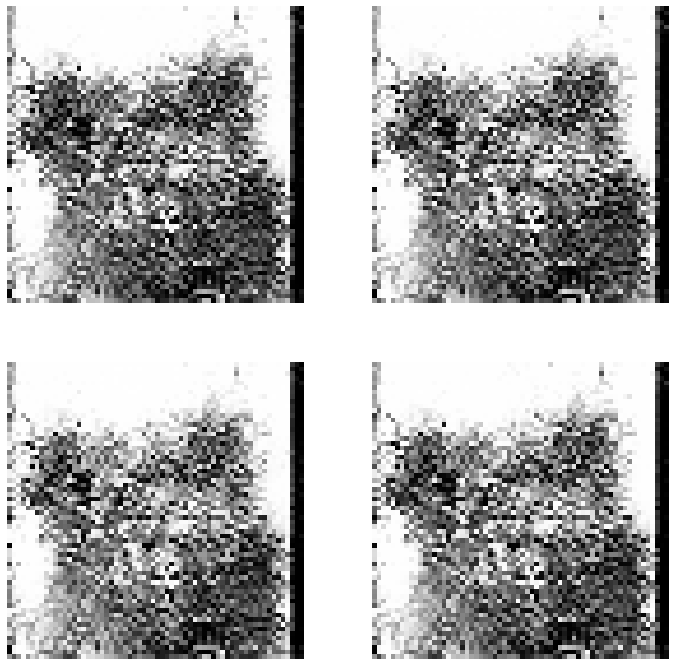

188/188 [==============================] - 152s 809ms/step - d_loss: 0.1616 - g_loss: 3.4674
Epoch 17/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1516 - g_loss: 3.4864

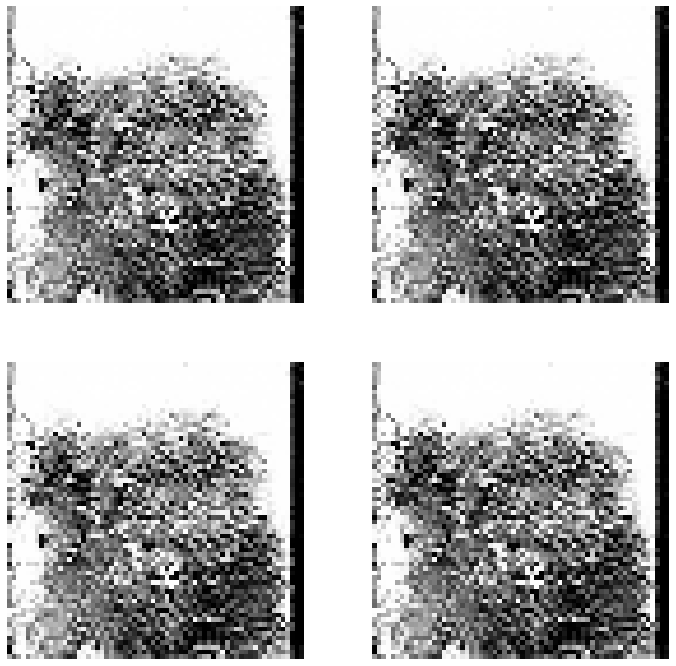

188/188 [==============================] - 152s 808ms/step - d_loss: 0.1516 - g_loss: 3.4864
Epoch 18/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1520 - g_loss: 3.5055

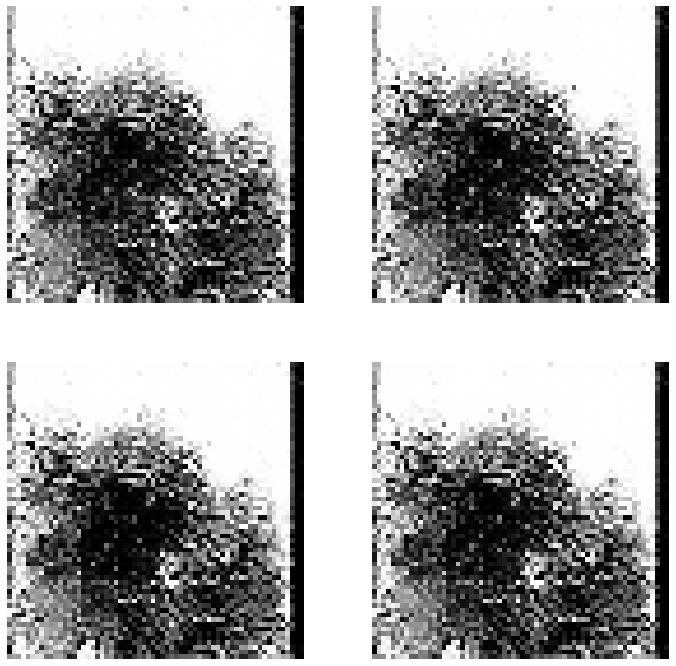

188/188 [==============================] - 152s 806ms/step - d_loss: 0.1520 - g_loss: 3.5055
Epoch 19/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1542 - g_loss: 3.5247

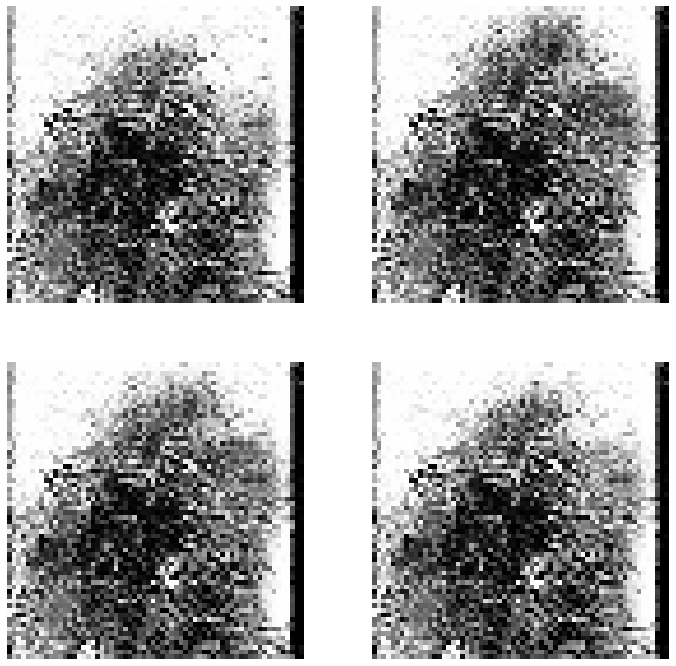

188/188 [==============================] - 152s 809ms/step - d_loss: 0.1542 - g_loss: 3.5247
Epoch 20/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1620 - g_loss: 3.4772

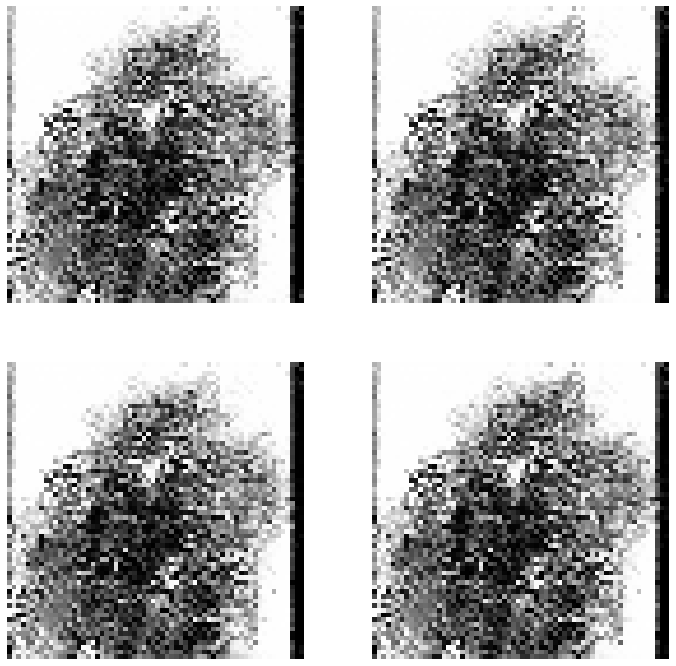

188/188 [==============================] - 152s 810ms/step - d_loss: 0.1620 - g_loss: 3.4772
Epoch 21/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1529 - g_loss: 3.4974

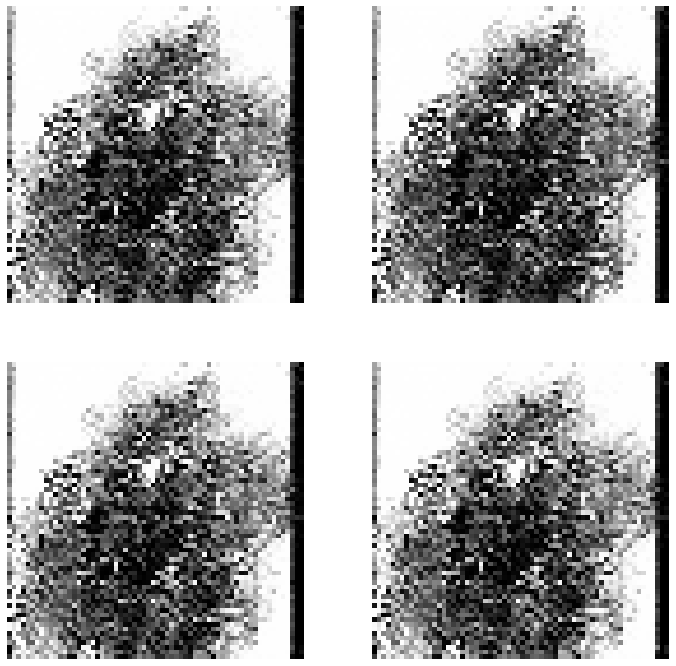

188/188 [==============================] - 151s 803ms/step - d_loss: 0.1529 - g_loss: 3.4974
Epoch 22/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1478 - g_loss: 3.5034

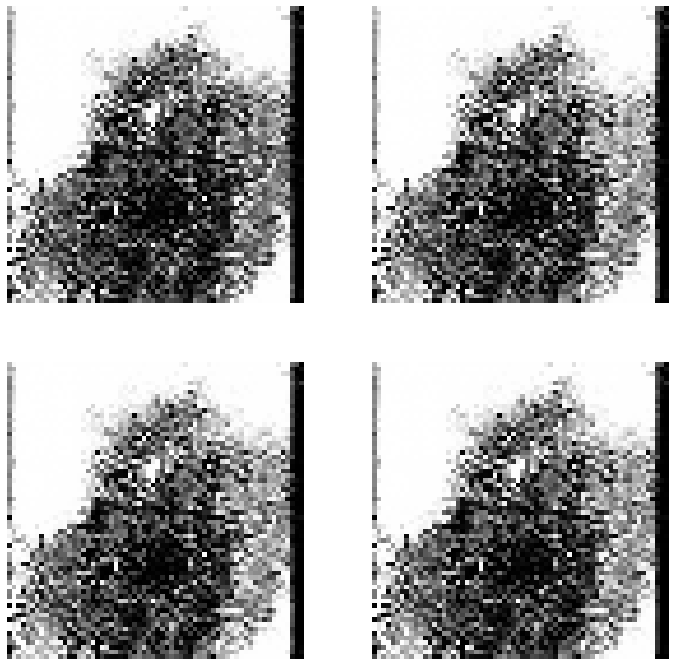

188/188 [==============================] - 152s 806ms/step - d_loss: 0.1478 - g_loss: 3.5034
Epoch 23/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1511 - g_loss: 3.5399

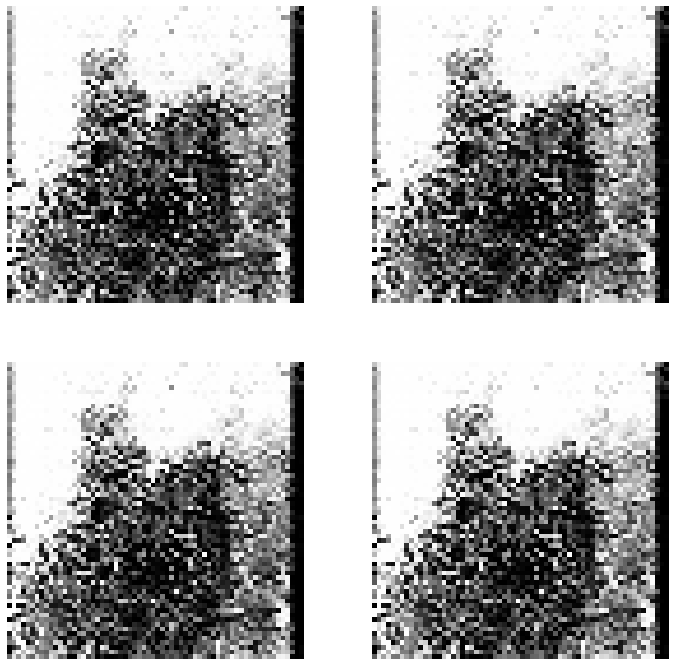

188/188 [==============================] - 153s 812ms/step - d_loss: 0.1511 - g_loss: 3.5399
Epoch 24/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1499 - g_loss: 3.5257

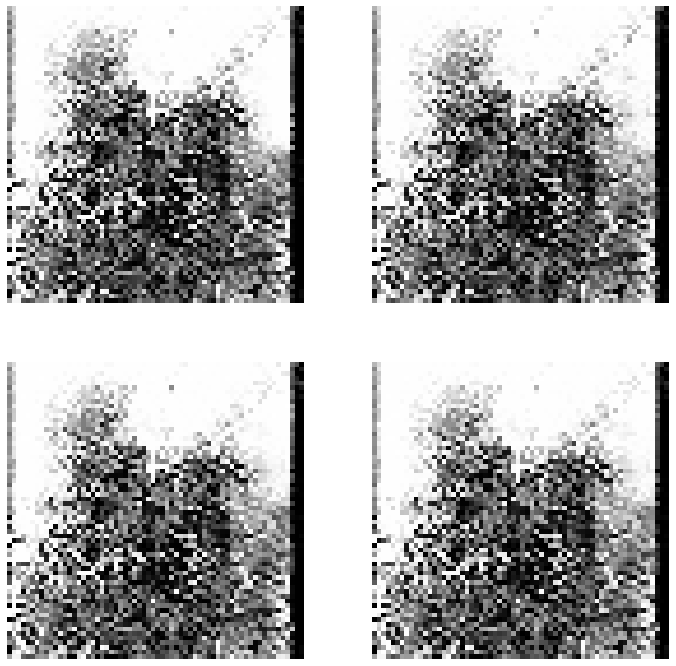

188/188 [==============================] - 153s 813ms/step - d_loss: 0.1499 - g_loss: 3.5257
Epoch 25/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1495 - g_loss: 3.5279

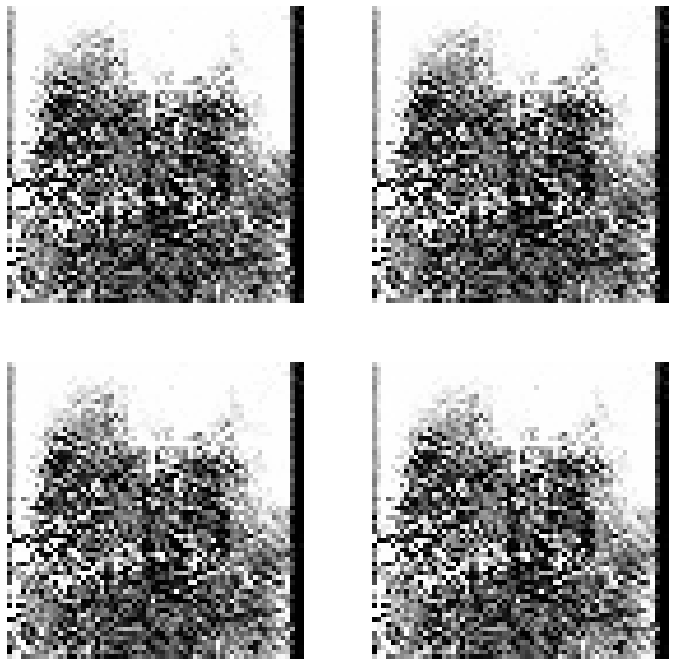

188/188 [==============================] - 152s 808ms/step - d_loss: 0.1495 - g_loss: 3.5279
Epoch 26/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1438 - g_loss: 3.5377

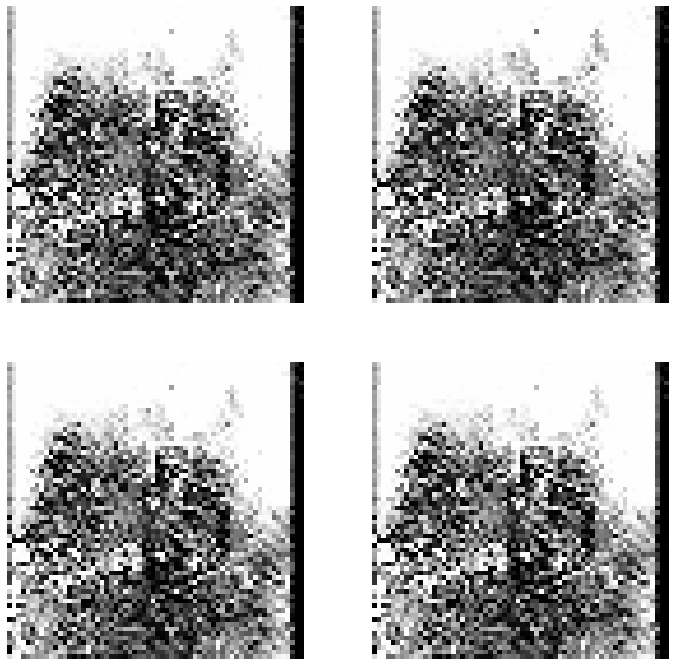

188/188 [==============================] - 153s 816ms/step - d_loss: 0.1438 - g_loss: 3.5377
Epoch 27/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1383 - g_loss: 3.5606

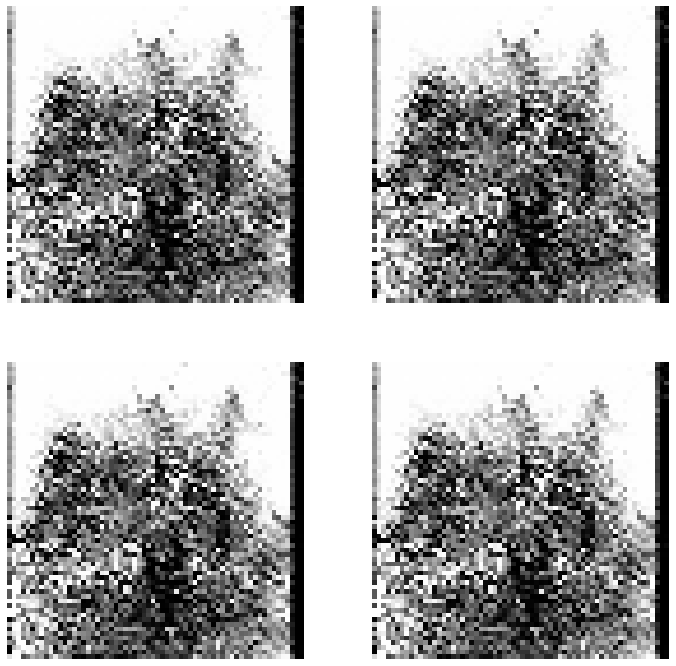

188/188 [==============================] - 155s 826ms/step - d_loss: 0.1383 - g_loss: 3.5606
Epoch 28/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1464 - g_loss: 3.5471

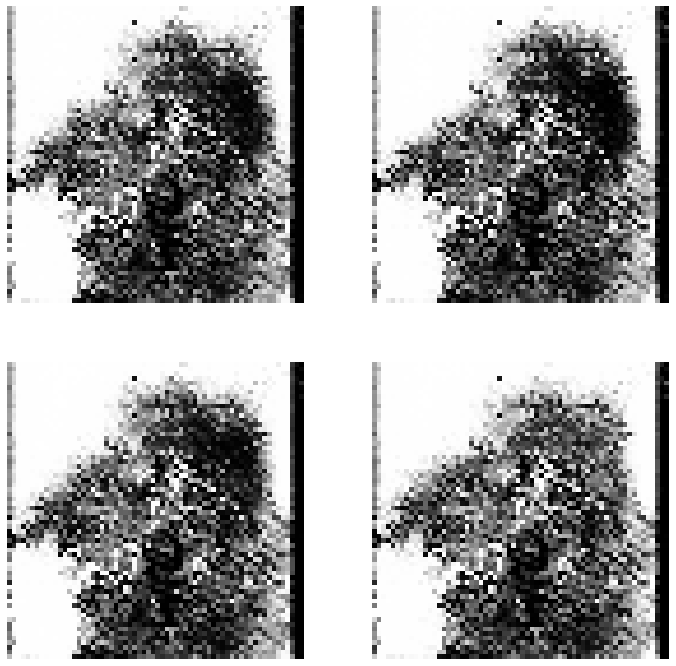

188/188 [==============================] - 153s 816ms/step - d_loss: 0.1464 - g_loss: 3.5471
Epoch 29/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1526 - g_loss: 3.5636

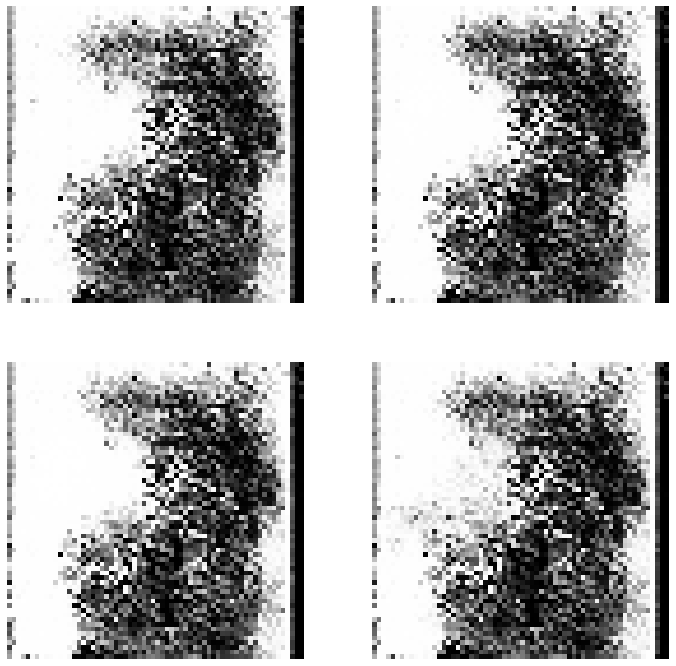

188/188 [==============================] - 156s 827ms/step - d_loss: 0.1526 - g_loss: 3.5636
Epoch 30/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1369 - g_loss: 3.5926

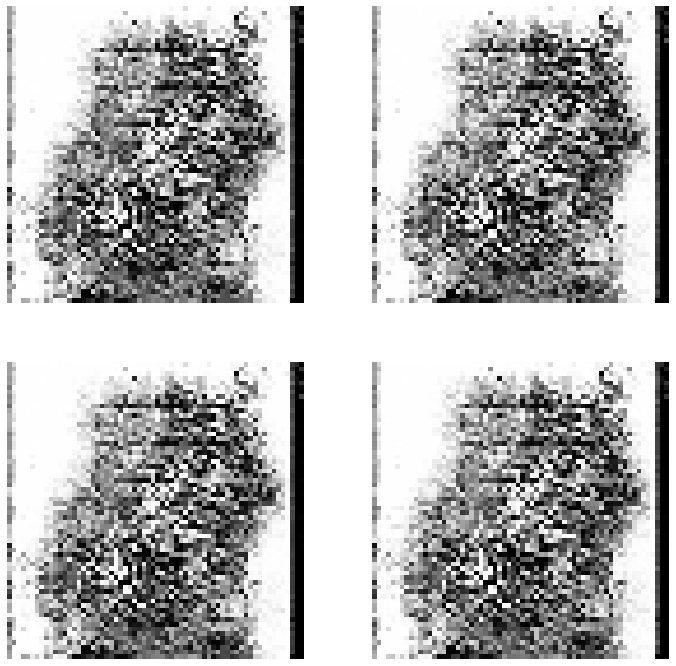

188/188 [==============================] - 154s 821ms/step - d_loss: 0.1369 - g_loss: 3.5926
Epoch 31/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1478 - g_loss: 3.5873

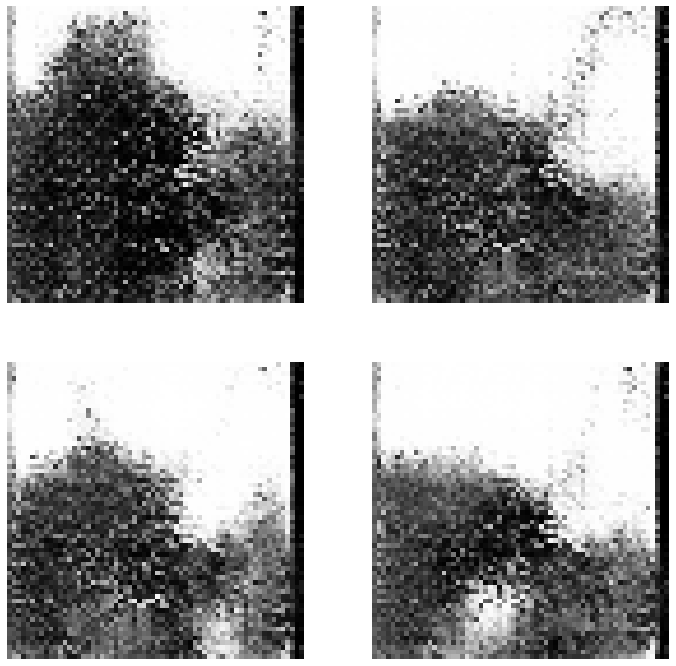

188/188 [==============================] - 152s 808ms/step - d_loss: 0.1478 - g_loss: 3.5873
Epoch 32/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1548 - g_loss: 3.5165

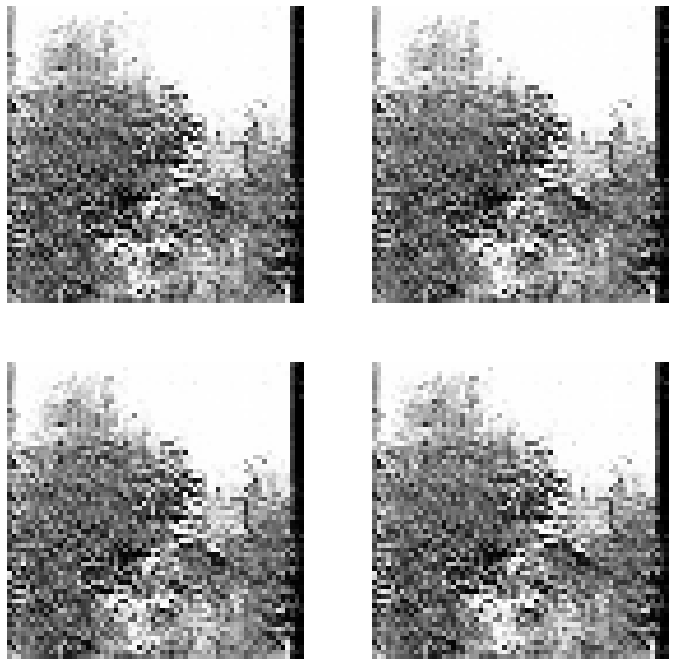

188/188 [==============================] - 151s 805ms/step - d_loss: 0.1548 - g_loss: 3.5165
Epoch 33/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1457 - g_loss: 3.5205

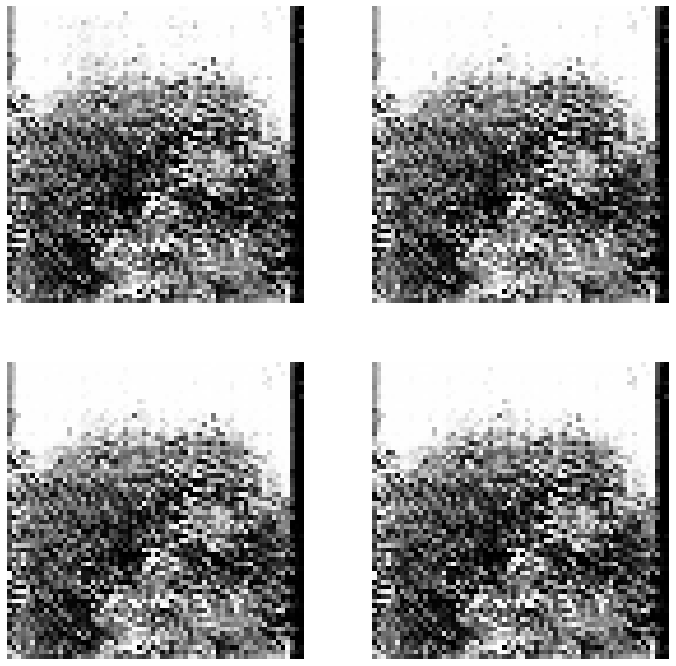

188/188 [==============================] - 152s 807ms/step - d_loss: 0.1457 - g_loss: 3.5205
Epoch 34/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1421 - g_loss: 3.5219

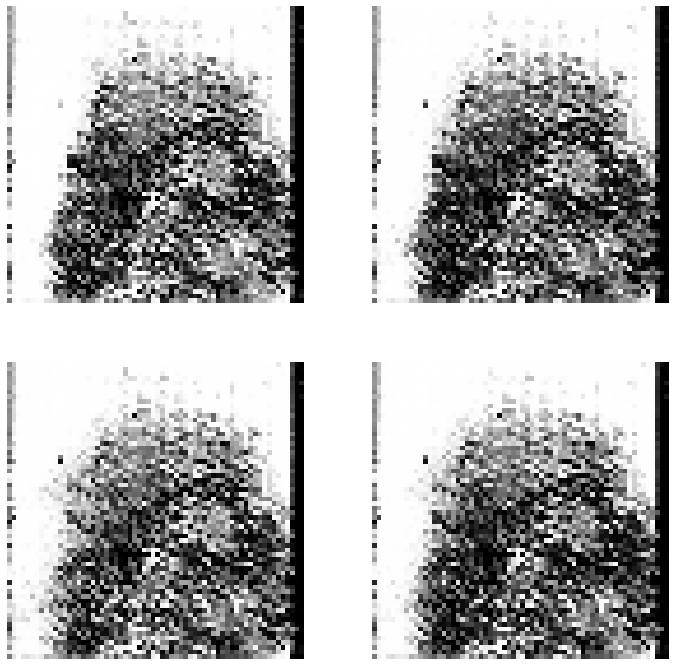

188/188 [==============================] - 152s 808ms/step - d_loss: 0.1421 - g_loss: 3.5219
Epoch 35/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1466 - g_loss: 3.5566

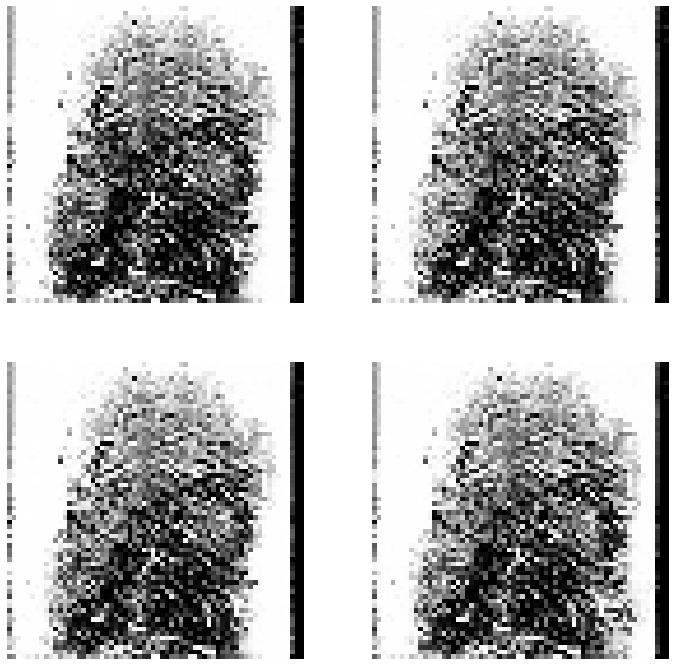

188/188 [==============================] - 153s 812ms/step - d_loss: 0.1466 - g_loss: 3.5566
Epoch 36/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1518 - g_loss: 3.5778

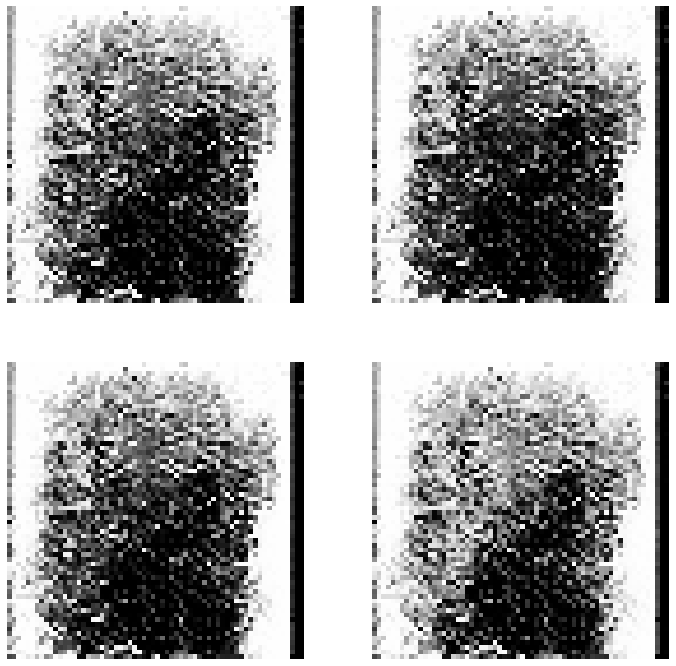

188/188 [==============================] - 153s 811ms/step - d_loss: 0.1518 - g_loss: 3.5778
Epoch 37/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1463 - g_loss: 3.5726

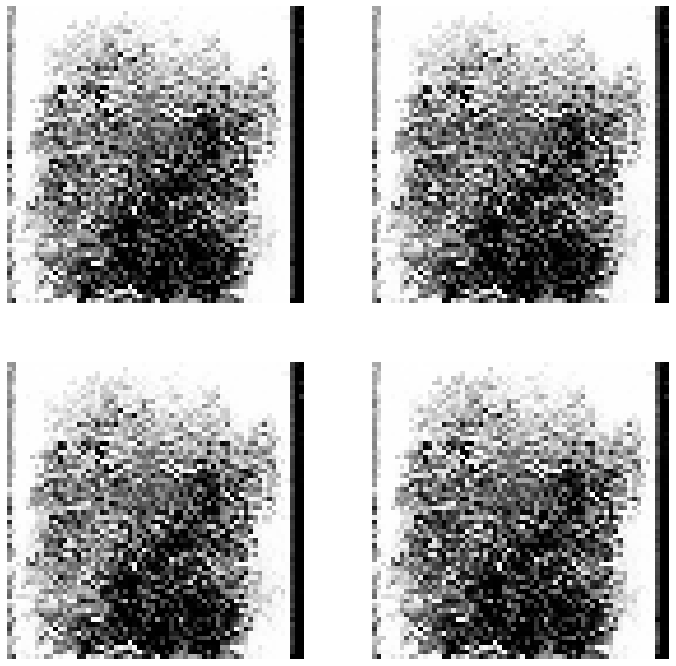

188/188 [==============================] - 153s 811ms/step - d_loss: 0.1463 - g_loss: 3.5726
Epoch 38/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1446 - g_loss: 3.5899

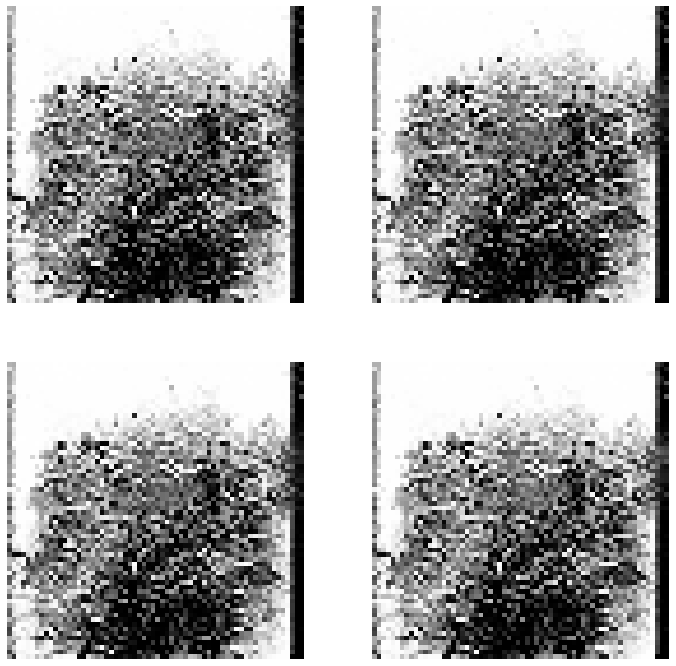

188/188 [==============================] - 152s 809ms/step - d_loss: 0.1446 - g_loss: 3.5899
Epoch 39/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1449 - g_loss: 3.5650

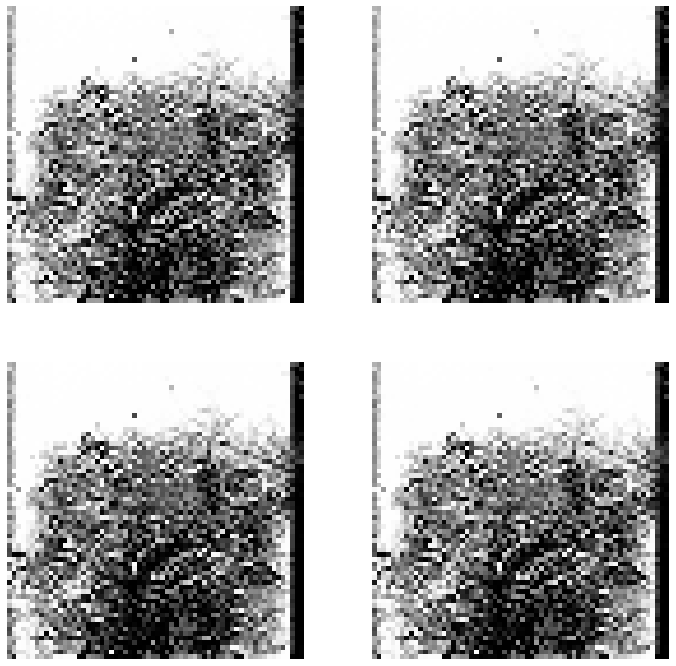

188/188 [==============================] - 153s 812ms/step - d_loss: 0.1449 - g_loss: 3.5650
Epoch 40/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1419 - g_loss: 3.5795

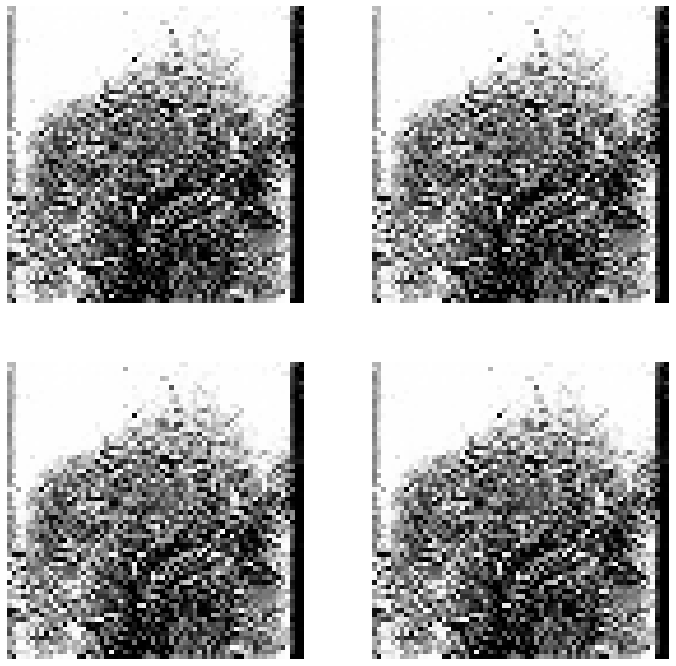

188/188 [==============================] - 153s 811ms/step - d_loss: 0.1419 - g_loss: 3.5795
Epoch 41/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1443 - g_loss: 3.5611

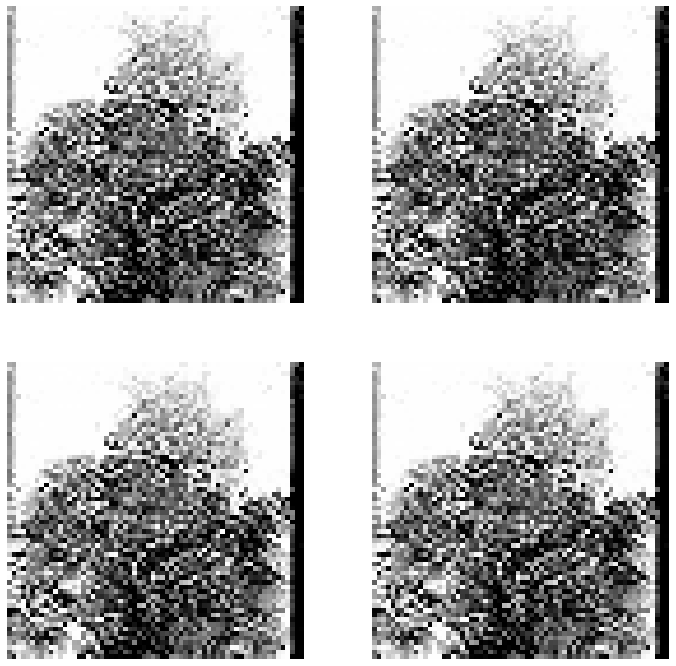

188/188 [==============================] - 153s 813ms/step - d_loss: 0.1443 - g_loss: 3.5611
Epoch 42/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1405 - g_loss: 3.5673

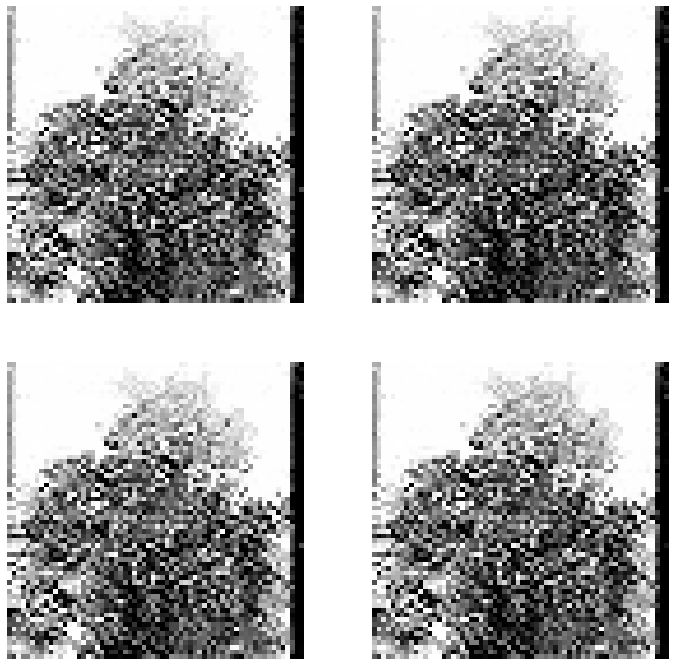

188/188 [==============================] - 152s 807ms/step - d_loss: 0.1405 - g_loss: 3.5673
Epoch 43/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1368 - g_loss: 3.5746

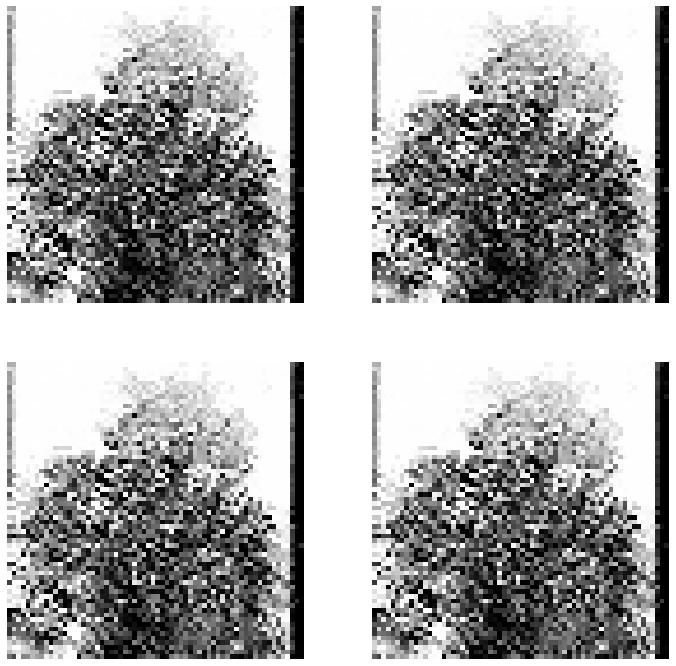

188/188 [==============================] - 152s 807ms/step - d_loss: 0.1368 - g_loss: 3.5746
Epoch 44/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1365 - g_loss: 3.5721

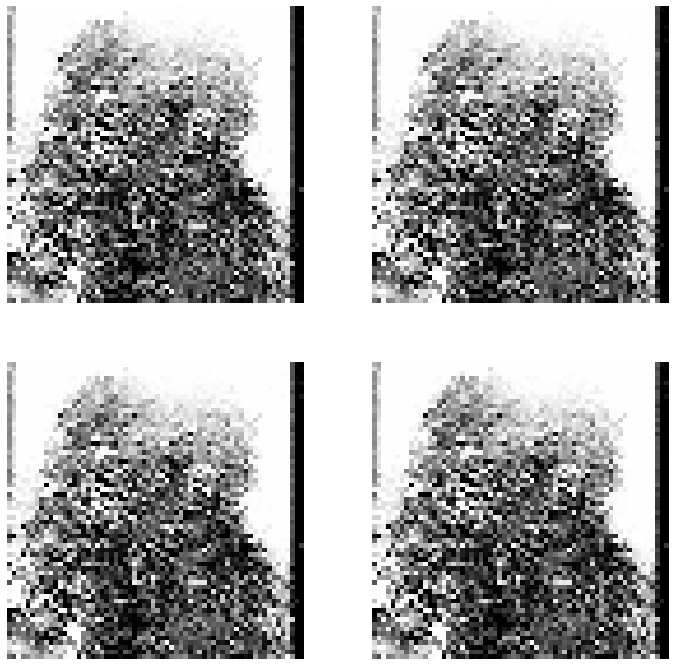

188/188 [==============================] - 153s 812ms/step - d_loss: 0.1365 - g_loss: 3.5721
Epoch 45/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1393 - g_loss: 3.5811

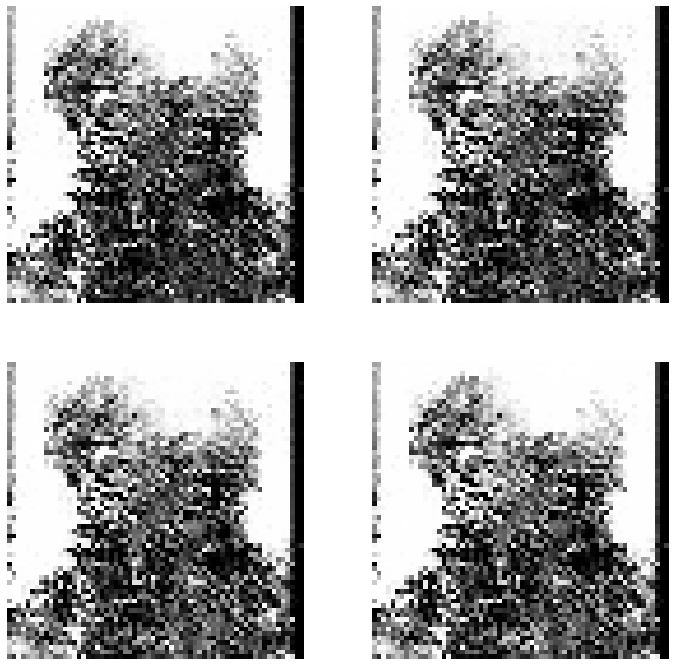

188/188 [==============================] - 153s 815ms/step - d_loss: 0.1393 - g_loss: 3.5811
Epoch 46/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1334 - g_loss: 3.5945

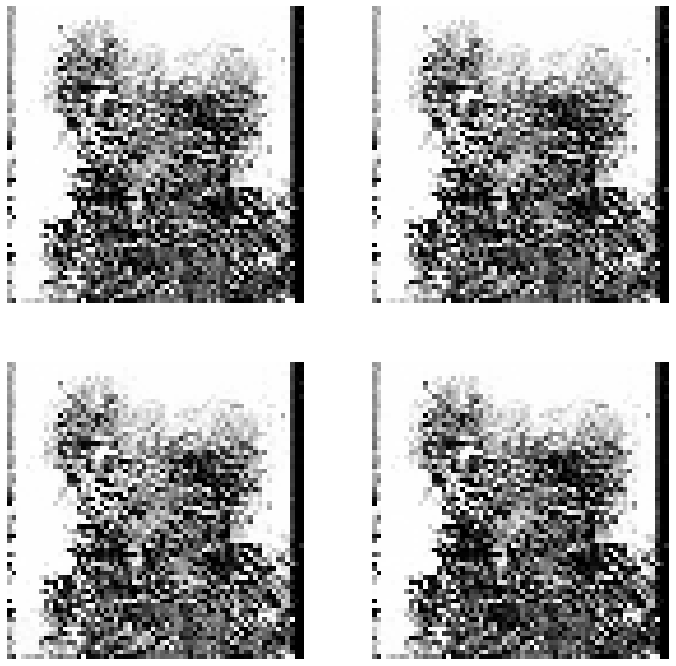

188/188 [==============================] - 152s 808ms/step - d_loss: 0.1334 - g_loss: 3.5945
Epoch 47/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1344 - g_loss: 3.6060

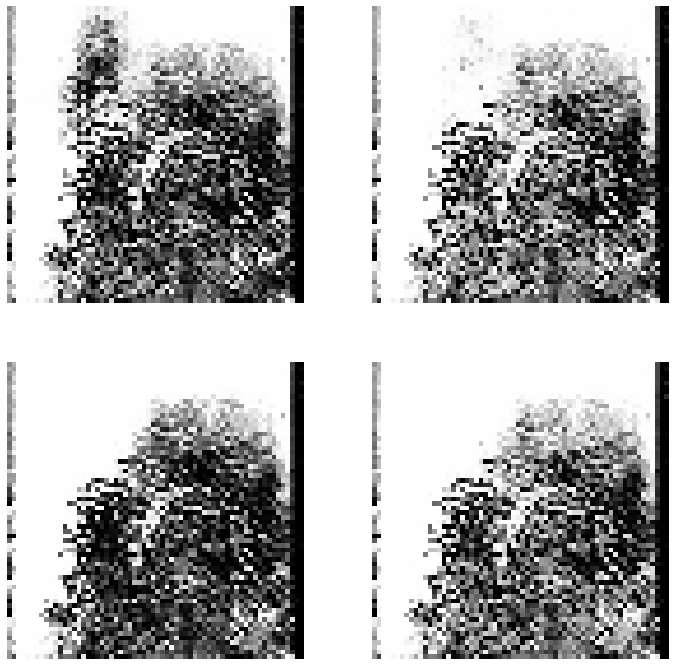

188/188 [==============================] - 152s 809ms/step - d_loss: 0.1344 - g_loss: 3.6060
Epoch 48/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1362 - g_loss: 3.6261

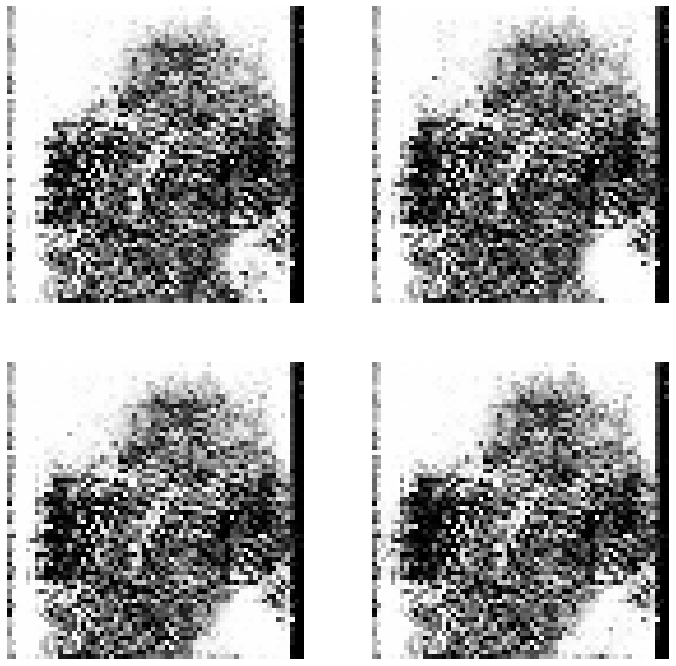

188/188 [==============================] - 153s 814ms/step - d_loss: 0.1362 - g_loss: 3.6261
Epoch 49/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1525 - g_loss: 3.6028

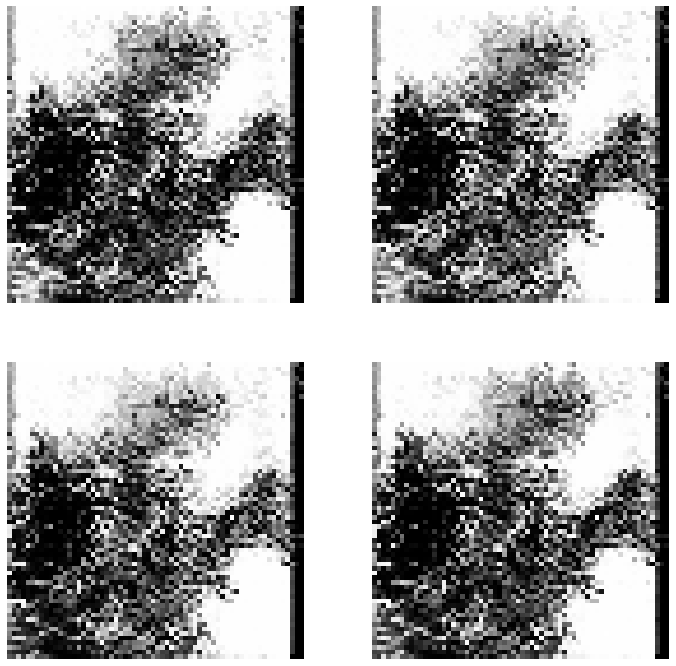

188/188 [==============================] - 163s 865ms/step - d_loss: 0.1525 - g_loss: 3.6028
Epoch 50/50
188/188 [==============================] - ETA: 0s - d_loss: 0.1386 - g_loss: 3.6218

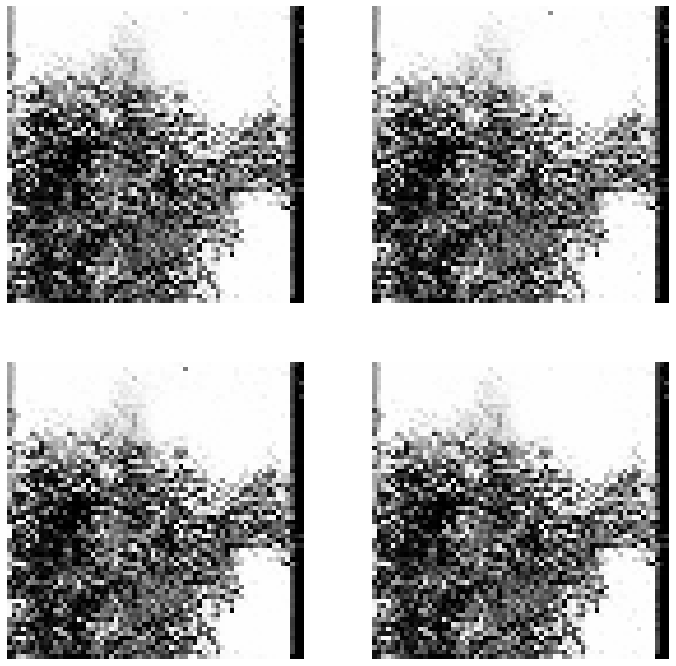

188/188 [==============================] - 154s 817ms/step - d_loss: 0.1386 - g_loss: 3.6218


In [43]:
# Compile GAN model
gan_reloaded.compile(
    d_optimizer=tf.keras.optimizers.SGD(learning_rate=0.0002),
    g_optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002),
    loss_fn=tf.keras.losses.BinaryCrossentropy(),
)

# continue training the GAN model
gan_reloaded.fit(
    dataset, epochs=50, callbacks=[
        GANMonitor(num_img=4, latent_dim=latent_dim, show_every=1, save=True),
    ],
)


In the upper GAN model and other models provided in the "x" notebook, the outcome pictures are more like the area where a fingerprint is located in the real images rather than, a new fingerprint. I thought it might be good to also try this data set with a VAE, to see if we can define fingerprints between transactions of two fingerprints.

# VAE
## VAE 1st model

In [66]:
tf.keras.backend.clear_session()

In [67]:
# importing data
img_dir = "Fingerprints/Fingerprints"
out_dir = "generated-grayscale-new"

if not os.path.isdir(out_dir):
    os.mkdir(out_dir)

batch_size = 32 # 128
img_size = 64

dataset = tf.keras.utils.image_dataset_from_directory(
    img_dir,
    label_mode=None,
    image_size=(img_size, img_size),
    batch_size=batch_size,
    smart_resize=True
)

Found 6000 files belonging to 1 classes.


In [68]:
dataset = dataset.map(lambda x: (tf.image.rgb_to_grayscale(x),))
dataset = dataset.map(lambda x: (x / 255)) #normalize input between 0 and 1 

I guess it is good to quote from David Foster in Generative Deep Learning: Teaching Machines to Paint, Write, Compose, and Play, about variational autoencoders and why we use log:
"Variational autoencoders assume that there is no correlation between any of the dimensions in the latent space and therefore that the covariance matrix is diagonal. This means the encoder only needs to map each input to a mean vector and a variance vector and does not need to worry about covariance between dimensions. We also choose to map to the logarithm of the variance, as this can take any real number in the range (– ∞, ∞), matching the natural output range from a neural network unit, whereas variance values are always positive."

In [69]:
latent_dim = 128
def build_encoder(latent_dim=128):
    encoder_inputs = tf.keras.Input(shape=(64, 64, 1))
    x = tf.keras.layers.Conv2D(32, 3, activation="relu", strides=2, padding="same")(encoder_inputs)
    x = tf.keras.layers.Conv2D(64, 3, activation="relu", strides=2, padding="same")(x)
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(16, activation="relu")(x)
    z_mean = tf.keras.layers.Dense(latent_dim, name="z_mean")(x)               # MEAN
    z_log_var = tf.keras.layers.Dense(latent_dim, name="z_log_var")(x)         # LOG OF VARIANCE = log(sigma**2)
    return tf.keras.Model(encoder_inputs, [z_mean, z_log_var], name="encoder") 
encoder = build_encoder(latent_dim=latent_dim)

In [70]:
encoder.summary()

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 64, 64, 1)]          0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 32, 32, 32)           320       ['input_1[0][0]']             
                                                                                                  
 conv2d_1 (Conv2D)           (None, 16, 16, 64)           18496     ['conv2d[0][0]']              
                                                                                                  
 flatten (Flatten)           (None, 16384)                0         ['conv2d_1[0][0]']            
                                                                                            

David Foster(20019) mentioned "The encoder will take each input image and encode it to two vectors, mu and log<sub>var</sub> which together define a multivariate normal distribution in the latent space:
- mu (The mean point of the distribution)
- log<sub>var</sub> (The logarithm of the variance of each dimension.)
To encode an image into a specific point z in the latent space, we can sample from this distribution, using the following equation:
$$ z = \mu + \sigma \cdot \epsilon $$
where
$$ \sigma = \exp\left(\frac{\text{log}_{\text{var}}}{2}\right) $$
epsilon is a point sampled from the standard normal distribution."

In [71]:
class Sampler(tf.keras.layers.Layer):
    """From a mean mu and a log variance, sample a number with mu + sigma * epsilon"""
    def call(self, z_mean, z_log_var):
        batch_size = tf.shape(z_mean)[0]
        z_size = tf.shape(z_mean)[1]
        epsilon = tf.random.normal(shape=(batch_size, z_size)) 
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon      # this is equivalent to mu + sigma * epsilon

In [72]:
def build_decoder(latent_dim=128):
    latent_inputs = tf.keras.Input(shape=(latent_dim,))
    x = tf.keras.layers.Dense(16 * 16 * 64, activation="relu")(latent_inputs)
    x = tf.keras.layers.Reshape((16, 16, 64))(x)
    x = tf.keras.layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(x) 
    x = tf.keras.layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
    decoder_outputs = tf.keras.layers.Conv2D(1, 3, activation="sigmoid", padding="same")(x)
    return tf.keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder = build_decoder(latent_dim=latent_dim)

In [73]:
decoder.summary()

Model: "decoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 128)]             0         
                                                                 
 dense_1 (Dense)             (None, 16384)             2113536   
                                                                 
 reshape (Reshape)           (None, 16, 16, 64)        0         
                                                                 
 conv2d_transpose (Conv2DTr  (None, 32, 32, 64)        36928     
 anspose)                                                        
                                                                 
 conv2d_transpose_1 (Conv2D  (None, 64, 64, 32)        18464     
 Transpose)                                                      
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 1)         289 

In [74]:
class VAE(tf.keras.Model):
    def __init__(self, encoder, decoder, beta = 1.0, **kwargs):
        super().__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.sampler = Sampler()
        self.total_loss_tracker = tf.keras.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = tf.keras.metrics.Mean(
            name="reconstruction_loss"
        )
        self.kl_loss_tracker = tf.keras.metrics.Mean(name="kl_loss")
        self.beta = beta

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker
        ]

    def train_step(self, data):
        with tf.GradientTape() as tape:                                    # 1. GENERATION
            z_mean, z_log_var = self.encoder(data)                         #   a. encode to mean & log var
            z = self.sampler(z_mean, z_log_var)                            #   b. a batch of random numbers
            reconstruction = decoder(z)                                    #   c. decode into reconstructed images

            reconstruction_loss = tf.reduce_mean(                          # 2. LOSSES
                tf.reduce_sum(                                             #   a. reconstruction_loss: BCE 
                    tf.keras.losses.binary_crossentropy(data, reconstruction), #  between data & reconstructions
                    axis=(1, 2)
                )
            )                                                              #   b. regularisation loss
                                                                           #      Kullback-Leibler divergence (forces
            kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var)) # our space to be well-formed)
            kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))  # Sum over latent dimensions
            
            total_loss = reconstruction_loss + self.beta * kl_loss     #   c. total

        grads = tape.gradient(total_loss, self.trainable_weights)          # 3. BACKPROP
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights)) #   a. compute & apply gradients

        self.total_loss_tracker.update_state(total_loss)                   #   b.update our metrics trackers
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)

        return {
            "total_loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }


In [75]:
vae = VAE(encoder, decoder, beta=1.0)
vae.compile(optimizer=tf.keras.optimizers.Adam(), loss='MSE') 


1/1 [==============================] - 0s 71ms/step


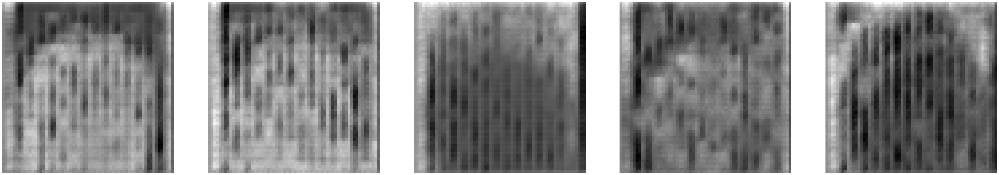

1/1 [==============================] - 0s 21ms/step


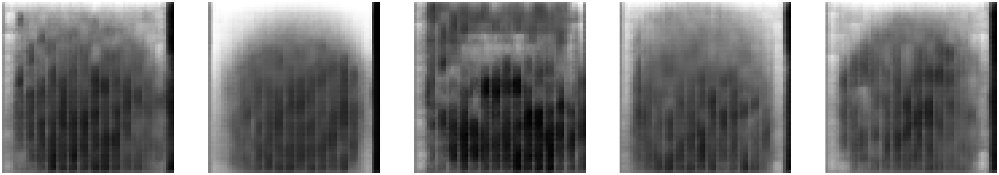

1/1 [==============================] - 0s 20ms/step


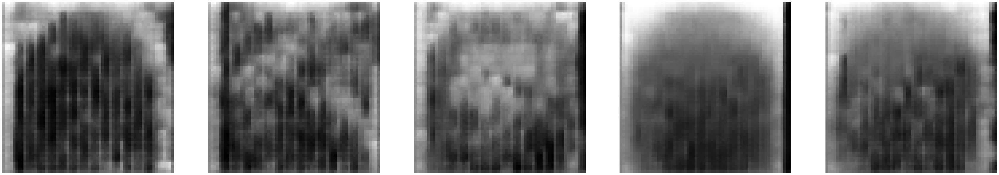

1/1 [==============================] - 0s 19ms/step


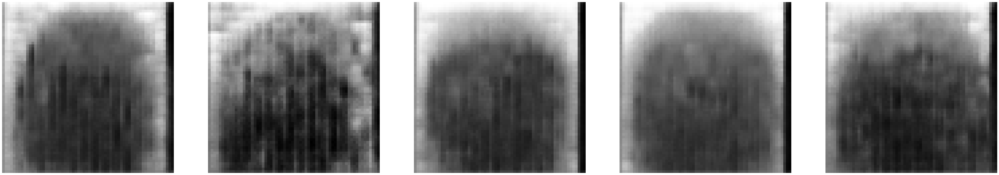

1/1 [==============================] - 0s 21ms/step


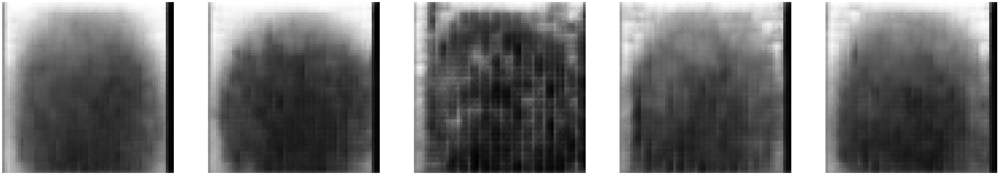

1/1 [==============================] - 0s 21ms/step


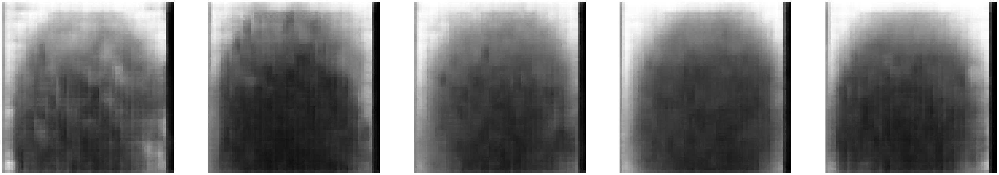

1/1 [==============================] - 0s 24ms/step


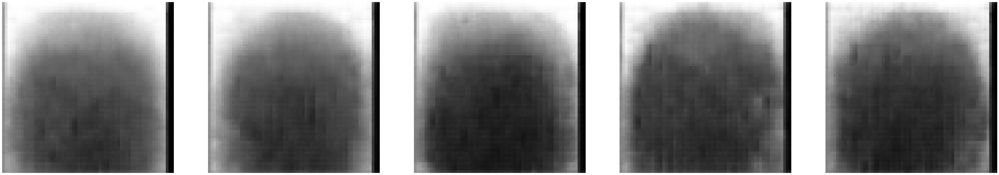

1/1 [==============================] - 0s 22ms/step


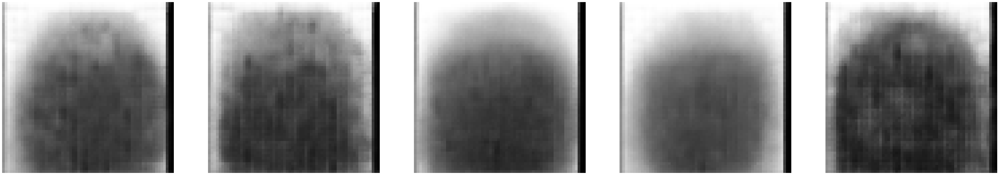

1/1 [==============================] - 0s 20ms/step


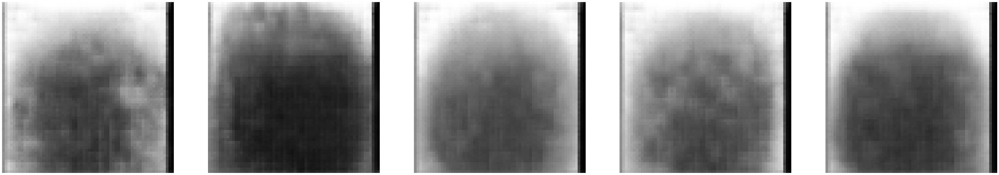

1/1 [==============================] - 0s 20ms/step


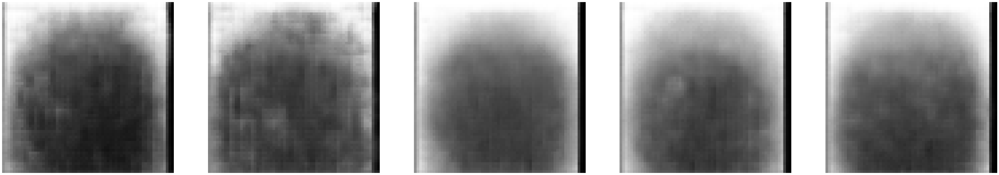

1/1 [==============================] - 0s 22ms/step


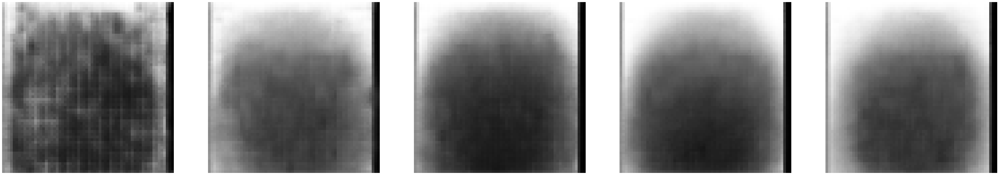

1/1 [==============================] - 0s 21ms/step


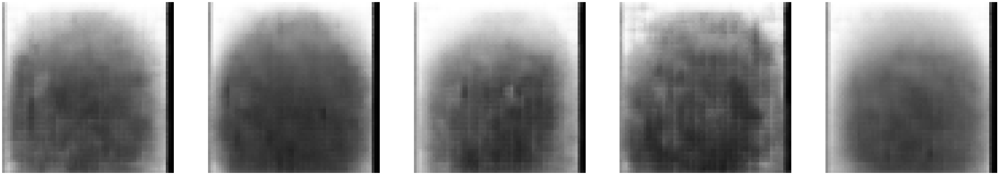

1/1 [==============================] - 0s 21ms/step


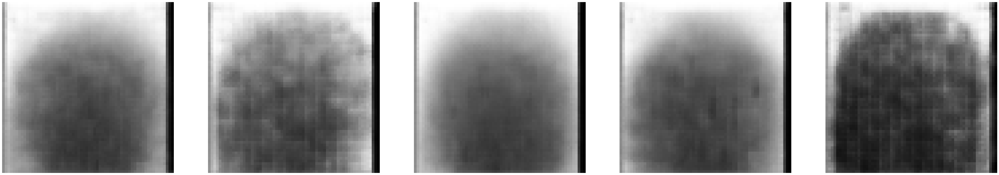

1/1 [==============================] - 0s 21ms/step


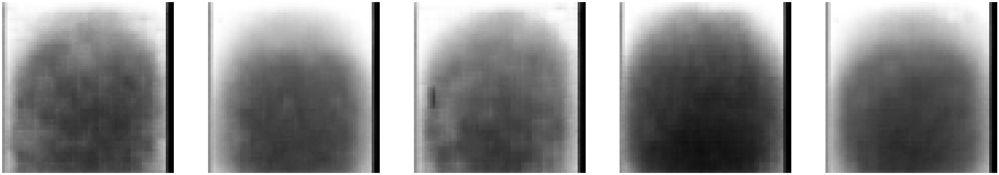

1/1 [==============================] - 0s 22ms/step


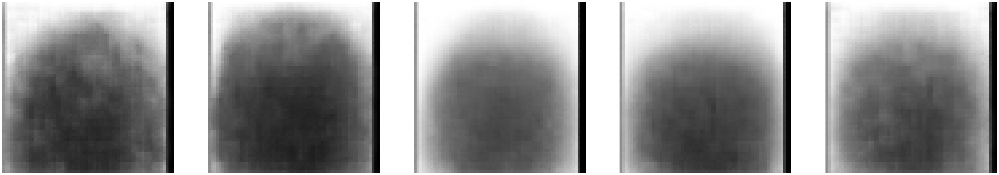

1/1 [==============================] - 0s 21ms/step


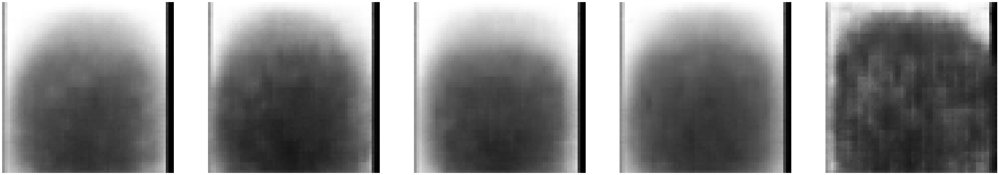

1/1 [==============================] - 0s 23ms/step


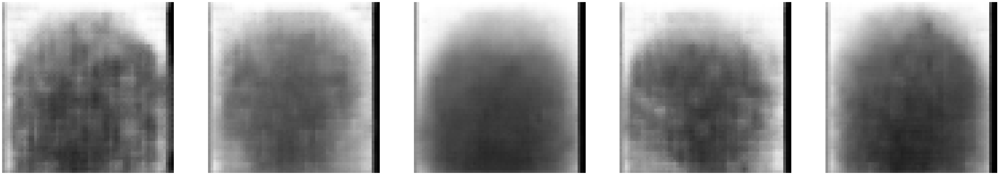

1/1 [==============================] - 0s 21ms/step


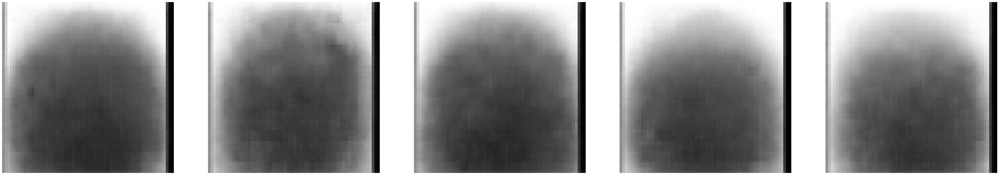

1/1 [==============================] - 0s 21ms/step


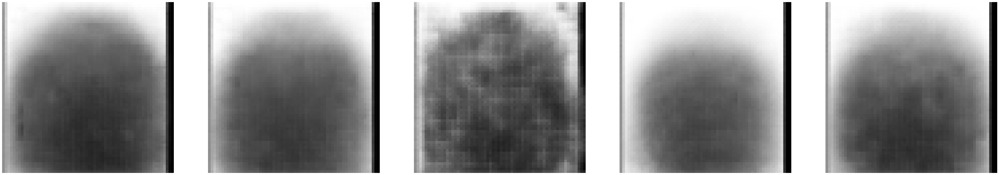

1/1 [==============================] - 0s 21ms/step


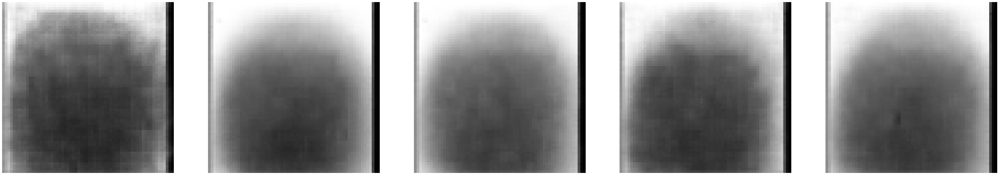

1/1 [==============================] - 0s 21ms/step


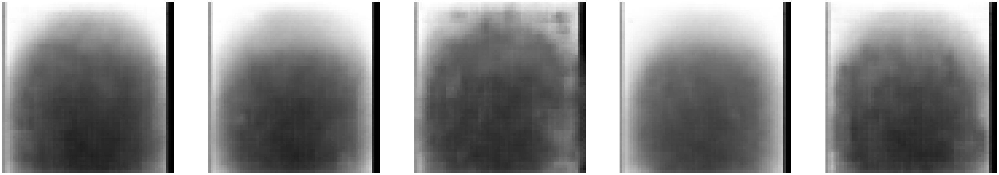

1/1 [==============================] - 0s 21ms/step


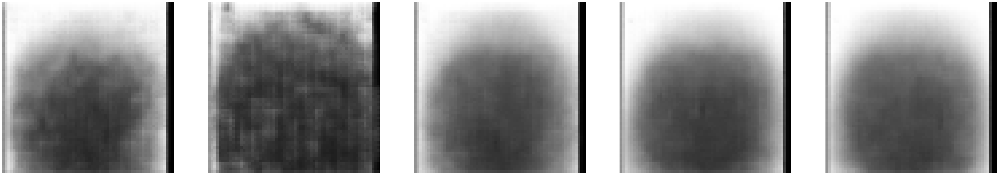

1/1 [==============================] - 0s 22ms/step


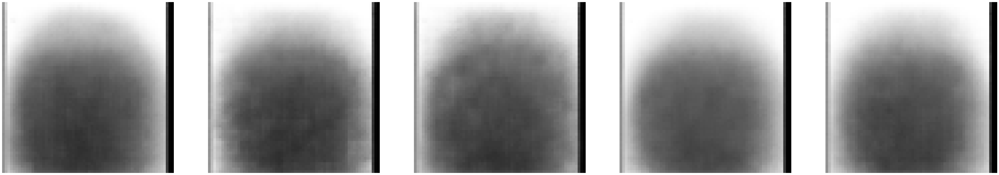

1/1 [==============================] - 0s 21ms/step


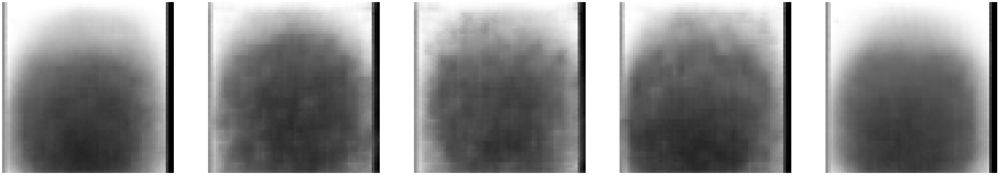

1/1 [==============================] - 0s 20ms/step


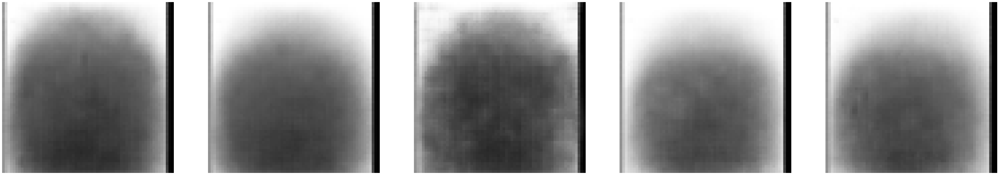

1/1 [==============================] - 0s 23ms/step


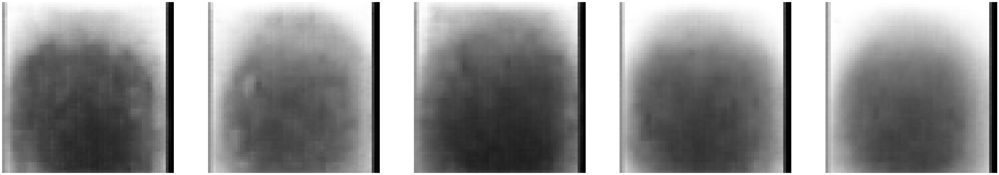

1/1 [==============================] - 0s 21ms/step


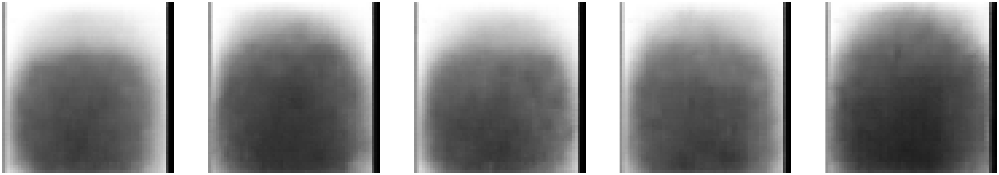

1/1 [==============================] - 0s 20ms/step


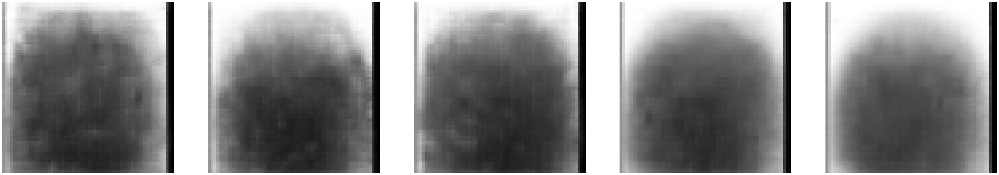

1/1 [==============================] - 0s 21ms/step


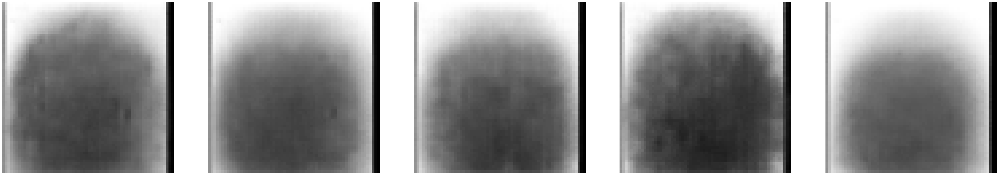

1/1 [==============================] - 0s 21ms/step


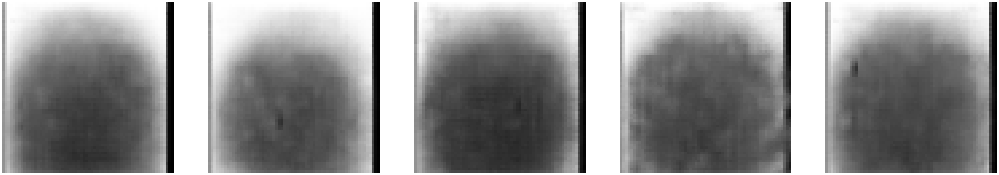

In [76]:

def generate_and_save_samples(epoch, vae, num_samples=5, save_path='VAE-1/generated_img'):
    # Generate random samples from the latent space
    latent_samples = np.random.normal(size=(num_samples, latent_dim))

    # Decode the samples
    generated_samples = vae.decoder.predict(latent_samples)

    # Rescale the samples
    generated_samples = (generated_samples + 1.0) / 2.0

    # Plot and save the samples
    plt.figure(figsize=(num_samples * 12, 12))
    for i in range(num_samples):
        plt.subplot(1, num_samples, i + 1)
        plt.imshow(generated_samples[i, :, :, 0], cmap='gray')
        plt.axis('off')
        
        # Save the image
        save_filename = f'{save_path}_{epoch:03d}_{i}.png'
        plt.savefig(save_filename)
    
    # Display the plot
    plt.show()
    plt.close()

# Training loop with added plotting and saving
epochs = 30
for epoch in range(epochs):
    
    vae.fit(dataset, batch_size=batch_size)
    # Plot and save samples at the end of each epoch
    generate_and_save_samples(epoch, vae)


## VAE 2end model
### Scaled β

In this section, we will define a beta which is scaled and changed based on the epoch. The parameter β is often referred to as the "KL divergence annealing factor" or "KL weight." where the total loss is composed of a reconstruction loss and a term that includes the Kullback-Leibler (KL) divergence multiplied by β.

The KL divergence measures the difference between two probability distributions. It is used to regularize the latent space. By adjusting the β parameter, we can control the trade-off between optimizing for reconstruction accuracy and ensuring that the learned latent space follows a certain distribution, usually a standard normal distribution.

The idea behind introducing β is to gradually increase its value during training, helping the model to initially focus more on reconstruction and less on enforcing a specific structure in the latent space. As training progresses, the emphasis shifts towards a more regularized latent space.

In [140]:
tf.keras.backend.clear_session()

In [141]:
latent_dim = 128
def build_encoder(latent_dim=128):
    encoder_inputs = tf.keras.Input(shape=(64, 64, 1))
    x = tf.keras.layers.Conv2D(32, 3, activation="relu", strides=2, padding="same")(encoder_inputs)
    x = tf.keras.layers.Conv2D(64, 3, activation="relu", strides=2, padding="same")(x)
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(16, activation="relu")(x)
    z_mean = tf.keras.layers.Dense(latent_dim, name="z_mean")(x)               # MEAN
    z_log_var = tf.keras.layers.Dense(latent_dim, name="z_log_var")(x)         # LOG OF VARIANCE = log(sigma**2)
    return tf.keras.Model(encoder_inputs, [z_mean, z_log_var], name="encoder") 
encoder = build_encoder(latent_dim=latent_dim)

In [142]:
class Sampler(tf.keras.layers.Layer):
    """From a mean mu and a log variance, sample a number with mu + sigma * epsilon"""
    def call(self, z_mean, z_log_var):
        batch_size = tf.shape(z_mean)[0]
        z_size = tf.shape(z_mean)[1]
        epsilon = tf.random.normal(shape=(batch_size, z_size)) 
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon      # this is equivalent to mu + sigma * epsilon

In [143]:
def build_decoder(latent_dim=128):
    latent_inputs = tf.keras.Input(shape=(latent_dim,))
    x = tf.keras.layers.Dense(16 * 16 * 64, activation="relu")(latent_inputs)
    x = tf.keras.layers.Reshape((16, 16, 64))(x)
    x = tf.keras.layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(x) 
    x = tf.keras.layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
    decoder_outputs = tf.keras.layers.Conv2D(1, 3, activation="sigmoid", padding="same")(x)
    return tf.keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder = build_decoder(latent_dim=latent_dim)

In [144]:
class VAE(tf.keras.Model):
    def __init__(self, encoder, decoder, beta=1.0, **kwargs):
        super().__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.sampler = Sampler()
        self.total_loss_tracker = tf.keras.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = tf.keras.metrics.Mean(
            name="reconstruction_loss"
        )
        self.kl_loss_tracker = tf.keras.metrics.Mean(name="kl_loss")
        self.beta = beta
        self.beta_schedule = linear_annealing_schedule  # beta schedule function
        self.epoch = 0  # Initialize epoch

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker
        ]

    def set_beta_schedule(self, schedule):
        self.beta_schedule = schedule
        
    def set_epoch(self, epoch):
        self.epoch = epoch

    def train_step(self, data):
        with tf.GradientTape() as tape:
            z_mean, z_log_var = self.encoder(data)
            z = self.sampler(z_mean, z_log_var)
            reconstruction = self.decoder(z)

            reconstruction_loss = tf.reduce_mean(
                tf.reduce_sum(
                    tf.keras.losses.binary_crossentropy(data, reconstruction),
                    axis=(1, 2)
                )
            )

        # Calculate beta using an annealing schedule
            current_beta = self.beta_schedule(self.epoch) 

            kl_loss = -0.5 * tf.reduce_sum(1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var), axis=1)
            kl_loss = tf.reduce_mean(kl_loss)

            total_loss = reconstruction_loss + current_beta * kl_loss

        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))

        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)

        return {
            "total_loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }


Below, we define the formula for the linear annealing schedule. The formula for the linear annealing schedule is designed to control the increase of the hyperparameter β over the course of training in a linear manner.

In [145]:
def linear_annealing_schedule(epoch, max_epoch=30, initial_beta=1.0, final_beta=5.0):
    return min(final_beta, initial_beta + (final_beta - initial_beta) * epoch / max_epoch)

vae = VAE(encoder, decoder, beta=1.0)
vae.set_beta_schedule(linear_annealing_schedule)
vae.compile(optimizer=tf.keras.optimizers.Adam(), loss='MSE')


1/1 [==============================] - 0s 80ms/step


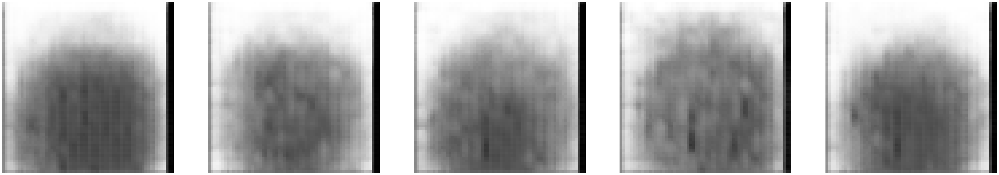

Epoch 1/30, Loss: 2308.5556640625, Reconstruction Loss: 2308.402099609375, KL Loss: 0.15254206955432892
1/1 [==============================] - 0s 20ms/step


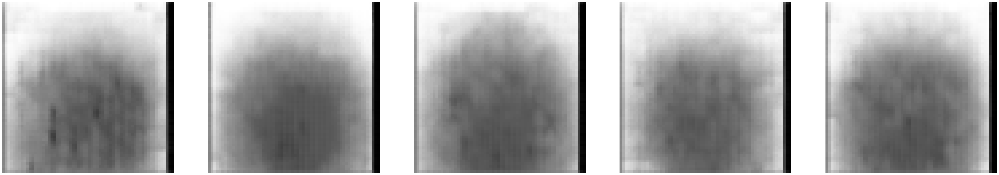

Epoch 2/30, Loss: 2154.045654296875, Reconstruction Loss: 2153.524658203125, KL Loss: 0.520496129989624
1/1 [==============================] - 0s 21ms/step


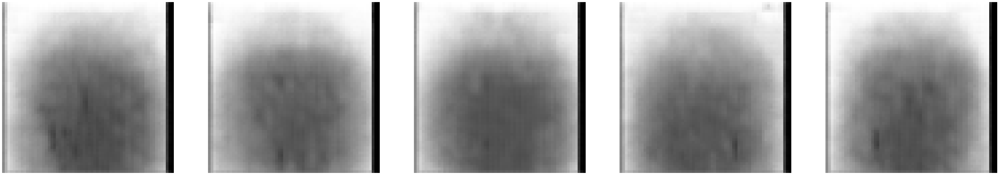

Epoch 3/30, Loss: 2148.55859375, Reconstruction Loss: 2147.680419921875, KL Loss: 0.8780615925788879
1/1 [==============================] - 0s 20ms/step


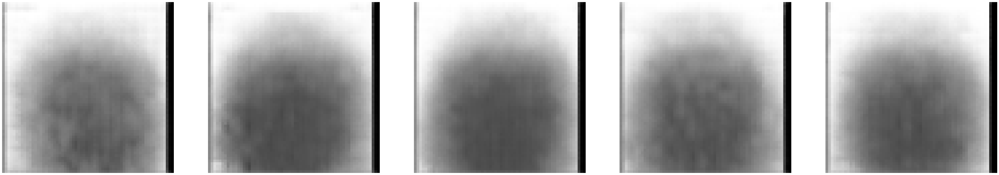

Epoch 4/30, Loss: 2142.9697265625, Reconstruction Loss: 2141.8037109375, KL Loss: 1.165971040725708
1/1 [==============================] - 0s 20ms/step


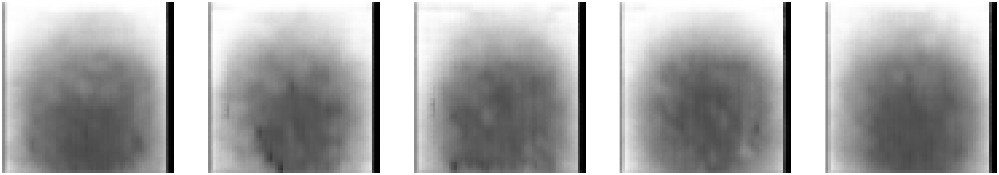

Epoch 5/30, Loss: 2141.331298828125, Reconstruction Loss: 2139.980712890625, KL Loss: 1.3505346775054932
1/1 [==============================] - 0s 22ms/step


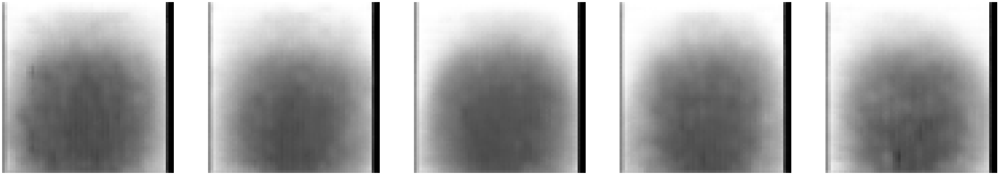

Epoch 6/30, Loss: 2140.198486328125, Reconstruction Loss: 2138.696533203125, KL Loss: 1.502011775970459
1/1 [==============================] - 0s 20ms/step


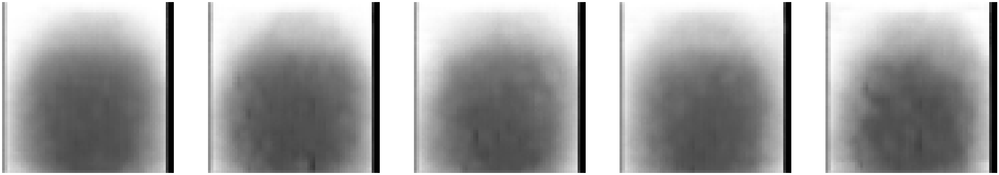

Epoch 7/30, Loss: 2139.571533203125, Reconstruction Loss: 2137.967529296875, KL Loss: 1.6042557954788208
1/1 [==============================] - 0s 21ms/step


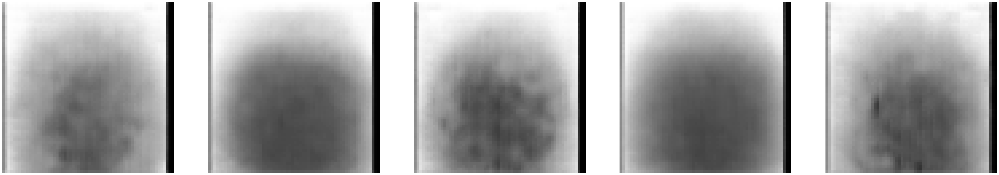

Epoch 8/30, Loss: 2139.35400390625, Reconstruction Loss: 2137.69873046875, KL Loss: 1.6551153659820557
1/1 [==============================] - 0s 20ms/step


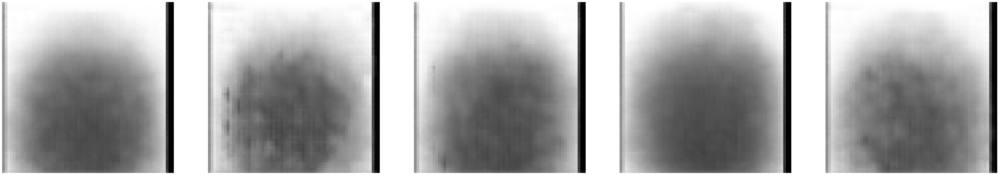

Epoch 9/30, Loss: 2137.616455078125, Reconstruction Loss: 2135.9453125, KL Loss: 1.6707828044891357
1/1 [==============================] - 0s 22ms/step


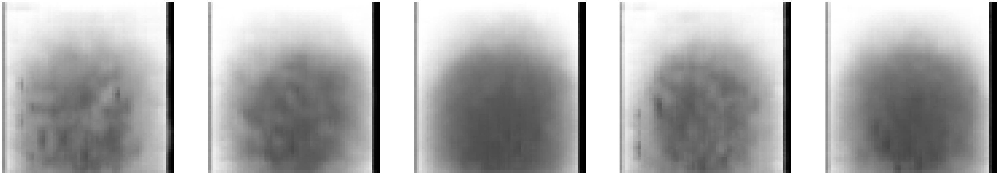

Epoch 10/30, Loss: 2137.82421875, Reconstruction Loss: 2136.161376953125, KL Loss: 1.663095474243164
1/1 [==============================] - 0s 21ms/step


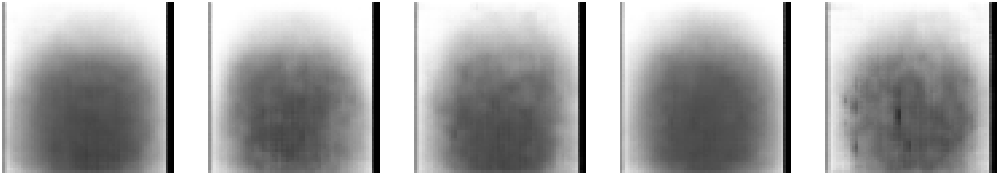

Epoch 11/30, Loss: 2137.707275390625, Reconstruction Loss: 2136.063720703125, KL Loss: 1.6433603763580322
1/1 [==============================] - 0s 20ms/step


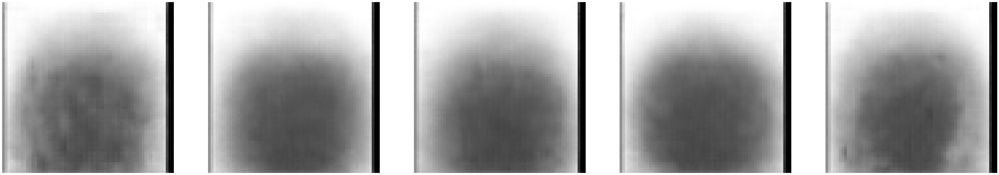

Epoch 12/30, Loss: 2137.293701171875, Reconstruction Loss: 2135.682373046875, KL Loss: 1.6113841533660889
1/1 [==============================] - 0s 20ms/step


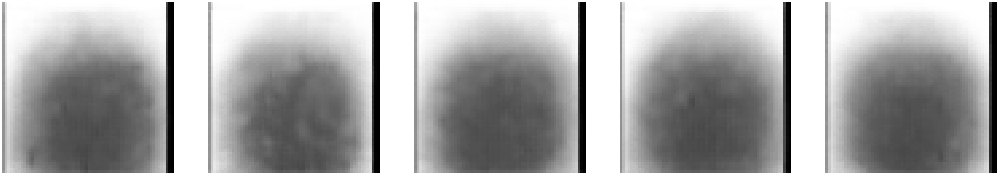

Epoch 13/30, Loss: 2136.210205078125, Reconstruction Loss: 2134.609619140625, KL Loss: 1.6014100313186646
1/1 [==============================] - 0s 21ms/step


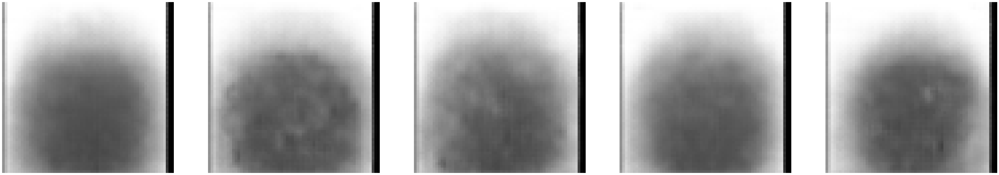

Epoch 14/30, Loss: 2136.6201171875, Reconstruction Loss: 2135.043212890625, KL Loss: 1.5766408443450928
1/1 [==============================] - 0s 20ms/step


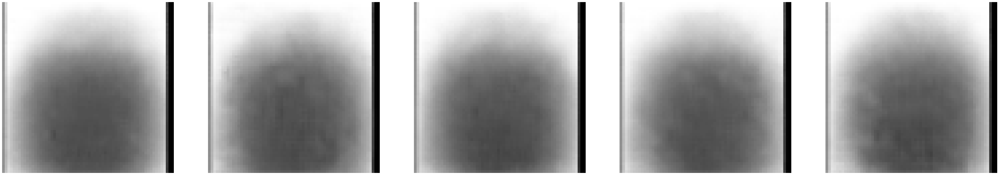

Epoch 15/30, Loss: 2136.647705078125, Reconstruction Loss: 2135.0830078125, KL Loss: 1.5640841722488403
1/1 [==============================] - 0s 19ms/step


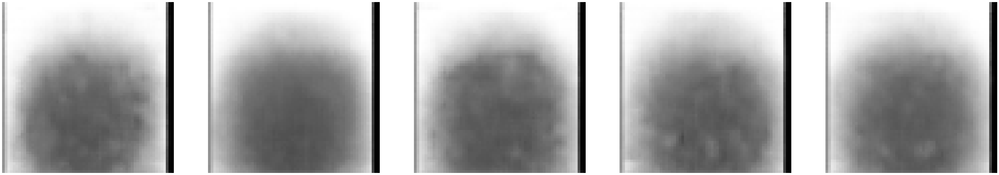

Epoch 16/30, Loss: 2135.982177734375, Reconstruction Loss: 2134.435791015625, KL Loss: 1.5462169647216797
1/1 [==============================] - 0s 20ms/step


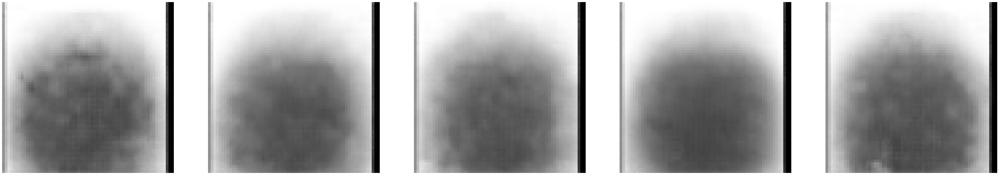

Epoch 17/30, Loss: 2136.065673828125, Reconstruction Loss: 2134.56591796875, KL Loss: 1.499613642692566
1/1 [==============================] - 0s 20ms/step


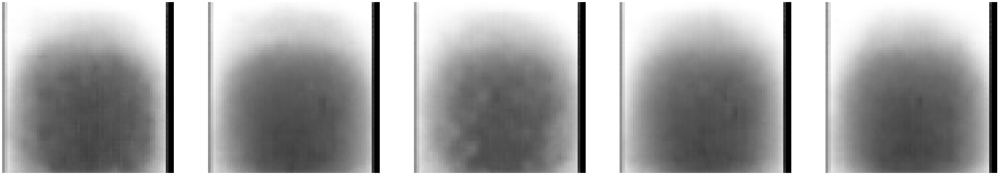

Epoch 18/30, Loss: 2135.59130859375, Reconstruction Loss: 2134.188720703125, KL Loss: 1.4027162790298462
1/1 [==============================] - 0s 20ms/step


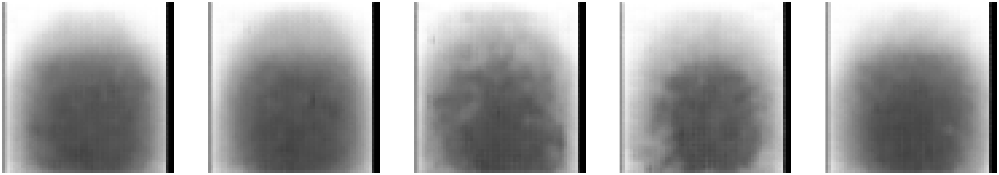

Epoch 19/30, Loss: 2136.468505859375, Reconstruction Loss: 2135.0654296875, KL Loss: 1.4040504693984985
1/1 [==============================] - 0s 21ms/step


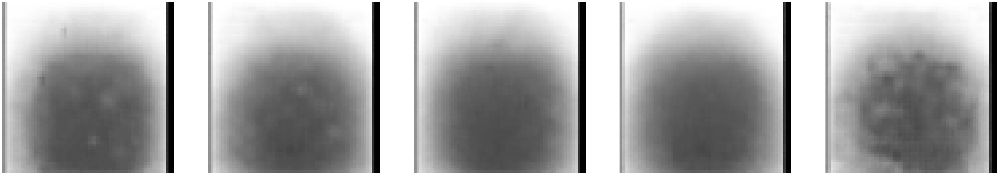

Epoch 20/30, Loss: 2135.7744140625, Reconstruction Loss: 2134.36279296875, KL Loss: 1.411332130432129
1/1 [==============================] - 0s 21ms/step


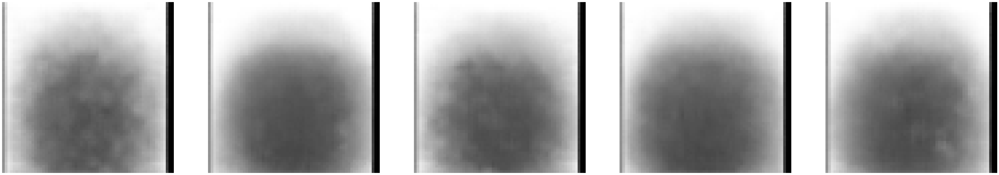

Epoch 21/30, Loss: 2134.944580078125, Reconstruction Loss: 2133.53662109375, KL Loss: 1.408372402191162
1/1 [==============================] - 0s 22ms/step


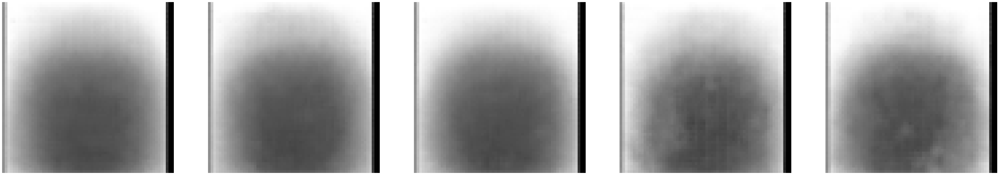

Epoch 22/30, Loss: 2134.975341796875, Reconstruction Loss: 2133.666015625, KL Loss: 1.3087246417999268
1/1 [==============================] - 0s 24ms/step


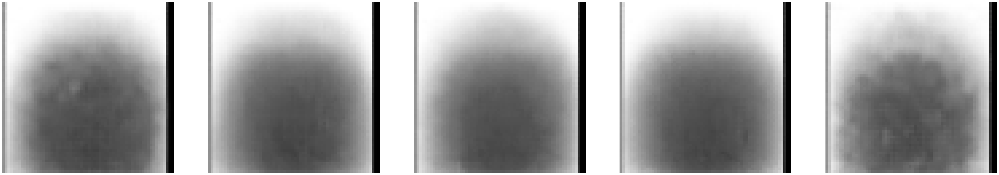

Epoch 23/30, Loss: 2134.66064453125, Reconstruction Loss: 2133.4091796875, KL Loss: 1.2506132125854492
1/1 [==============================] - 0s 22ms/step


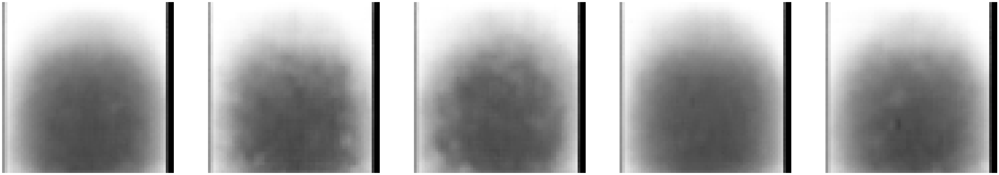

Epoch 24/30, Loss: 2134.842041015625, Reconstruction Loss: 2133.609619140625, KL Loss: 1.2326668500900269
1/1 [==============================] - 0s 22ms/step


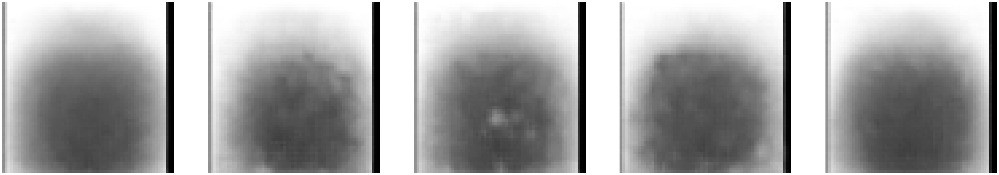

Epoch 25/30, Loss: 2134.795654296875, Reconstruction Loss: 2133.63818359375, KL Loss: 1.1560746431350708
1/1 [==============================] - 0s 24ms/step


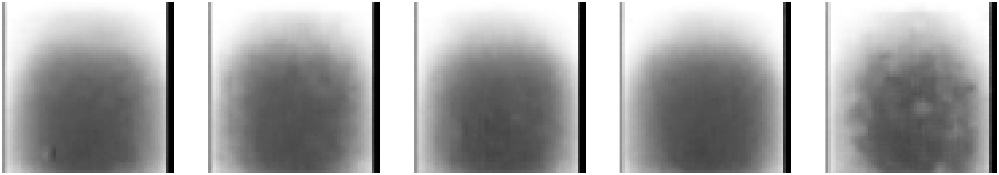

Epoch 26/30, Loss: 2134.348876953125, Reconstruction Loss: 2133.19970703125, KL Loss: 1.1493788957595825
1/1 [==============================] - 0s 21ms/step


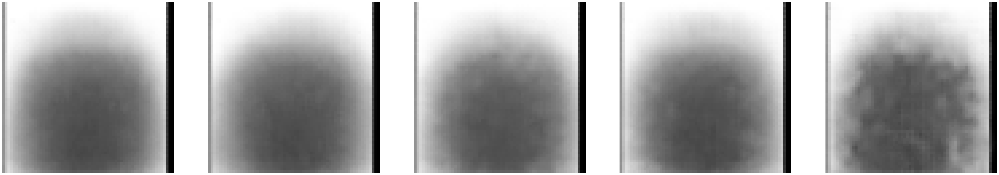

Epoch 27/30, Loss: 2134.859619140625, Reconstruction Loss: 2133.688232421875, KL Loss: 1.171392560005188
1/1 [==============================] - 0s 21ms/step


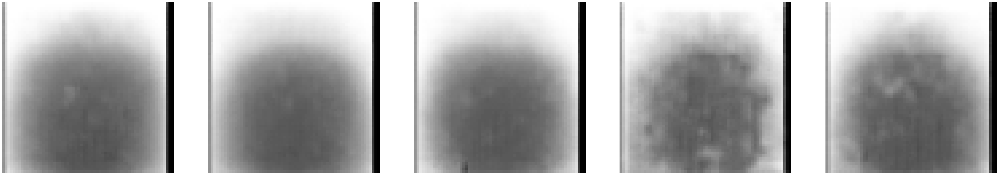

Epoch 28/30, Loss: 2134.8388671875, Reconstruction Loss: 2133.686767578125, KL Loss: 1.1515376567840576
1/1 [==============================] - 0s 21ms/step


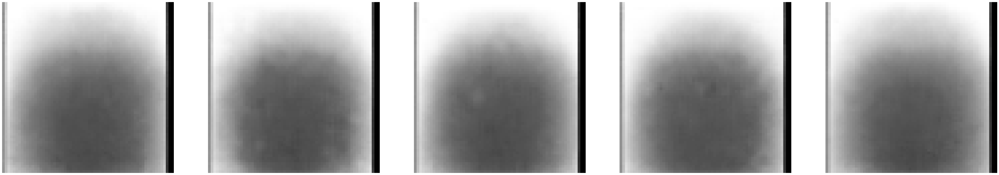

Epoch 29/30, Loss: 2134.235107421875, Reconstruction Loss: 2133.162841796875, KL Loss: 1.0718131065368652
1/1 [==============================] - 0s 20ms/step


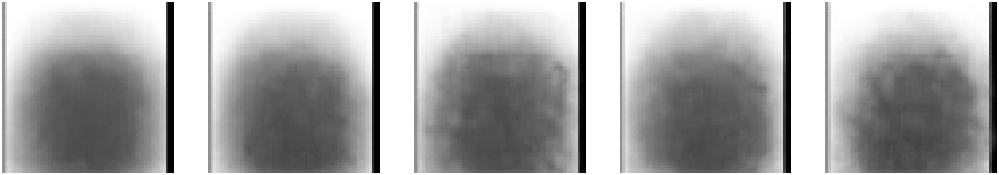

Epoch 30/30, Loss: 2133.5751953125, Reconstruction Loss: 2132.542724609375, KL Loss: 1.0327472686767578


In [146]:
#generate and plot samples from the VAE 
def generate_and_save_samples(epoch, vae, num_samples=5, save_path='VAE-2/generated_img'):
    # Generate random samples from the latent space
    latent_samples = np.random.normal(size=(num_samples, latent_dim))

    # Decode the samples
    generated_samples = vae.decoder.predict(latent_samples)

    # Rescale the samples
    generated_samples = (generated_samples + 1.0) / 2.0

    # Plot
    plt.figure(figsize=(num_samples * 12, 12))
    for i in range(num_samples):
        plt.subplot(1, num_samples, i + 1)
        plt.imshow(generated_samples[i, :, :, 0], cmap='gray')
        plt.axis('off')
        
        # Save the image
        save_filename = f'{save_path}_{epoch:03d}_{i}.png'
        plt.savefig(save_filename)
    
    # Display the plot
    plt.show()
    plt.close()

# Training loop with added plotting and saving
epochs = 30
for epoch in range(epochs):
    history = vae.fit(dataset, batch_size=batch_size, epochs=1, verbose=1)  # Pass the current epoch value

    # Update the epoch value for the beta schedule
    vae.set_epoch(epoch)

    # Plot and save samples at the end of each epoch
    generate_and_save_samples(epoch, vae)

    # Print training progress
    print(f"Epoch {epoch + 1}/{epochs}, Loss: {history.history['total_loss'][0]}, "
          f"Reconstruction Loss: {history.history['reconstruction_loss'][0]}, "
          f"KL Loss: {history.history['kl_loss'][0]}")


## VAE 3rd model
### Change encoder and decoder structure

David Foster(20019) noted: "Decoder doesn’t have to be a mirror image of the encoder. It can be anything you want, as long as the output from the last layer of the decoder is the same size as the input to the encoder (since our loss function will be comparing these pixel-wise)"
Therefore, I am going to change the structure of my encoder and decoder.

In [147]:
tf.keras.backend.clear_session()

In [148]:
latent_dim = 128
def build_encoder(latent_dim=128):
    encoder_inputs = tf.keras.Input(shape=(64, 64, 1))
    x = tf.keras.layers.Conv2D(32, 3, strides=2, padding="same")(encoder_inputs)
    x = tf.keras.layers.BatchNormalization(axis=-1)(x)
    x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)
    x = tf.keras.layers.Dropout(0.2)(x)
    x = tf.keras.layers.Conv2D(64, 3, strides=2, padding="same")(x)
    x = tf.keras.layers.BatchNormalization(axis=-1)(x)
    x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)
    x = tf.keras.layers.Dropout(0.2)(x)
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(16, activation="relu")(x)
    z_mean = tf.keras.layers.Dense(latent_dim, name="z_mean")(x)               # MEAN
    z_log_var = tf.keras.layers.Dense(latent_dim, name="z_log_var")(x)         # LOG OF VARIANCE = log(sigma**2)
    return tf.keras.Model(encoder_inputs, [z_mean, z_log_var], name="encoder") 
encoder = build_encoder(latent_dim=latent_dim)

In [149]:
encoder.summary()

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 64, 64, 1)]          0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 32, 32, 32)           320       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 32, 32, 32)           128       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 32)           0         ['batch_normalization[0]

In [150]:
class Sampler(tf.keras.layers.Layer):
    """From a mean mu and a log variance, sample a number with mu + sigma * epsilon"""
    def call(self, z_mean, z_log_var):
        batch_size = tf.shape(z_mean)[0]
        z_size = tf.shape(z_mean)[1]
        epsilon = tf.random.normal(shape=(batch_size, z_size)) 
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon      # this is equivalent to mu + sigma * epsilon

In [151]:
def build_decoder(latent_dim=128):
    latent_inputs = tf.keras.Input(shape=(latent_dim,))
    x = tf.keras.layers.Dense(16 * 16 * 64, activation="relu")(latent_inputs)
    x = tf.keras.layers.Reshape((16, 16, 64))(x)
    x = tf.keras.layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(x) 
    x = tf.keras.layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
    decoder_outputs = tf.keras.layers.Conv2D(1, 3, activation="relu", padding="same")(x)
    return tf.keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder = build_decoder(latent_dim=latent_dim)

In [152]:
decoder.summary()

Model: "decoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 128)]             0         
                                                                 
 dense_1 (Dense)             (None, 16384)             2113536   
                                                                 
 reshape (Reshape)           (None, 16, 16, 64)        0         
                                                                 
 conv2d_transpose (Conv2DTr  (None, 32, 32, 64)        36928     
 anspose)                                                        
                                                                 
 conv2d_transpose_1 (Conv2D  (None, 64, 64, 32)        18464     
 Transpose)                                                      
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 1)         289 

In [153]:
class VAE(tf.keras.Model):
    def __init__(self, encoder, decoder, beta=1.0, **kwargs):
        super().__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.sampler = Sampler()
        self.total_loss_tracker = tf.keras.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = tf.keras.metrics.Mean(
            name="reconstruction_loss"
        )
        self.kl_loss_tracker = tf.keras.metrics.Mean(name="kl_loss")
        self.beta = beta
        self.beta_schedule = linear_annealing_schedule  # beta schedule function
        self.epoch = 0  # Initialize epoch

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker
        ]

    def set_beta_schedule(self, schedule):
        self.beta_schedule = schedule
        
    def set_epoch(self, epoch):
        self.epoch = epoch

    def train_step(self, data):
        with tf.GradientTape() as tape:
            z_mean, z_log_var = self.encoder(data)
            z = self.sampler(z_mean, z_log_var)
            reconstruction = self.decoder(z)

            reconstruction_loss = tf.reduce_mean(
                tf.reduce_sum(
                    tf.keras.losses.binary_crossentropy(data, reconstruction),
                    axis=(1, 2)
                )
            )

        # Calculate beta using an annealing schedule
            current_beta = self.beta_schedule(self.epoch)  

            kl_loss = -0.5 * tf.reduce_sum(1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var), axis=1)
            kl_loss = tf.reduce_mean(kl_loss)

            total_loss = reconstruction_loss + current_beta * kl_loss

        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))

        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)

        return {
            "total_loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }


1/1 [==============================] - 0s 40ms/step


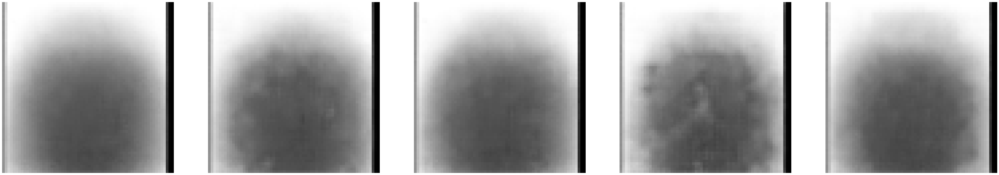

Epoch 1/30, Loss: 2133.516845703125, Reconstruction Loss: 2132.4736328125, KL Loss: 1.0427608489990234
1/1 [==============================] - 0s 22ms/step


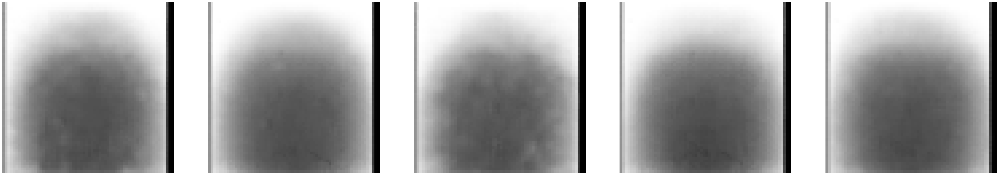

Epoch 2/30, Loss: 2133.196533203125, Reconstruction Loss: 2132.19970703125, KL Loss: 0.9968434572219849
1/1 [==============================] - 0s 20ms/step


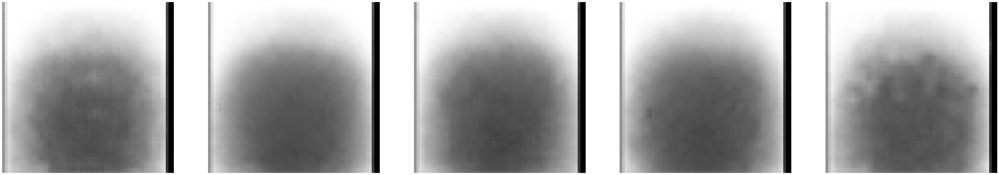

Epoch 3/30, Loss: 2133.84130859375, Reconstruction Loss: 2132.892578125, KL Loss: 0.9492956399917603
1/1 [==============================] - 0s 20ms/step


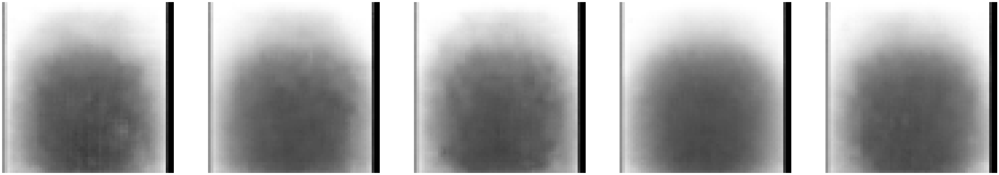

Epoch 4/30, Loss: 2133.303466796875, Reconstruction Loss: 2132.382080078125, KL Loss: 0.9211693406105042
1/1 [==============================] - 0s 19ms/step


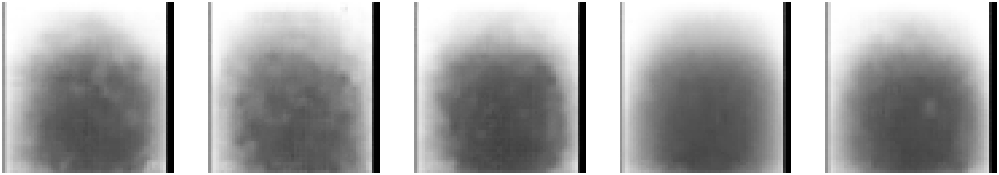

Epoch 5/30, Loss: 2133.1611328125, Reconstruction Loss: 2132.28173828125, KL Loss: 0.8793584108352661
1/1 [==============================] - 0s 20ms/step


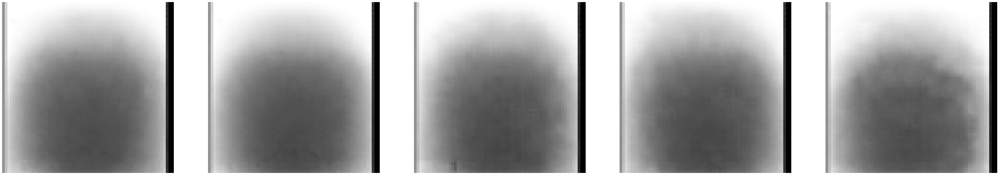

Epoch 6/30, Loss: 2133.271728515625, Reconstruction Loss: 2132.429443359375, KL Loss: 0.8432337045669556
1/1 [==============================] - 0s 20ms/step


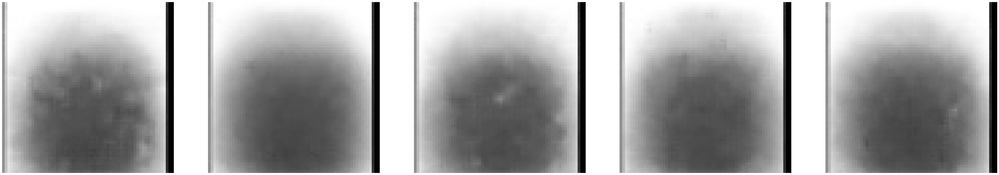

Epoch 7/30, Loss: 2132.468994140625, Reconstruction Loss: 2131.6376953125, KL Loss: 0.8306911587715149
1/1 [==============================] - 0s 20ms/step


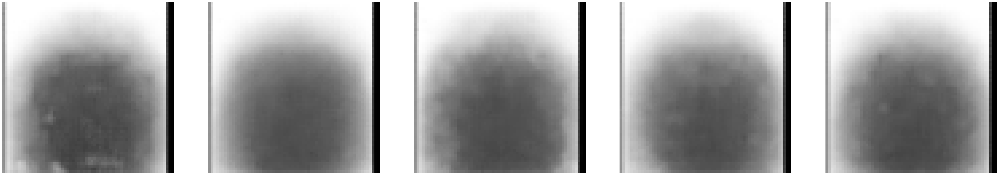

Epoch 8/30, Loss: 2133.963134765625, Reconstruction Loss: 2133.19677734375, KL Loss: 0.7672693729400635
1/1 [==============================] - 0s 21ms/step


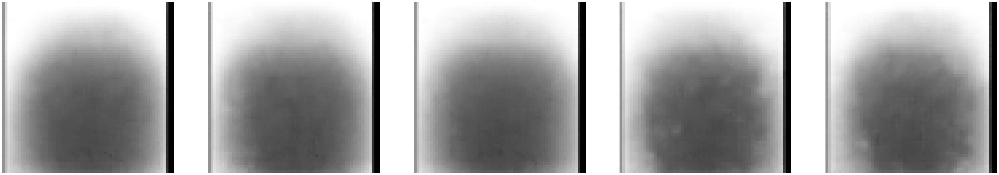

Epoch 9/30, Loss: 2133.387939453125, Reconstruction Loss: 2132.629150390625, KL Loss: 0.7587447762489319
1/1 [==============================] - 0s 21ms/step


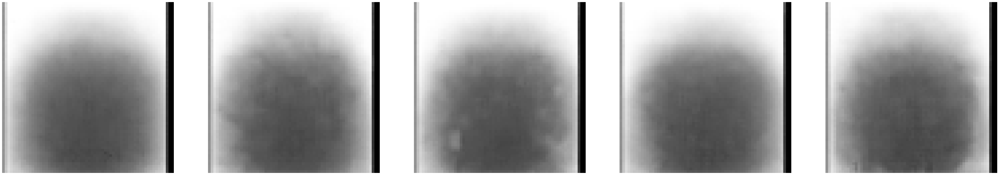

Epoch 10/30, Loss: 2133.010009765625, Reconstruction Loss: 2132.2548828125, KL Loss: 0.754999041557312
1/1 [==============================] - 0s 21ms/step


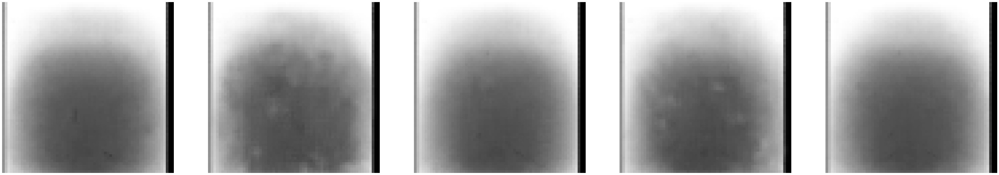

Epoch 11/30, Loss: 2132.764892578125, Reconstruction Loss: 2132.064208984375, KL Loss: 0.7009429931640625
1/1 [==============================] - 0s 21ms/step


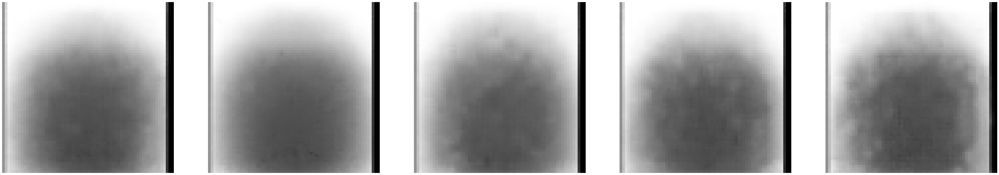

Epoch 12/30, Loss: 2132.906982421875, Reconstruction Loss: 2132.254638671875, KL Loss: 0.652355968952179
1/1 [==============================] - 0s 20ms/step


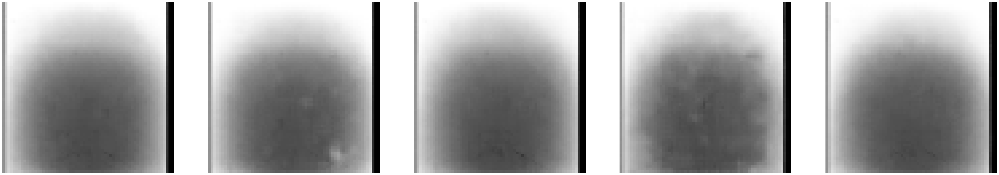

Epoch 13/30, Loss: 2132.7529296875, Reconstruction Loss: 2132.11474609375, KL Loss: 0.6389088034629822
1/1 [==============================] - 0s 19ms/step


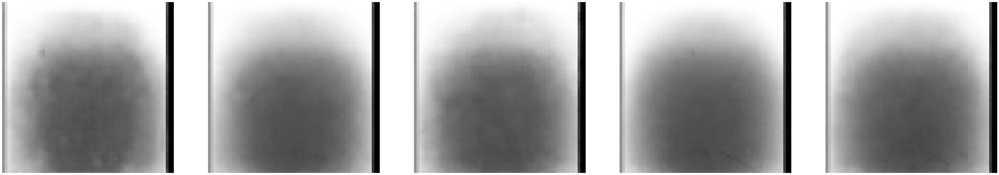

Epoch 14/30, Loss: 2132.7314453125, Reconstruction Loss: 2132.09326171875, KL Loss: 0.6384472250938416
1/1 [==============================] - 0s 20ms/step


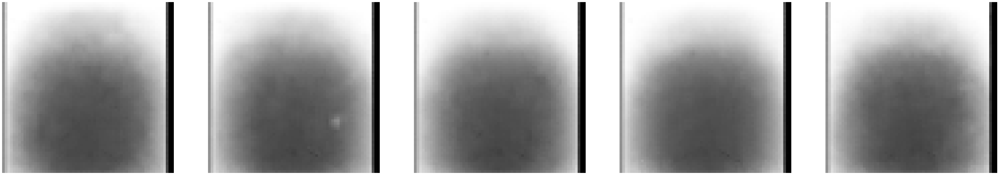

Epoch 15/30, Loss: 2133.061767578125, Reconstruction Loss: 2132.44970703125, KL Loss: 0.611302375793457
1/1 [==============================] - 0s 20ms/step


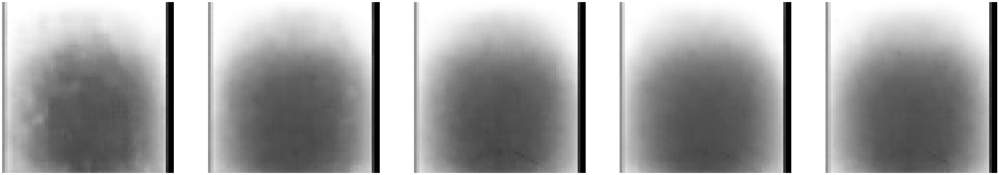

Epoch 16/30, Loss: 2132.02001953125, Reconstruction Loss: 2131.484375, KL Loss: 0.5358657240867615
1/1 [==============================] - 0s 20ms/step


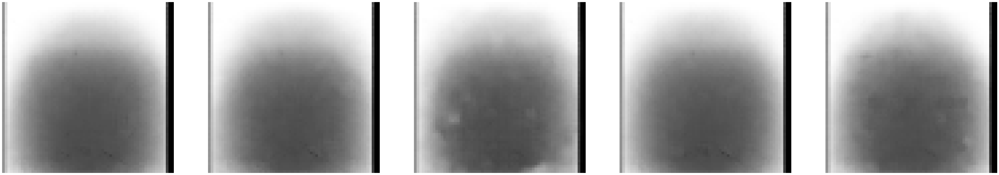

Epoch 17/30, Loss: 2133.17431640625, Reconstruction Loss: 2132.66845703125, KL Loss: 0.5047585368156433
1/1 [==============================] - 0s 19ms/step


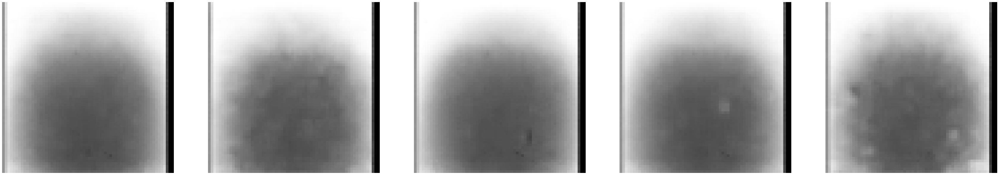

Epoch 18/30, Loss: 2133.2158203125, Reconstruction Loss: 2132.70654296875, KL Loss: 0.5088583827018738
1/1 [==============================] - 0s 21ms/step


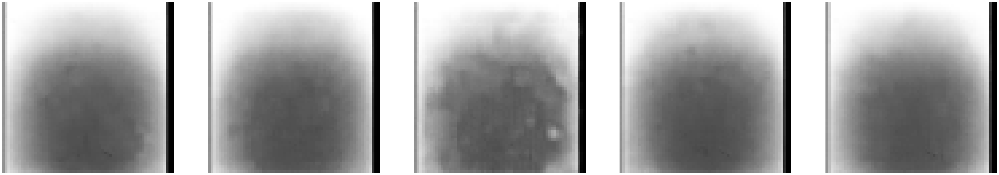

Epoch 19/30, Loss: 2132.68896484375, Reconstruction Loss: 2132.187255859375, KL Loss: 0.501062273979187
1/1 [==============================] - 0s 19ms/step


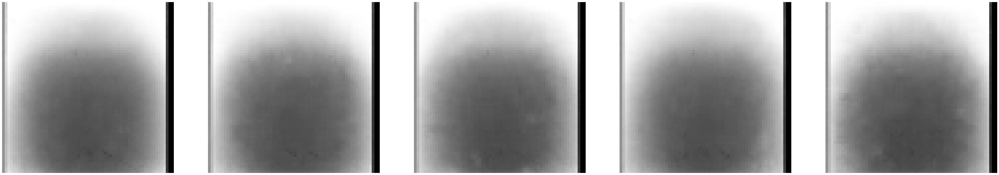

Epoch 20/30, Loss: 2131.96337890625, Reconstruction Loss: 2131.47900390625, KL Loss: 0.4839080274105072
1/1 [==============================] - 0s 19ms/step


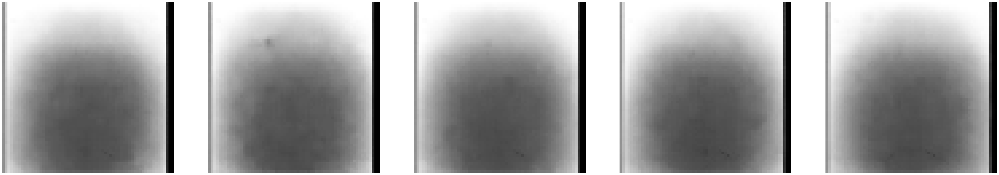

Epoch 21/30, Loss: 2132.136474609375, Reconstruction Loss: 2131.688720703125, KL Loss: 0.4476180076599121
1/1 [==============================] - 0s 19ms/step


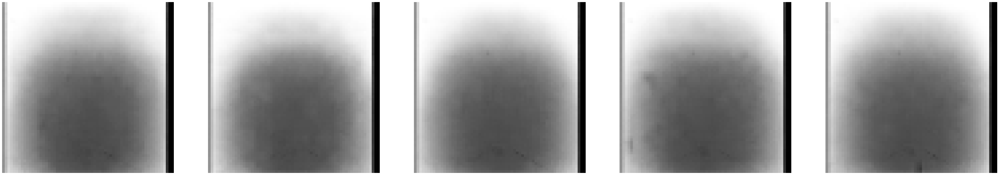

Epoch 22/30, Loss: 2131.69287109375, Reconstruction Loss: 2131.2646484375, KL Loss: 0.42821061611175537
1/1 [==============================] - 0s 20ms/step


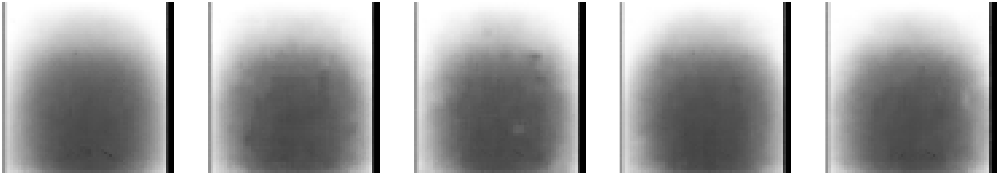

Epoch 23/30, Loss: 2132.079833984375, Reconstruction Loss: 2131.654541015625, KL Loss: 0.4246481955051422
1/1 [==============================] - 0s 19ms/step


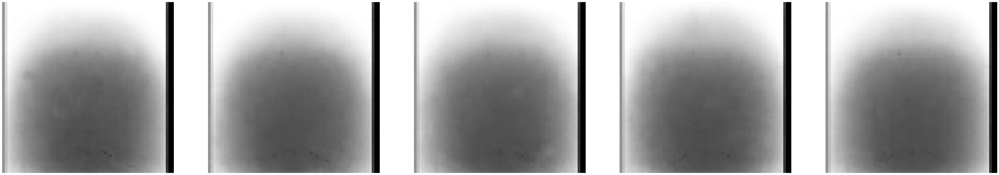

Epoch 24/30, Loss: 2132.025390625, Reconstruction Loss: 2131.615478515625, KL Loss: 0.4100533723831177
1/1 [==============================] - 0s 19ms/step


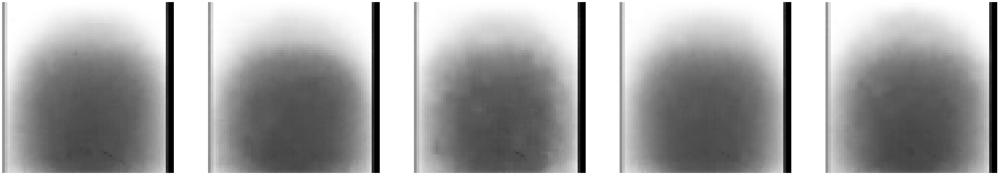

Epoch 25/30, Loss: 2131.53466796875, Reconstruction Loss: 2131.16064453125, KL Loss: 0.37392091751098633
1/1 [==============================] - 0s 19ms/step


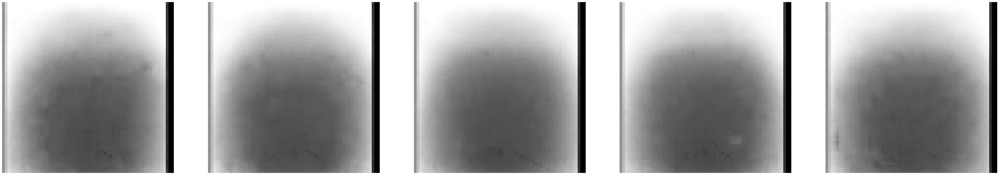

Epoch 26/30, Loss: 2131.86181640625, Reconstruction Loss: 2131.4892578125, KL Loss: 0.37315571308135986
1/1 [==============================] - 0s 21ms/step


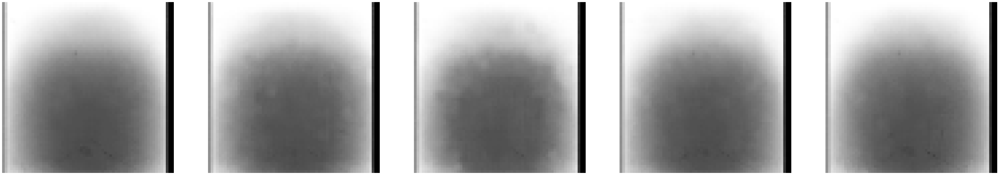

Epoch 27/30, Loss: 2131.613525390625, Reconstruction Loss: 2131.265380859375, KL Loss: 0.34750714898109436
1/1 [==============================] - 0s 22ms/step


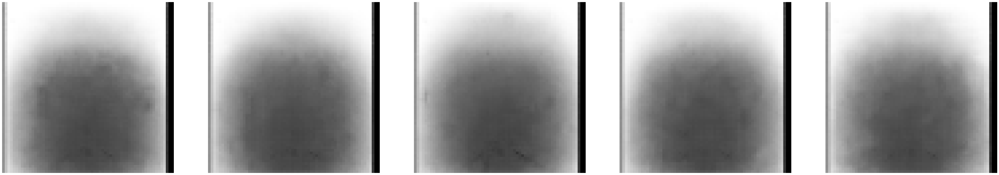

Epoch 28/30, Loss: 2131.98876953125, Reconstruction Loss: 2131.662841796875, KL Loss: 0.32571956515312195
1/1 [==============================] - 0s 22ms/step


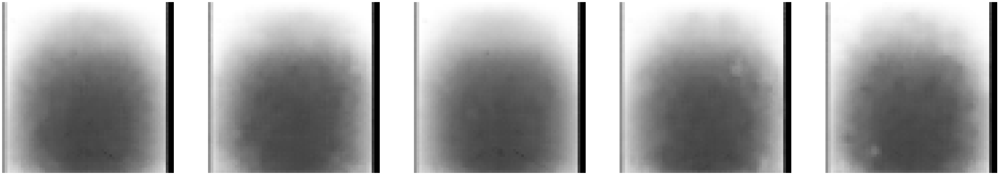

Epoch 29/30, Loss: 2131.912841796875, Reconstruction Loss: 2131.57763671875, KL Loss: 0.3348183035850525
1/1 [==============================] - 0s 21ms/step


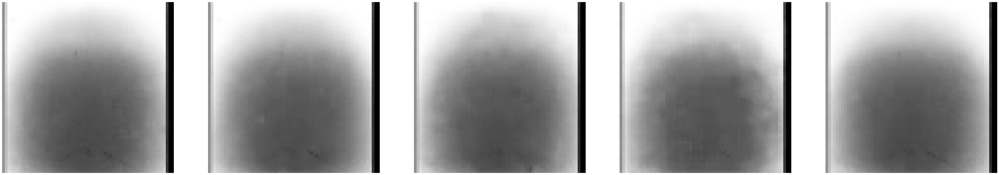

Epoch 30/30, Loss: 2131.290283203125, Reconstruction Loss: 2130.996826171875, KL Loss: 0.2931452989578247


In [154]:

def generate_and_save_samples(epoch, vae, num_samples=5, save_path='VAE-3/generated_img'):
    # Generate random samples from the latent space
    latent_samples = np.random.normal(size=(num_samples, latent_dim))

    # Decode the samples
    generated_samples = vae.decoder.predict(latent_samples)

    # Rescale the samples
    generated_samples = (generated_samples + 1.0) / 2.0

    # Plot and save the samples
    plt.figure(figsize=(num_samples * 12, 12))
    for i in range(num_samples):
        plt.subplot(1, num_samples, i + 1)
        plt.imshow(generated_samples[i, :, :, 0], cmap='gray')
        plt.axis('off')
        
        # Save the image
        save_filename = f'{save_path}_{epoch:03d}_{i}.png'
        plt.savefig(save_filename)
    
    # Display the plot
    plt.show()
    plt.close()

# Training loop with added plotting and saving
epochs = 30
for epoch in range(epochs):
    history = vae.fit(dataset, batch_size=batch_size, epochs=1, verbose=1)  # Pass the current epoch value

    # Update the epoch value for the beta schedule
    vae.set_epoch(epoch)

    # Plot and save samples at the end of each epoch
    generate_and_save_samples(epoch, vae)

    # Print training progress
    print(f"Epoch {epoch + 1}/{epochs}, Loss: {history.history['total_loss'][0]}, "
          f"Reconstruction Loss: {history.history['reconstruction_loss'][0]}, "
          f"KL Loss: {history.history['kl_loss'][0]}")


# Conclusion
In this coursework, I tried to use generative models in a fingerprint dataset. I tried to use different structures for GANs and VAEs. The outcome of none of the GANs that I made was similar to a fingerprint that looks new and the model was showing the area that was probable of a fingerprint existence. In using VAEs most of the outcomes are in a specific area, but the quality of the outcomes is low. Fingerprints have lots of detail and the model needs to be precise in imitating those details. keeping the pictures as they were without resizing them might help to achieve better results (unfortunately, due to computational limitations I had to resize them, otherwise my system crashed).